# Summary
This project aims to identify risk factors for autoimmune conditions, focusing on arthritis using the NHANES dataset (2017-2020) from the CDC, which includes data from approximately 15,000 participants. The dataset encompasses detailed demographic, dietary, laboratory, exam, and survey information.

Data preparation was extensive, involving extraction from XPT files, cleaning, encoding, and feature selection using domain knowledge and data dictionaries. Exploratory Data Analysis (EDA) was conducted iteratively, utilizing heatmaps for correlation visualization, histograms for distribution analysis, and boxplots for outlier detection and correction. The Random Forest algorithm was employed to identify important features, while XGBoost and LightGBM were tested for their performance, with XGBoost benefiting from GPU acceleration. Logistic Regression was used to assess the predictive power of features, leveraging scikit-learn for model training and statsmodels for p-value computation.

Random Forest identified key features influencing arthritis, handling missing target data effectively with -1 encoding. XGBoost demonstrated quick training times due to GPU support, whereas LightGBM, despite parameter tuning, underperformed without source compilation. Logistic Regression was used to identify features that had an affect on arthritis using p-values < .05 and was the main focus as it is the most accepted method for identifying risk factors.  F1 was the metric optimized for as it provides good class 1 recall balanced with how accurate that classification is.

The results were interpreted using domain knowledge, highlighting the significant predictors of arthritis. Future improvements include developing multiple feature sets and models, employing Variance Inflation Factor (VIF) to address multicollinearity, correcting data skewness, and using optuna to find hyper parameters. These steps can enhance the model's f1 score, giving us more accurate results.


# Detailed Overview

## Data Preparation

Data preparation was extensive, involving extraction from XPT files, cleaning, encoding, and feature selection using domain knowledge and data dictionaries. This process ensured the dataset was ready for analysis and modeling.

## Exploratory Data Analysis (EDA)

Exploratory Data Analysis (EDA) was conducted iteratively, utilizing various visualization techniques:

- **Heatmaps** for correlation visualization
- **Histograms** for distribution analysis
- **Boxplots** for outlier detection and correction

## Feature Selection and Modeling

### Random Forest

The Random Forest algorithm was used to identify important features influencing arthritis. It handled missing target data effectively using -1 encoding.

### XGBoost and LightGBM

XGBoost and LightGBM were tested for their performance:
- **XGBoost**: Demonstrated quick training times due to GPU support.
- **LightGBM**: Despite parameter tuning, it underperformed without source compilation.

### Logistic Regression

Logistic Regression was used to assess the predictive power of features. This method leveraged:
- **Scikit-learn**: For model training.
- **Statsmodels**: For p-value computation, focusing on features with p-values < .05.

## Key Findings

The results were interpreted using domain knowledge, highlighting the significant predictors of arthritis.  Visualizations and finding results at the conclusion at the end.

## Future Improvements

Future improvements include:
- Developing multiple feature sets and models.
- Employing Variance Inflation Factor (VIF) to address multicollinearity.
- Correcting data skewness.
- Using Optuna for hyperparameter optimization.

These steps are expected to enhance the model's F1 score, providing more accurate results.


# Imports

In [1]:
import math
import os
import pickle
import requests

import cupy as cp
import cudf

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

import pyreadstat

import scipy.cluster.hierarchy as sch
from scipy.stats import skew

import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

import optuna

import xgboost as xgb
import lightgbm as lgb

import tensorflow as tf
import keras
from keras import mixed_precision
from keras.layers import Dense, Dropout, Input
from keras.models import Sequential
from keras.optimizers import Adam, SGD
from scikeras.wrappers import KerasClassifier, KerasRegressor

from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import RandomForestClassifier
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, mean_squared_error, r2_score
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, cross_val_score, train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import FunctionTransformer, LabelEncoder

from cuml.ensemble import RandomForestClassifier as cuRandomForestClassifier
from cuml.linear_model import LinearRegression as cuLinearRegression
from cuml.linear_model import LogisticRegression as cuLogisticRegression
from cuml.model_selection import GridSearchCV
from cuml.preprocessing import StandardScaler

from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline as ImbPipeline

/home/atrix/anaconda3/envs/rapids_24.06/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2024-08-01 08:24:39.994126: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-08-01 08:24:40.019505: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:10575] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-08-01 08:24:40.019524: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:479] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-08-01

# Data Acquisition

The following section outlines the process of downloading and organizing the NHANES data files required for this analysis. The data is sourced from the CDC and includes various types of information ranging from demographics to lab results.

## File Downloader

All the files in `file_basenames` will be downloaded if they do not exist. This approach ensures that we always have the necessary files and can easily re-download any files on other machines or replace corrupted files by simply deleting them and re-running the notebook.

The files cover various domains such as:

- **Demographic**: Contains information about the participants' demographics.
- **Dietary**: Includes data on individual food intakes and total nutrient intakes for different days.
- **Examination**: Comprises measurements from physical examinations.
- **Laboratory**: Contains laboratory test results.
- **Questionnaire**: Includes responses from various health-related surveys.

Data dictionaries were converted into PDFs manually and downloaded into the `data/data_dictionaries` directory to ensure we have all the necessary metadata for the XPT files.


In [2]:
file_basenames = [
    ## Demographic ##
    'P_DEMO',

    ## Dietary ##
    "P_DR1IFF",  # Dietary Interview - Individual Foods, First Day
    "P_DR2IFF",  # Dietary Interview - Individual Foods, Second Day
    "P_DR1TOT",  # Dietary Interview - Total Nutrient Intakes, First Day
    "P_DR2TOT",  # Dietary Interview - Total Nutrient Intakes, Second Day
    "P_DRXFCD",  # Dietary Interview Technical Support File - Food Codes
    "DSBI",     # Dietary Supplement Database - Blend Information, uses diff url
    "DSII",     # Dietary Supplement Database - Ingredient Information, uses diff url
    "DSPI",     # Dietary Supplement Database - Product Information, uses diff url
    "P_DS1IDS", # Dietary Supplement Use 24-Hour - Individual Dietary Supplements, First Day
    "P_DS2IDS", # Dietary Supplement Use 24-Hour - Individual Dietary Supplements, Second Day
    "P_DS1TOT", # Dietary Supplement Use 24-Hour - Total Dietary Supplements, First Day
    "P_DS2TOT", # Dietary Supplement Use 24-Hour - Total Dietary Supplements, Second Day
    "P_DSQIDS", # Dietary Supplement Use 30-Day - Individual Dietary Supplements
    "P_DSQTOT",  # Dietary Supplement Use 30-Day - Total Dietary Supplements

    ## Examination ##
    "P_AUX",     # Audiometry
    "P_AUXAR",   # Audiometry - Acoustic Reflex
    "P_AUXTYM",  # Audiometry - Tympanometry
    "P_AUXWBR",  # Audiometry - Wideband Reflectance
    "P_BPXO",    # Blood Pressure - Oscillometric Measurement
    "P_BMX",     # Body Measures
    "P_DXXFEM",  # Dual-Energy X-ray Absorptiometry - Femur
    "P_DXXSPN",  # Dual-Energy X-ray Absorptiometry - Spine
    "P_LUX",     # Liver Ultrasound Transient Elastography
    "P_OHXDEN",  # Oral Health - Dentition
    "P_OHXREF",   # Oral Health - Recommendation of Care

    ## Labratory ##
    "P_ALB_CR",  # Albumin & Creatinine - Urine
    "P_SSAGP",   # Alpha-1-Acid Glycoprotein - Serum (Surplus)
    "P_UTAS",    # Arsenic - Total - Urine
    "P_UAS",     # Arsenics - Speciated - Urine
    "P_HDL",     # Cholesterol - High - Density Lipoprotein (HDL)
    "P_TRIGLY",  # Cholesterol - Low-Density Lipoproteins (LDL) & Triglycerides
    "P_TCHOL",   # Cholesterol - Total
    "P_UCM",     # Chromium - Urine
    "P_CRCO",    # Chromium & Cobalt
    "P_CBC",     # Complete Blood Count with 5-Part Differential in Whole Blood
    "P_COT",     # Cotinine and Hydroxycotinine - Serum
    "P_CMV",     # Cytomegalovirus IgG & IgM Antibodies - Serum
    "P_ETHOX",   # Ethylene Oxide
    "P_FASTQX",  # Fasting Questionnaire
    "P_FERTIN",  # Ferritin
    "P_FR",      # Flame Retardants - Urine
    "P_SSFR",    # Flame Retardants - Urine (Surplus)
    "P_FOLATE",  # Folate - RBC
    "P_FOLFMS",  # Folate Forms - Total & Individual - Serum
    "P_GHB",     # Glycohemoglobin
    "P_HEPA",    # Hepatitis A
    "P_HEPB_S",  # Hepatitis B Surface Antibody
    "P_HEPBD",   # Hepatitis B: Core antibody, Surface antigen, and Hepatitis D antibody
    "P_HEPC",    # Hepatitis C: RNA (HCV-RNA), Confirmed Antibody (INNO-LIA), & Genotype
    "P_HEPE",    # Hepatitis E: IgG & IgM Antibodies
    "P_HSCRP",   # High-Sensitivity C-Reactive Protein
    "P_IHGEM",   # Inorganic, Ethyl and Methyl - Blood
    "P_INS",     # Insulin
    "P_UIO",     # Iodine - Urine
    "P_FETIB",   # Iron Status - Serum
    "P_PBCD",    # Lead, Cadmium, Total Mercury, Selenium, & Manganese - Blood
    "P_UHG",     # Mercury: Inorganic - Urine
    "P_UM",      # Metals - Urine
    "P_UNI",     # Nickel - Urine
    "P_OPD",     # Organophosphate Insecticides - Dialkyl Phosphate Metabolites - Urine
    "P_PERNT",   # Perchlorate, Nitrate & Thiocyanate - Urine
    "P_PFAS",    # Perfluoroalkyl and Polyfluoroalkyl Substances
    "P_GLU",     # Plasma Fasting Glucose
    "P_BIOPRO",  # Standard Biochemistry Profile
    "P_TFR",     # Transferrin Receptor
    "P_UCFLOW",  # Urine Flow Rate
    "P_UCPREG",  # Urine Pregnancy Test
    "P_UVOC",    # Volatile Organic Compound (VOC) Metabolites - Urine
    "P_UVOC2",   # Volatile Organic Compound (VOC) Metabolites II - Urine
    "P_VOCWB",    # Volatile Organic Compounds and Trihalomethanes/MTBE - Blood

    ## Questionaire ##
    "P_ACQ",      # Acculturation
    "P_ALQ",      # Alcohol Use
    "P_AUQ",      # Audiometry
    "P_BPQ",      # Blood Pressure & Cholesterol
    "P_CDQ",      # Cardiovascular Health
    "P_CBQPFA",   # Consumer Behavior Phone Follow-up Module - Adult
    "P_CBQPFC",   # Consumer Behavior Phone Follow-up Module – Child
    "P_HSQ",      # Current Health Status
    "P_DEQ",      # Dermatology
    "P_DIQ",      # Diabetes
    "P_DBQ",      # Diet Behavior & Nutrition
    "P_ECQ",      # Early Childhood
    "P_FSQ",      # Food Security
    "P_HIQ",      # Health Insurance
    "P_HEQ",      # Hepatitis
    "P_HUQ",      # Hospital Utilization & Access to Care
    "P_IMQ",      # Immunization
    "P_INQ",      # Income
    "P_KIQ_U",    # Kidney Conditions - Urology
    "P_MCQ",      # Medical Conditions
    "P_DPQ",      # Mental Health - Depression Screener
    "P_OCQ",      # Occupation
    "P_OHQ",      # Oral Health
    "P_OSQ",      # Osteoporosis
    "P_PUQMEC",   # Pesticide Use
    "P_PAQ",      # Physical Activity
    "P_PAQY",     # Physical Activity - Youth
    "P_RXQ_RX",   # Prescription Medications
    "RXQ_DRUG",   # Prescription Medications - Drug Information
    "P_RXQASA",   # Preventive Aspirin Use
    "P_RHQ",      # Reproductive Health
    "P_SLQ",      # Sleep Disorders
    "P_SMQ",      # Smoking - Cigarette Use
    "P_SMQFAM",   # Smoking - Household Smokers
    "P_SMQRTU",   # Smoking - Recent Tobacco Use
    "P_SMQSHS",   # Smoking - Secondhand Smoke Exposure
    "P_VTQ",      # Volatile Toxicant
    "P_WHQ",      # Weight History
    "P_WHQMEC",    # Weight History - Youth
]

In [3]:
# Define the base URL
base_url = "http://wwwn.cdc.gov/Nchs/Nhanes/2017-2018/"
working_base_url = base_url

ds_base_url = "https://wwwn.cdc.gov/Nchs/Nhanes/1999-2000/"

#these files are from different years, likely they do not update this info very often
ds_basenames = [
    "DSBI",     # Dietary Supplement Database - Blend Information, uses diff url
    "DSII",     # Dietary Supplement Database - Ingredient Information, uses diff url
    "DSPI",     # Dietary Supplement Database - Product Information, uses diff url
]

xpt_dir = 'data/xpt'

os.makedirs(xpt_dir, exist_ok=True)

# Download and save HTML as PDF and XPT files
for basename in file_basenames:
    if basename in ds_basenames:
        working_base_url = ds_base_url
    else:
        working_base_url = base_url

    xpt_file_path = os.path.join(xpt_dir, f"{basename}.xpt")
    
    xpt_url = f"{working_base_url}{basename}.xpt"
    
    # Check if XPT file already exists
    if not os.path.exists(xpt_file_path):
        print(f"Downloading {basename}.xpt...")
        response = requests.get(xpt_url)
        with open(xpt_file_path, 'wb') as file:
            file.write(response.content)
        print(f"Saved {basename}.xpt to {xpt_file_path}")
    else:
        print(f"{basename}.xpt already exists. Skipping download.")


P_DEMO.xpt already exists. Skipping download.
P_DR1IFF.xpt already exists. Skipping download.
P_DR2IFF.xpt already exists. Skipping download.
P_DR1TOT.xpt already exists. Skipping download.
P_DR2TOT.xpt already exists. Skipping download.
P_DRXFCD.xpt already exists. Skipping download.
DSBI.xpt already exists. Skipping download.
DSII.xpt already exists. Skipping download.
DSPI.xpt already exists. Skipping download.
P_DS1IDS.xpt already exists. Skipping download.
P_DS2IDS.xpt already exists. Skipping download.
P_DS1TOT.xpt already exists. Skipping download.
P_DS2TOT.xpt already exists. Skipping download.
P_DSQIDS.xpt already exists. Skipping download.
P_DSQTOT.xpt already exists. Skipping download.
P_AUX.xpt already exists. Skipping download.
P_AUXAR.xpt already exists. Skipping download.
P_AUXTYM.xpt already exists. Skipping download.
P_AUXWBR.xpt already exists. Skipping download.
P_BPXO.xpt already exists. Skipping download.
P_BMX.xpt already exists. Skipping download.
P_DXXFEM.xpt al

## Data Dictionaries
Data Dictionaries were converted into pdf and downloaded into data/data_dictionaries this makes sure we have all the xpt and pdf files

In [4]:
xpt_dir = 'data/xpt'
pdf_dir = 'data/data_dictionaries'

xpt_files = [f for f in os.listdir(xpt_dir) if f.endswith('.xpt')]
pdf_files = [f for f in os.listdir(pdf_dir) if f.endswith('.pdf')]

xpt_basenames = set(os.path.splitext(f)[0] for f in xpt_files)
pdf_basenames = set(os.path.splitext(f)[0] for f in pdf_files)

missing = xpt_basenames.symmetric_difference(pdf_basenames)
print(missing)

set()


since the set is empty we have no xpt or pdf file without a matching pair!

# Data Loading

This section loads the data, including selecting which files and columns (feature selection) to load based on domain knowledge.

## Feature Selection from Domain Knowledge

By reviewing the documents in `data/data_dictionaries`, I limited the files and features to load. This iterative process involved assessing data volume, validating assumptions, and exploring new ideas about the most relevant files.

Each file contains multiple fields, and the following dictionary lists the ones included:

- The primary key is the file name.
- The value is another dictionary where the key is the field code, and the value is the SAS Label defined in its corresponding data dictionary.

This dictionary facilitates easy addition or removal of fields or files from the data frame for subsequent analysis.


In [5]:
# Select Which Files to Use
files_and_features_to_load = {
    #Demographic
    "P_DEMO":{
        "SEQN": "Respondent sequence number",
        "RIDSTATR": "Interview/Examination status", #So I can know if they were examined or not, only 1260 weren't so maybe filter them out
        "RIAGENDR": "Gender", # some auto immune diseases are more prevalent in one gender or the other
        "RIDAGEYR": "Age in years at screening", # age can have an effect on many health factors
        "RIDRETH3": "Race/Hispanic origin w/ NH Asian", # Race can have an effect on likelyhood for a disease
        "DMDBORN4": "Country of birth", # diff countries have diff rates for diff diseases
        "DMDYRUSZ": "Length of time in US", # diff countries have diff rates for diff diseases
        "DMDEDUC2": "Education level - Adults 20+",  # can effect health likelyhood
        "DMDMARTZ": "Marital status", # keeping as it can be predictive
        "WTINTPRP": "Full sample interview weight", # for use in regression models if we want to weight on populations
        "WTMECPRP": "Full sample MEC exam weight", # for use in regression models if we want to weight on populations
        "SDMVPSU": "Masked variance pseudo-PSU", # if we need to get variance accurately despite anonymized data, psu is clusters of sampled individuals
        "SDMVSTRA": "Masked variance pseudo-stratum",  # if we need to get variance accurately despite anonymized data, strata are subgroups sampled separately to ensure it is representative of a population
        "INDFMPIR": "Ratio of family income to poverty", # Ratio of family income to poverty, uses government definition lower is worse, and 5 or greater are all 5s
    },

    # Dietary

    # Dietary Day 1 Total Nutrient Intake
    "P_DR1TOT": {
        "SEQN": "Respondent sequence number", # Key for linking records
        "WTDRD1PP": "Dietary day one sample weight", # Day 1 dietary sample weight
        "WTDR2DPP": "Dietary two-day sample weight", # Day 2 dietary sample weight
        "DR1DRSTZ": "Dietary recall status", # Recall status
        "DBD100": "How often add salt to food at table", # Frequency of adding salt to food at the table
        "DRQSPREP": "Salt used in preparation?", # Salt used in food preparation
        "DR1STY": "Salt used at table yesterday?", # Salt added at the table yesterday
        "DR1SKY": "Type of salt used yesterday", # Type of salt used yesterday
        "DRQSDIET": "On special diet?", # On a special diet
        "DRQSDT1": "Weight loss/Low calorie diet", # Weight loss/Low calorie diet
        "DRQSDT2": "Low fat/Low cholesterol diet", # Low fat/Low cholesterol diet
        "DRQSDT3": "Low salt/Low sodium diet", # Low salt/Low sodium diet
        "DRQSDT4": "Sugar free/Low sugar diet", # Sugar free/Low sugar diet
        "DRQSDT5": "Low fiber diet", # Low fiber diet
        "DRQSDT6": "High fiber diet", # High fiber diet
        "DRQSDT7": "Diabetic diet", # Diabetic diet
        "DRQSDT8": "Weight gain/Muscle building diet", # Weight gain/Muscle building diet
        "DRQSDT9": "Low carbohydrate diet", # Low carbohydrate diet
        "DRQSDT10": "High protein diet", # High protein diet
        "DRQSDT11": "Gluten-free/Celiac diet", # Gluten-free/Celiac diet
        "DRQSDT12": "Renal/Kidney diet", # Renal/Kidney diet
        "DRQSDT91": "Other special diet", # Other special diet
        "DR1TNUMF": "Number of foods/beverages reported", # Total number of foods/beverages reported
        "DR1TKCAL": "Energy (kcal)", # Total energy intake
        "DR1TPROT": "Protein (gm)", # Protein intake
        "DR1TCARB": "Carbohydrate (gm)", # Carbohydrate intake
        "DR1TSUGR": "Total sugars (gm)", # Sugar intake
        "DR1TFIBE": "Dietary fiber (gm)", # Fiber intake
        "DR1TTFAT": "Total fat (gm)", # Total fat intake
        "DR1TSFAT": "Total saturated fatty acids (gm)", # Saturated fat intake
        "DR1TMFAT": "Total monounsaturated fatty acids (gm)", # Monounsaturated fat intake
        "DR1TPFAT": "Total polyunsaturated fatty acids (gm)", # Polyunsaturated fat intake
        "DR1TCHOL": "Cholesterol (mg)", # Cholesterol intake
        "DR1TATOC": "Vitamin E as alpha-tocopherol (mg)", # Vitamin E intake (alpha-tocopherol)
        "DR1TATOA": "Added alpha-tocopherol (Vitamin E) (mg)", # Added Vitamin E (alpha-tocopherol)
        "DR1TRET": "Retinol (mcg)", # Retinol intake
        "DR1TVARA": "Vitamin A, RAE (mcg)", # Vitamin A as retinol activity equivalents (RAE)
        "DR1TACAR": "Alpha-carotene (mcg)", # Alpha-carotene intake
        "DR1TBCAR": "Beta-carotene (mcg)", # Beta-carotene intake
        "DR1TCRYP": "Beta-cryptoxanthin (mcg)", # Beta-cryptoxanthin intake
        "DR1TLYCO": "Lycopene (mcg)", # Lycopene intake
        "DR1TLZ": "Lutein + zeaxanthin (mcg)", # Lutein + zeaxanthin intake
        "DR1TVB1": "Thiamin (Vitamin B1) (mg)", # Thiamin (Vitamin B1) intake
        "DR1TVB2": "Riboflavin (Vitamin B2) (mg)", # Riboflavin (Vitamin B2) intake
        "DR1TNIAC": "Niacin (mg)", # Niacin intake
        "DR1TVB6": "Vitamin B6 (mg)", # Vitamin B6 intake
        "DR1TFOLA": "Total folate (mcg)", # Total folate intake
        "DR1TFA": "Folic acid (mcg)", # Folic acid intake
        "DR1TFF": "Food folate (mcg)", # Food folate intake
        "DR1TFDFE": "Folate, DFE (mcg)", # Folate as dietary folate equivalents (DFE)
        "DR1TCHL": "Total choline (mg)", # Total choline intake
        "DR1TVB12": "Vitamin B12 (mcg)", # Vitamin B12 intake
        "DR1TB12A": "Added vitamin B12 (mcg)", # Added Vitamin B12 intake
        "DR1TVC": "Vitamin C (mg)", # Vitamin C intake
        "DR1TVD": "Vitamin D (D2 + D3) (mcg)", # Vitamin D (D2 + D3) intake
        "DR1TVK": "Vitamin K (mcg)", # Vitamin K intake
        "DR1TCALC": "Calcium (mg)", # Calcium intake
        "DR1TPHOS": "Phosphorus (mg)", # Phosphorus intake
        "DR1TMAGN": "Magnesium (mg)", # Magnesium intake
        "DR1TIRON": "Iron (mg)", # Iron intake
        "DR1TZINC": "Zinc (mg)", # Zinc intake
        "DR1TCOPP": "Copper (mg)", # Copper intake
        "DR1TSODI": "Sodium (mg)", # Sodium intake
        "DR1TPOTA": "Potassium (mg)", # Potassium intake
        "DR1TSELE": "Selenium (mcg)", # Selenium intake
        "DR1TCAFF": "Caffeine (mg)", # Caffeine intake
        "DR1TTHEO": "Theobromine (mg)", # Theobromine intake
        "DR1TALCO": "Alcohol (gm)", # Alcohol intake
        "DR1TMOIS": "Moisture (gm)", # Moisture intake
        "DR1TS040": "SFA 4:0 (Butanoic) (gm)", # Saturated fat 4:0 intake
        "DR1TS060": "SFA 6:0 (Hexanoic) (gm)", # Saturated fat 6:0 intake
        "DR1TS080": "SFA 8:0 (Octanoic) (gm)", # Saturated fat 8:0 intake
        "DR1TS100": "SFA 10:0 (Decanoic) (gm)", # Saturated fat 10:0 intake
        "DR1TS120": "SFA 12:0 (Dodecanoic) (gm)", # Saturated fat 12:0 intake
        "DR1TS140": "SFA 14:0 (Tetradecanoic) (gm)", # Saturated fat 14:0 intake
        "DR1TS160": "SFA 16:0 (Hexadecanoic) (gm)", # Saturated fat 16:0 intake
        "DR1TS180": "SFA 18:0 (Octadecanoic) (gm)", # Saturated fat 18:0 intake
        "DR1TM161": "MFA 16:1 (Hexadecenoic) (gm)", # Monounsaturated fat 16:1 intake
        "DR1TM181": "MFA 18:1 (Octadecenoic) (gm)", # Monounsaturated fat 18:1 intake
        "DR1TM201": "MFA 20:1 (Eicosenoic) (gm)", # Monounsaturated fat 20:1 intake
        "DR1TM221": "MFA 22:1 (Docosenoic) (gm)", # Monounsaturated fat 22:1 intake
        "DR1TP182": "PFA 18:2 (Octadecadienoic) (gm)", # Polyunsaturated fat 18:2 intake
        "DR1TP183": "PFA 18:3 (Octadecatrienoic) (gm)", # Polyunsaturated fat 18:3 intake
        "DR1TP184": "PFA 18:4 (Octadecatetraenoic) (gm)", # Polyunsaturated fat 18:4 intake
        "DR1TP204": "PFA 20:4 (Eicosatetraenoic) (gm)", # Polyunsaturated fat 20:4 intake
        "DR1TP205": "PFA 20:5 (Eicosapentaenoic) (gm)", # Polyunsaturated fat 20:5 intake
        "DR1TP225": "PFA 22:5 (Docosapentaenoic) (gm)", # Polyunsaturated fat 22:5 intake
        "DR1TP226": "PFA 22:6 (Docosahexaenoic) (gm)", # Polyunsaturated fat 22:6 intake
        "DR1_300": "Compare food consumed yesterday to usual", # Comparison of food consumed yesterday to usual intake
        "DR1_320Z": "Total plain water drank yesterday (gm)", # Total plain water intake yesterday
        "DR1_330Z": "Total tap water drank yesterday (gm)", # Total tap water intake yesterday
        "DR1BWATZ": "Total bottled water drank yesterday (gm)", # Total bottled water intake yesterday
        "DR1TWSZ": "Tap water source", # Source of tap water
        "DRD360": "Fish eaten during past 30 days", # Fish consumption in the past 30 days (binary)
    },

    # Dietary Day 2 Total Nutrient Intake
    "P_DR2TOT": {
        "SEQN": "Respondent sequence number", # Key for linking records
        "WTDRD1PP": "Dietary day one sample weight", # Day 1 dietary sample weight
        "WTDR2DPP": "Dietary two-day sample weight", # Day 2 dietary sample weight
        "DR2DRSTZ": "Dietary recall status", # Recall status
        "DR2DBIH": "# of days b/w intake and HH interview", # Days between intake and household interview
        "DR2DAY": "Intake day of the week", # Intake day of the week
        "DR2LANG": "Language respondent used mostly", # Language used by respondent
        "DR2MRESP": "Main respondent for this interview", # Main respondent for the interview
        "DR2HELP": "Helped in responding for this interview", # Assistance in responding
        "DR2TNUMF": "Number of foods/beverages reported", # Total number of foods/beverages reported
        "DR2STY": "Salt used at table yesterday?", # Salt added at the table yesterday
        "DR2SKY": "Type of salt used yesterday", # Type of salt used yesterday
        "DR2_300": "Compare food consumed yesterday to usual", # Comparison of food consumed yesterday to usual intake
        "DR2_320Z": "Total plain water drank yesterday (gm)", # Total plain water intake yesterday
        "DR2_330Z": "Total tap water drank yesterday (gm)", # Total tap water intake yesterday
        "DR2BWATZ": "Total bottled water drank yesterday (gm)", # Total bottled water intake yesterday
        "DR2TWSZ": "Tap water source", # Source of tap water
        "DR2TKCAL": "Energy (kcal)", # Total energy intake
        "DR2TPROT": "Protein (gm)", # Protein intake
        "DR2TCARB": "Carbohydrate (gm)", # Carbohydrate intake
        "DR2TSUGR": "Total sugars (gm)", # Sugar intake
        "DR2TFIBE": "Dietary fiber (gm)", # Fiber intake
        "DR2TTFAT": "Total fat (gm)", # Total fat intake
        "DR2TSFAT": "Total saturated fatty acids (gm)", # Saturated fat intake
        "DR2TMFAT": "Total monounsaturated fatty acids (gm)", # Monounsaturated fat intake
        "DR2TPFAT": "Total polyunsaturated fatty acids (gm)", # Polyunsaturated fat intake
        "DR2TCHOL": "Cholesterol (mg)", # Cholesterol intake
        "DR2TATOC": "Vitamin E as alpha-tocopherol (mg)", # Vitamin E intake (alpha-tocopherol)
        "DR2TATOA": "Added alpha-tocopherol (Vitamin E) (mg)", # Added Vitamin E (alpha-tocopherol)
        "DR2TRET": "Retinol (mcg)", # Retinol intake
        "DR2TVARA": "Vitamin A, RAE (mcg)", # Vitamin A as retinol activity equivalents (RAE)
        "DR2TACAR": "Alpha-carotene (mcg)", # Alpha-carotene intake
        "DR2TBCAR": "Beta-carotene (mcg)", # Beta-carotene intake
        "DR2TCRYP": "Beta-cryptoxanthin (mcg)", # Beta-cryptoxanthin intake
        "DR2TLYCO": "Lycopene (mcg)", # Lycopene intake
        "DR2TLZ": "Lutein + zeaxanthin (mcg)", # Lutein + zeaxanthin intake
        "DR2TVB1": "Thiamin (Vitamin B1) (mg)", # Thiamin (Vitamin B1) intake
        "DR2TVB2": "Riboflavin (Vitamin B2) (mg)", # Riboflavin (Vitamin B2) intake
        "DR2TNIAC": "Niacin (mg)", # Niacin intake
        "DR2TVB6": "Vitamin B6 (mg)", # Vitamin B6 intake
        "DR2TFOLA": "Total folate (mcg)", # Total folate intake
        "DR2TFA": "Folic acid (mcg)", # Folic acid intake
        "DR2TFF": "Food folate (mcg)", # Food folate intake
        "DR2TFDFE": "Folate, DFE (mcg)", # Folate as dietary folate equivalents (DFE)
        "DR2TCHL": "Total choline (mg)", # Total choline intake
        "DR2TVB12": "Vitamin B12 (mcg)", # Vitamin B12 intake
        "DR2TB12A": "Added vitamin B12 (mcg)", # Added Vitamin B12 intake
        "DR2TVC": "Vitamin C (mg)", # Vitamin C intake
        "DR2TVD": "Vitamin D (D2 + D3) (mcg)", # Vitamin D (D2 + D3) intake
        "DR2TVK": "Vitamin K (mcg)", # Vitamin K intake
        "DR2TCALC": "Calcium (mg)", # Calcium intake
        "DR2TPHOS": "Phosphorus (mg)", # Phosphorus intake
        "DR2TMAGN": "Magnesium (mg)", # Magnesium intake
        "DR2TIRON": "Iron (mg)", # Iron intake
        "DR2TZINC": "Zinc (mg)", # Zinc intake
        "DR2TCOPP": "Copper (mg)", # Copper intake
        "DR2TSODI": "Sodium (mg)", # Sodium intake
        "DR2TPOTA": "Potassium (mg)", # Potassium intake
        "DR2TSELE": "Selenium (mcg)", # Selenium intake
        "DR2TCAFF": "Caffeine (mg)", # Caffeine intake
        "DR2TTHEO": "Theobromine (mg)", # Theobromine intake
        "DR2TALCO": "Alcohol (gm)", # Alcohol intake
        "DR2TMOIS": "Moisture (gm)", # Moisture intake
        "DR2TS040": "SFA 4:0 (Butanoic) (gm)", # Saturated fat 4:0 intake
        "DR2TS060": "SFA 6:0 (Hexanoic) (gm)", # Saturated fat 6:0 intake
        "DR2TS080": "SFA 8:0 (Octanoic) (gm)", # Saturated fat 8:0 intake
        "DR2TS100": "SFA 10:0 (Decanoic) (gm)", # Saturated fat 10:0 intake
        "DR2TS120": "SFA 12:0 (Dodecanoic) (gm)", # Saturated fat 12:0 intake
        "DR2TS140": "SFA 14:0 (Tetradecanoic) (gm)", # Saturated fat 14:0 intake
        "DR2TS160": "SFA 16:0 (Hexadecanoic) (gm)", # Saturated fat 16:0 intake
        "DR2TS180": "SFA 18:0 (Octadecanoic) (gm)", # Saturated fat 18:0 intake
        "DR2TM161": "MFA 16:1 (Hexadecenoic) (gm)", # Monounsaturated fat 16:1 intake
        "DR2TM181": "MFA 18:1 (Octadecenoic) (gm)", # Monounsaturated fat 18:1 intake
        "DR2TM201": "MFA 20:1 (Eicosenoic) (gm)", # Monounsaturated fat 20:1 intake
        "DR2TM221": "MFA 22:1 (Docosenoic) (gm)", # Monounsaturated fat 22:1 intake
        "DR2TP182": "PFA 18:2 (Octadecadienoic) (gm)", # Polyunsaturated fat 18:2 intake
        "DR2TP183": "PFA 18:3 (Octadecatrienoic) (gm)", # Polyunsaturated fat 18:3 intake
        "DR2TP184": "PFA 18:4 (Octadecatetraenoic) (gm)", # Polyunsaturated fat 18:4 intake
        "DR2TP204": "PFA 20:4 (Eicosatetraenoic) (gm)", # Polyunsaturated fat 20:4 intake
        "DR2TP205": "PFA 20:5 (Eicosapentaenoic) (gm)", # Polyunsaturated fat 20:5 intake
        "DR2TP225": "PFA 22:5 (Docosapentaenoic) (gm)", # Polyunsaturated fat 22:5 intake
        "DR2TP226": "PFA 22:6 (Docosahexaenoic) (gm)", # Polyunsaturated fat 22:6 intake
    },

    # Day 1 Individual Foods
    'P_DR1IFF' : {
        "SEQN": "Respondent sequence number", # Key for linking records
        "WTDRD1PP": "Dietary day one sample weight", # Day 1 dietary sample weight
        "DR1ILINE": "Line number", # Line number of the food item
        "DR1IFDCD": "Food code", # Food code
        "DR1IGRMS": "Grams", # Grams consumed
    },

    # Day 2 Individual Foods
    'P_DR2IFF' : {
        "SEQN": "Respondent sequence number", # Key for linking records
        "WTDR2DPP": "Dietary day two sample weight", # Day 2 dietary sample weight
        "DR2ILINE": "Line number", # Line number of the food item
        "DR2IFDCD": "Food code", # Food code
        "DR2IGRMS": "Grams", # Grams consumed
    },

    # Dietary Interview Technical Support File - Food Codes
    "P_DRXFCD": {
        "DRXFDCD": "Food code",  # Food code
        "DRXFCSD": "Short description",  # Short description of the food code
        "DRXFCLD": "Long description",  # Long description of the food code
    },

    # Dietary Supplement Use 30-Day - Total Dietary Supplements
    'P_DSQTOT' : {
        "SEQN": "Respondent sequence number",
        "DSDCOUNT": "Total # of Dietary Supplements Taken",
        "DSDANCNT": "Total # of Antacids Taken",
        "DSD010": "Any Dietary Supplements Taken?",
        "DSD010AN": "Any Antacids Taken?",
        "DSQTKCAL": "Energy (kcal)",
        "DSQTPROT": "Protein (gm)",
        "DSQTCARB": "Carbohydrate (gm)",
        "DSQTSUGR": "Total sugars (gm)",
        "DSQTFIBE": "Dietary fiber (gm)",
        "DSQTTFAT": "Total fat (gm)",
        "DSQTSFAT": "Total saturated fatty acids (gm)",
        "DSQTMFAT": "Total monounsaturated fatty acids (gm)",
        "DSQTPFAT": "Total polyunsaturated fatty acids (gm)",
        "DSQTCHOL": "Cholesterol (mg)",
        "DSQTLYCO": "Lycopene (mcg)",
        "DSQTLZ": "Lutein + zeaxanthin (mcg)",
        "DSQTVB1": "Thiamin (Vitamin B1) (mg)",
        "DSQTVB2": "Riboflavin (Vitamin B2) (mg)",
        "DSQTNIAC": "Niacin (mg)",
        "DSQTVB6": "Vitamin B6 (mg)",
        "DSQTFA": "Folic acid (mcg)",
        "DSQTFDFE": "Folate, DFE (mcg)",
        "DSQTCHL": "Total choline (mg)",
        "DSQTVB12": "Vitamin B12 (mcg)",
        "DSQTVC": "Vitamin C (mg)",
        "DSQTVK": "Vitamin K (mcg)",
        "DSQTVD": "Vitamin D (D2 + D3) (mcg)",
        "DSQTCALC": "Calcium (mg)",
        "DSQTPHOS": "Phosphorus (mg)",
        "DSQTMAGN": "Magnesium (mg)",
        "DSQTIRON": "Iron (mg)",
        "DSQTZINC": "Zinc (mg)",
        "DSQTCOPP": "Copper (mg)",
        "DSQTSODI": "Sodium (mg)",
        "DSQTPOTA": "Potassium (mg)",
        "DSQTSELE": "Selenium (mcg)",
        "DSQTCAFF": "Caffeine (mg)",
        "DSQTIODI": "Iodine (mcg)",
    },

    #Blood Pressure - Oscillometric Measurement 
    'P_BPXO': {
        "SEQN": "Respondent sequence number",
        "BPAOARM": "Arm selected - oscillometric",
        "BPAOCSZ": "Coded cuff size - oscillometric",
        "BPXOSY1": "Systolic - 1st oscillometric reading",
        "BPXODI1": "Diastolic - 1st oscillometric reading",
        "BPXOSY2": "Systolic - 2nd oscillometric reading",
        "BPXODI2": "Diastolic - 2nd oscillometric reading",
        "BPXOSY3": "Systolic - 3rd oscillometric reading",
        "BPXODI3": "Diastolic - 3rd oscillometric reading",
        "BPXOPLS1": "Pulse - 1st oscillometric reading",
        "BPXOPLS2": "Pulse - 2nd oscillometric reading",
        "BPXOPLS3": "Pulse - 3rd oscillometric reading",
    },

    # Body Measures 
    'P_BMX': {
        "SEQN": "Respondent sequence number",
        "BMDSTATS": "Body Measures Component Status Code",
        "BMXWT": "Weight (kg)",
        "BMIWT": "Weight Comment",
        "BMXHT": "Standing Height (cm)",
        "BMXBMI": "Body Mass Index (kg/m**2)",
        "BMXWAIST": "Waist Circumference (cm)",
        "BMIWAIST": "Waist Circumference Comment",
        "BMXHIP": "Hip Circumference (cm)",
        "BMIHIP": "Hip Circumference Comment",
    },

	#Dual-Energy X-ray Absorptiometry - Femur 
    'P_DXXFEM': {
        "SEQN": "Respondent sequence number",
        "DXAFMRST": "Femur scan status",
        "DXXOFBMD": "Total femur BMD",
        "DXXOFBMC": "Total femur BMC",
        "DXXOFA": "Total femur area",
        "DXXNKBMD": "Femoral neck BMD",
        "DXXNKBMC": "Femoral neck BMC",
        "DXXNKA": "Femoral neck area",
        "DXXTRBMD": "Trochanter BMD",
        "DXXTRBMC": "Trochanter BMC",
        "DXXTRA": "Trochanter area",
        "DXXINBMD": "Intertrochanter BMD",
        "DXXINBMC": "Intertrochanter BMC",
        "DXXINA": "Intertrochanter area",
        "DXXWDBMD": "Wards triangle BMD",
        "DXXWDBMC": "Wards triangle BMC",
        "DXXWDA": "Wards triangle area"
    },

    # Spine Measures
    'P_DXXSPN': {
        "SEQN": "Respondent sequence number",
        "DXASPNST": "Spine scan status",
        "DXXOSBCC": "Total spine BMD invalidity code",
        "DXXL1BCC": "L1 BMD invalidity code",
        "DXXL2BCC": "L2 BMD invalidity code",
        "DXXL3BCC": "L3 BMD invalidity code",
        "DXXL4BCC": "L4 BMD invalidity code",
        "DXXOSBMD": "Total spine BMD",
        "DXXOSBMC": "Total spine BMC",
        "DXXOSA": "Total spine area",
        "DXXL1BMD": "L1 BMD",
        "DXXL1BMC": "L1 BMC",
        "DXXL1A": "L1 area",
        "DXXL2BMD": "L2 BMD",
        "DXXL2BMC": "L2 BMC",
        "DXXL2A": "L2 area",
        "DXXL3BMD": "L3 BMD",
        "DXXL3BMC": "L3 BMC",
        "DXXL3A": "L3 area",
        "DXXL4BMD": "L4 BMD",
        "DXXL4BMC": "L4 BMC",
        "DXXL4A": "L4 area",
        "DXASPNK": "Calculated K for spine",
        "DXASPND0": "Calculated DO for spine"
    },

    # Liver Ultrasound Transient Elastography
    'P_LUX': {
        "SEQN": "Respondent sequence number",
        "LUAXSTAT": "Elastography exam status",
        "LUAPNME": "Exam wand type",
        "LUANMVGP": "Count: complete measures from final wand",
        "LUANMTGP": "Count: measures attempted with final wand",
        "LUXSMED": "Median stiffness (E), kilopascals (kPa)",
        "LUXSIQR": "Stiffness E interquartile range (IQRe)",
        "LUXSIQRM": "Ratio: Stiffness IQRe / median E",
        "LUXCAPM": "Median CAP, decibels per meter (dB/m)",
        "LUXCPIQR": "CAP interquartile range (IQRc)",
    },

    # Oral Health - Dentition
    'P_OHXDEN': {
        "SEQN": "Respondent sequence number",
        "OHDEXSTS": "Overall Oral Health Exam Status",
        "OHDDESTS": "Dentition Status Code",
        "OHXIMP": "Dental Implant: yes / no?",
        "OHX01TC": "Tooth Count: #1",
        "OHX02TC": "Tooth Count: #2",
        "OHX03TC": "Tooth Count: #3",
        "OHX04TC": "Tooth Count: #4",
        "OHX05TC": "Tooth Count: #5",
        "OHX06TC": "Tooth Count: #6",
        "OHX07TC": "Tooth Count: #7",
        "OHX08TC": "Tooth Count: #8",
        "OHX09TC": "Tooth Count: #9",
        "OHX10TC": "Tooth Count: #10",
        "OHX11TC": "Tooth Count: #11",
        "OHX12TC": "Tooth Count: #12",
        "OHX13TC": "Tooth Count: #13",
        "OHX14TC": "Tooth Count: #14",
        "OHX15TC": "Tooth Count: #15",
        "OHX16TC": "Tooth Count: #16",
        "OHX17TC": "Tooth Count: #17",
        "OHX18TC": "Tooth Count: #18",
        "OHX19TC": "Tooth Count: #19",
        "OHX20TC": "Tooth Count: #20",
        "OHX21TC": "Tooth Count: #21",
        "OHX22TC": "Tooth Count: #22",
        "OHX23TC": "Tooth Count: #23",
        "OHX24TC": "Tooth Count: #24",
        "OHX25TC": "Tooth Count: #25",
        "OHX26TC": "Tooth Count: #26",
        "OHX27TC": "Tooth Count: #27",
        "OHX28TC": "Tooth Count: #28",
        "OHX29TC": "Tooth Count: #29",
        "OHX30TC": "Tooth Count: #30",
        "OHX31TC": "Tooth Count: #31",
        "OHX32TC": "Tooth Count: #32",
        "OHX02CTC": "Coronal Caries: Tooth Count #2",
        "OHX03CTC": "Coronal Caries: Tooth Count #3",
        "OHX04CTC": "Coronal Caries: Tooth Count #4",
        "OHX05CTC": "Coronal Caries: Tooth Count #5",
        "OHX06CTC": "Coronal Caries: Tooth Count #6",
        "OHX07CTC": "Coronal Caries: Tooth Count #7",
        "OHX08CTC": "Coronal Caries: Tooth Count #8",
        "OHX09CTC": "Coronal Caries: Tooth Count #9",
        "OHX10CTC": "Coronal Caries: Tooth Count #10",
        "OHX11CTC": "Coronal Caries: Tooth Count #11",
        "OHX12CTC": "Coronal Caries: Tooth Count #12",
        "OHX13CTC": "Coronal Caries: Tooth Count #13",
        "OHX14CTC": "Coronal Caries: Tooth Count #14",
        "OHX15CTC": "Coronal Caries: Tooth Count #15",
        "OHX18CTC": "Coronal Caries: Tooth Count #18",
        "OHX19CTC": "Coronal Caries: Tooth Count #19",
        "OHX20CTC": "Coronal Caries: Tooth Count #20",
        "OHX21CTC": "Coronal Caries: Tooth Count #21",
        "OHX22CTC": "Coronal Caries: Tooth Count #22",
        "OHX23CTC": "Coronal Caries: Tooth Count #23",
        "OHX24CTC": "Coronal Caries: Tooth Count #24",
        "OHX25CTC": "Coronal Caries: Tooth Count #25",
        "OHX26CTC": "Coronal Caries: Tooth Count #26",
        "OHX27CTC": "Coronal Caries: Tooth Count #27",
        "OHX28CTC": "Coronal Caries: Tooth Count #28",
        "OHX29CTC": "Coronal Caries: Tooth Count #29",
        "OHX30CTC": "Coronal Caries: Tooth Count #30",
        "OHX31CTC": "Coronal Caries: Tooth Count #31",
        "OHX02CSC": "Coronal Caries: Surface condition #2",
        "OHX03CSC": "Coronal Caries: Surface condition #3",
        "OHX04CSC": "Coronal Caries: Surface condition #4",
        "OHX05CSC": "Coronal Caries: Surface condition #5",
        "OHX06CSC": "Coronal Caries: Surface condition #6",
        "OHX07CSC": "Coronal Caries: Surface condition #7",
        "OHX08CSC": "Coronal Caries: Surface condition #8",
        "OHX09CSC": "Coronal Caries: Surface condition #9",
        "OHX10CSC": "Coronal Caries: Surface condition #10",
        "OHX11CSC": "Coronal Caries: Surface condition #11",
        "OHX12CSC": "Coronal Caries: Surface condition #12",
        "OHX13CSC": "Coronal Caries: Surface condition #13",
        "OHX14CSC": "Coronal Caries: Surface condition #14",
        "OHX15CSC": "Coronal Caries: Surface condition #15",
        "OHX18CSC": "Coronal Caries: Surface condition #18",
        "OHX19CSC": "Coronal Caries: Surface condition #19",
        "OHX20CSC": "Coronal Caries: Surface condition #20",
        "OHX21CSC": "Coronal Caries: Surface condition #21",
        "OHX22CSC": "Coronal Caries: Surface condition #22",
        "OHX23CSC": "Coronal Caries: Surface condition #23",
        "OHX24CSC": "Coronal Caries: Surface condition #24",
        "OHX25CSC": "Coronal Caries: Surface condition #25",
        "OHX26CSC": "Coronal Caries: Surface condition #26",
        "OHX27CSC": "Coronal Caries: Surface condition #27",
        "OHX28CSC": "Coronal Caries: Surface condition #28",
        "OHX29CSC": "Coronal Caries: Surface condition #29",
        "OHX30CSC": "Coronal Caries: Surface condition #30",
        "OHX31CSC": "Coronal Caries: Surface condition #31",
        "OHXRCAR": "Root caries",
        "OHXRCARO": "Other non-carious root lesion",
        "OHXRRES": "Root caries restoration",
        "OHXRRESO": "Other non-carious root restoration",
        "OHX02SE": "Dental Sealants: #2",
        "OHX03SE": "Dental Sealants: #3",
        "OHX04SE": "Dental Sealants: #4",
        "OHX05SE": "Dental Sealants: #5",
        "OHX07SE": "Dental Sealants: #7",
        "OHX10SE": "Dental Sealants: #10",
        "OHX12SE": "Dental Sealants: #12",
        "OHX13SE": "Dental Sealants: #13",
        "OHX14SE": "Dental Sealants: #14",
        "OHX15SE": "Dental Sealants: #15",
        "OHX18SE": "Dental Sealants: #18",
        "OHX19SE": "Dental Sealants: #19",
        "OHX20SE": "Dental Sealants: #20",
        "OHX21SE": "Dental Sealants: #21",
        "OHX28SE": "Dental Sealants: #28",
        "OHX29SE": "Dental Sealants: #29",
        "OHX30SE": "Dental Sealants: #30",
        "OHX31SE": "Dental Sealants: #31",
    },

    # Albumin & Creatinine - Urine
    'P_ALB_CR': {
        # Urinary biomarkers can indicate kidney function and potential systemic inflammation, which are relevant to autoimmune conditions.
        # Reason: Monitoring kidney function and systemic inflammation.
        "SEQN": "Respondent sequence number",
        "URXUMA": "Albumin, urine (ug/mL)",
        "URXUMS": "Albumin, urine (mg/L)",
        "URXUCR": "Creatinine, urine (mg/dL)",
        "URXCRS": "Creatinine, urine (umol/L)",
        "URDACT": "Albumin creatinine ratio (mg/g)"
    },

    # Arsenic - Total - Urine
    'P_UTAS': {
        # Arsenic exposure is a significant environmental factor that can influence autoimmune conditions through its impact on the immune system and other biological processes.
        # Reason: Monitoring exposure to a known toxic environmental contaminant.
        "SEQN": "Respondent sequence number",
        "WTSAPRP": "Subsample A Weights Pre-Pandemic",
        "URXUAS": "Arsenic, Total - Urine (ug/L)"
    },

    # Cholesterol - High-Density Lipoprotein (HDL)
    'P_HDL': {
        # Lipid levels can influence inflammation and immune response.
        # Reason: Assessing lipid profiles and their impact on inflammation and immunity.
        "SEQN": "Respondent sequence number",
        "LBDHDD": "Direct HDL-Cholesterol (mg/dL)",
        "LBDHDDSI": "Direct HDL-Cholesterol (mmol/L)"
    },

    # Cholesterol - Low-Density Lipoproteins (LDL) & Triglycerides
    'P_TRIGLY': {
        # Elevated LDL and triglycerides can be associated with systemic inflammation and metabolic conditions.
        # Reason: Assessing lipid profiles and their impact on inflammation and immunity.
        "SEQN": "Respondent sequence number",
        "WTSAFPRP": "Fasting Subsample Weight",
        "LBXTR": "Triglyceride (mg/dL)",
        "LBDTRSI": "Triglyceride (mmol/L)"
    },

    # Complete Blood Count (CBC)
    'P_CBC': {
        # White blood cell (WBC) count and differential, red blood cell (RBC) count, hemoglobin, hematocrit, and platelet counts are crucial in assessing systemic inflammation, immune status, and overall health.
        # Reason: Evaluating immune cell counts and distribution to understand potential immune dysregulation and inflammation associated with autoimmune diseases.
        "SEQN": "Respondent sequence number",
        "LBXWBCSI": "White blood cell count (1000 cells/uL)",
        "LBXLYPCT": "Lymphocyte percent (%)",
        "LBXMOPCT": "Monocyte percent (%)",
        "LBXNEPCT": "Segmented neutrophils percent (%)",
        "LBXEOPCT": "Eosinophils percent (%)",
        "LBXBAPCT": "Basophils percent (%)",
        "LBDLYMNO": "Lymphocyte number (1000 cells/uL)",
        "LBDMONO": "Monocyte number (1000 cells/uL)",
        "LBDNENO": "Segmented neutrophils number (1000 cells/uL)",
        "LBDEONO": "Eosinophils number (1000 cells/uL)",
        "LBDBANO": "Basophils number (1000 cells/uL)",
        "LBXRBCSI": "Red blood cell count (million cells/uL)",
        "LBXHGB": "Hemoglobin (g/dL)",
        "LBXHCT": "Hematocrit (%)",
        "LBXMCVSI": "Mean cell volume (fL)",
        "LBXMC": "Mean cell hemoglobin concentration (g/dL)",
        "LBXMCHSI": "Mean cell hemoglobin (pg)",
        "LBXRDW": "Red cell distribution width (%)",
        "LBXPLTSI": "Platelet count (1000 cells/uL)",
        "LBXMPSI": "Mean platelet volume (fL)",
        "LBXNRBC": "Nucleated red blood cells"
    },

    # Cotinine and Hydroxycotinine - Serum (P_COT)
    'P_COT': {
        # Cotinine and hydroxycotinine are the primary metabolites of nicotine and are used as markers for active smoking and indices for secondhand smoke (SHS) exposure.
        # Reason: Assessing exposure to tobacco smoke and its relationship with autoimmune diseases and other chronic health conditions.
        "SEQN": "Respondent sequence number",
        "LBXCOT": "Cotinine, Serum (ng/mL)",
        "LBDCOTLC": "Cotinine, Serum Comment Code",
        "LBXHCOT": "Hydroxycotinine, Serum (ng/mL)",
        "LBDHCOLC": "Hydroxycotinine, Serum Comment Code"
    },

    # Ferritin (P_FERTIN)
    'P_FERTIN': {
        # Ferritin levels are used primarily in evaluating the body’s iron metabolism and levels of iron storage or reserves, which can be too low or too high.
        # Reason: Assessing iron levels to understand nutritional status and its potential impact on autoimmune diseases and other health conditions.
        "SEQN": "Respondent sequence number",
        "LBXFER": "Ferritin (ng/mL)",
        "LBDFERSI": "Ferritin (ug/L)"
    },

    # Folate - RBC (P_FOLATE)
    'P_FOLATE': {
        # RBC folate levels are used to assess long-term folate status, which is important for understanding nutritional status and its impact on health.
        # Reason: Monitoring folate levels to evaluate nutritional status and its potential impact on autoimmune diseases and other health conditions.
        "SEQN": "Respondent sequence number",
        "WTFOLPRP": "Folate & Folate Form Weight Pre-Pandemic",
        "LBDRFO": "RBC folate (ng/mL)",
        "LBDRFOSI": "RBC folate (nmol/L)"
    },

    # High-Sensitivity C-Reactive Protein (P_HSCRP)
    'P_HSCRP': {
        # High-Sensitivity C-Reactive Protein (hs-CRP) is an indicator of inflammation and is used primarily to assess cardiovascular disease risk.
        # Reason: Evaluating levels of inflammation to understand its role in autoimmune diseases and other health conditions.
        "SEQN": "Respondent sequence number",
        "LBXHSCRP": "HS C-Reactive Protein (mg/L)",
        "LBDHRPLC": "HS C-Reactive Protein Comment Code"
    },

    # Insulin (P_INS)
    'P_INS': {
        # Insulin is the primary hormone responsible for controlling glucose metabolism. Its levels are indicative of metabolic health and are relevant for understanding diabetes and other metabolic conditions.
        # Reason: Evaluating insulin levels to understand metabolic health and its impact on autoimmune diseases and other health conditions.
        "SEQN": "Respondent sequence number",
        "WTSAFPRP": "Fasting Subsample Weight",
        "LBXIN": "Insulin (μU/mL)",
        "LBDINSI": "Insulin (pmol/L)",
        "LBDINLC": "Insulin Comment Code"
    },

    # Iron Status - Serum (P_FETIB)
    'P_FETIB': {
        # Iron status indicators are used to assess overall iron status and function, which is crucial for understanding nutritional status and potential anemia.
        # Reason: Evaluating iron status to understand its impact on health, including anemia and chronic diseases.
        "SEQN": "Respondent sequence number",
        "LBXIRN": "Iron frozen, Serum (ug/dL)",
        "LBDIRNSI": "Iron frozen, Serum (umol/L)",
        "LBXUIB": "UIBC, Serum (ug/dL)",
        "LBDUIBLC": "UIBC, Serum Comment Code",
        "LBDUIBSI": "UIBC, Serum (umol/L)",
        "LBDTIB": "Total Iron Binding Capacity TIBC (ug/dL)",
        "LBDTIBSI": "Total Iron Binding Capacity TIBC (umol/L)",
        "LBDPCT": "Transferrin Saturation (%)"
    },

    # Lead, Cadmium, Total Mercury, Selenium, & Manganese - Blood (P_PBCD)
    'P_PBCD': {
        # These biomarkers are important for assessing exposure to environmental toxins and essential trace elements, which can impact overall health and specific conditions.
        # Reason: Evaluating levels of lead, cadmium, mercury, selenium, and manganese to understand their impact on health and potential associations with autoimmune diseases.
        "SEQN": "Respondent sequence number",
        "LBXBPB": "Blood lead (ug/dL)",
        "LBDBPBSI": "Blood lead (umol/L)",
        "LBDBPBLC": "Blood lead comment code",
        "LBXBCD": "Blood cadmium (ug/L)",
        "LBDBCDSI": "Blood cadmium (nmol/L)",
        "LBDBCDLC": "Blood cadmium comment code",
        "LBXTHG": "Blood mercury, total (ug/L)",
        "LBDTHGSI": "Blood mercury, total (nmol/L)",
        "LBDTHGLC": "Blood mercury, total comment code",
        "LBXBSE": "Blood selenium (ug/L)",
        "LBDBSESI": "Blood selenium (umol/L)",
        "LBDBSELC": "Blood selenium comment code",
        "LBXBMN": "Blood manganese (ug/L)",
        "LBDBMNSI": "Blood manganese (nmol/L)",
        "LBDBMNLC": "Blood manganese comment code"
    },

    # Metals - Urine (P_UM)
    'P_UM': {
        # These biomarkers are essential for understanding exposure to various trace metals and their potential health effects.
        # Reason: Evaluating levels of barium, cadmium, cobalt, cesium, molybdenum, manganese, lead, antimony, thallium, tin, and tungsten to understand their impact on health and potential associations with autoimmune diseases.
        "SEQN": "Respondent sequence number",
        "WTSAPRP": "Subsample A Weights Pre-Pandemic",
        "URXUBA": "Barium, urine (ug/L)",
        "URDUBALC": "Urinary Barium Comment Code",
        "URXUCD": "Cadmium, urine (ug/L)",
        "URDUCDLC": "Urinary Cadmium Comment Code",
        "URXUCO": "Cobalt, urine (ug/L)",
        "URDUCOLC": "Urinary Cobalt Comment Code",
        "URXUCS": "Cesium, urine (ug/L)",
        "URDUCSLC": "Urinary Cesium Comment Code",
        "URXUMO": "Molybdenum, urine (ug/L)",
        "URDUMOLC": "Urinary Molybdenum Comment Code",
        "URXUMN": "Manganese, urine (ug/L)",
        "URDUMNLC": "Urinary Mn Comment Code",
        "URXUPB": "Lead, urine (ug/L)",
        "URDUPBLC": "Urinary Lead Comment Code",
        "URXUSB": "Antimony, urine (ug/L)",
        "URDUSBLC": "Urinary Antimony Comment Code",
        "URXUSN": "Tin, urine (ug/L)",
        "URDUSNLC": "USN Comment Code",
        "URXUTL": "Thallium, urine (ug/L)",
        "URDUTLLC": "Urinary Thallium Comment Code",
        "URXUTU": "Tungsten, urine (ug/L)",
        "URDUTULC": "Urinary Tungsten Comment Code"
    },

    # Nickel - Urine (P_UNI)
    'P_UNI': {
        # These biomarkers are essential for understanding exposure to nickel and its potential health effects.
        # Reason: Evaluating levels of nickel in urine to understand their impact on health and potential associations with autoimmune diseases.
        "SEQN": "Respondent sequence number",
        "WTSAPRP": "Subsample A Weights Pre-Pandemic",
        "URXUNI": "Nickel, Urine (ug/L)",
        "URDUNILC": "Nickel, Urine Comment Code"
    },

    # Perchlorate, Nitrate & Thiocyanate - Urine (P_PERNT)
    'P_PERNT': {
        # These biomarkers are essential for understanding exposure to perchlorate, nitrate, and thiocyanate and their potential health effects.
        # Reason: Evaluating levels of these chemicals in urine to understand their impact on health and potential associations with autoimmune diseases.
        "SEQN": "Respondent sequence number",
        "WTSAPRP": "Subsample A Weights Pre-Pandemic",
        "URXUP8": "Perchlorate, urine (ng/mL)",
        "URDUP8LC": "Perchlorate, urine Comment Code",
        "URXNO3": "Nitrate, urine (ng/mL)",
        "URDNO3LC": "Nitrate, urine Comment Code",
        "URXSCN": "Thiocyanate, urine (ng/mL)",
        "URDSCNLC": "Thiocyanate, urine Comment Code"
    },

    # Perfluoroalkyl and Polyfluoroalkyl Substances (P_PFAS)
    'P_PFAS': {
        # These biomarkers are essential for understanding exposure to various PFAS and their potential health effects.
        # Reason: Evaluating levels of these substances in serum to understand their impact on health and potential associations with autoimmune diseases.
        "SEQN": "Respondent sequence number",
        "WTSBAPRP": "Subsample BA Weights Pre-Pandemic",
        "LBXPFDE": "Perfluorodecanoic acid (ng/mL)",
        "LBDPFDEL": "Perfluorodecanoic acid Comment Code",
        "LBXPFHS": "Perfluorohexane sulfonic acid (ng/mL)",
        "LBDPFHSL": "Perfluorohexane sulfonic acid Comment Code",
        "LBXMPAH": "2-(N-methyl-PFOSA)acetic acid (ng/mL)",
        "LBDMPAHL": "2-(N-methyl-PFOSA) acetic acid Comment Code",
        "LBXPFNA": "Perfluorononanoic acid (ng/mL)",
        "LBDPFNAL": "Perfluorononanoic acid Comment Code",
        "LBXPFUA": "Perfluoroundecanoic acid (ng/mL)",
        "LBDPFUAL": "Perfluoroundecanoic acid Comment Code",
        "LBXNFOA": "n-perfluorooctanoic acid (ng/mL)",
        "LBDNFOAL": "n-perfluorooctanoic acid Comment Code",
        "LBXBFOA": "Branch perfluorooctanoic acid isomers (ng/mL)",
        "LBDBFOAL": "Branch perfluorooctanoic acid isomers Comment Code",
        "LBXNFOS": "n-perfluorooctane sulfonic acid (ng/mL)",
        "LBDNFOSL": "n-perfluorooctane sulfonic acid Comment Code",
        "LBXMFOS": "Perfluoromethylheptane sulfonic acid isomers (ng/mL)",
        "LBDMFOSL": "Perfluoromethylheptane sulfonic acid isomers Comment Code"
    },

    # Plasma Fasting Glucose (P_GLU)
    'P_GLU': {
        # These biomarkers are crucial for understanding fasting glucose levels, which are important for diabetes research and prevention.
        # Reason: Evaluating levels of fasting glucose to understand its impact on health and associations with diabetes and other metabolic conditions.
        "SEQN": "Respondent sequence number",
        "WTSAFPRP": "Fasting Subsample Weight",
        "LBXGLU": "Fasting Glucose (mg/dL)",
        "LBDGLUSI": "Fasting Glucose (mmol/L)"
    },

    # Standard Biochemistry Profile (P_BIOPRO)
    'P_BIOPRO': {
        # Comprehensive profile including various metabolic and liver function indicators.
        # Reason: Providing a comprehensive metabolic and liver function profile, which can be linked to autoimmune diseases and environmental/behavioral factors.
        "SEQN": "Respondent sequence number",
        "LBXSATSI": "Alanine Aminotransferase (ALT) (U/L)",
        "LBDSATLC": "ALT Comment Code",
        "LBXSAL": "Albumin, refrigerated serum (g/dL)",
        "LBDSALSI": "Albumin, refrigerated serum (g/L)",
        "LBXSAPSI": "Alkaline Phosphatase (ALP) (IU/L)",
        "LBXSASSI": "Aspartate Aminotransferase (AST) (U/L)",
        "LBXSC3SI": "Bicarbonate (mmol/L)",
        "LBXSBU": "Blood Urea Nitrogen (mg/dL)",
        "LBDSBUSI": "Blood Urea Nitrogen (mmol/L)",
        "LBXSCLSI": "Chloride (mmol/L)",
        "LBXSCK": "Creatine Phosphokinase (CPK) (IU/L)",
        "LBXSCR": "Creatinine, refrigerated serum (mg/dL)",
        "LBDSCRSI": "Creatinine, refrigerated serum (umol/L)",
        "LBXSGB": "Globulin (g/dL)",
        "LBDSGBSI": "Globulin (g/L)",
        "LBXSGL": "Glucose, refrigerated serum (mg/dL)",
        "LBDSGLSI": "Glucose, refrigerated serum (mmol/L)",
        "LBXSGTSI": "Gamma Glutamyl Transferase (GGT) (IU/L)",
        "LBDSGTLC": "GGT Comment Code",
        "LBXSIR": "Iron, refrigerated serum (ug/dL)",
        "LBDSIRSI": "Iron, refrigerated serum (umol/L)",
        "LBXSLDSI": "Lactate Dehydrogenase (LDH) (IU/L)",
        "LBXSOSSI": "Osmolality (mmol/Kg)",
        "LBXSPH": "Phosphorus (mg/dL)",
        "LBDSPHSI": "Phosphorus (mmol/L)",
        "LBXSKSI": "Potassium (mmol/L)",
        "LBXSNASI": "Sodium (mmol/L)",
        "LBXSTB": "Total Bilirubin (mg/dL)",
        "LBDSTBSI": "Total Bilirubin (umol/L)",
        "LBDSTBLC": "Total Bilirubin Comment Code",
        "LBXSCA": "Total Calcium (mg/dL)",
        "LBDSCASI": "Total Calcium (mmol/L)",
        "LBXSCH": "Cholesterol, refrigerated serum (mg/dL)",
        "LBDSCHSI": "Cholesterol, refrigerated serum (mmol/L)",
        "LBXSTP": "Total Protein (g/dL)",
        "LBDSTPSI": "Total Protein (g/L)",
        "LBXSTR": "Triglycerides, refrigerated serum (mg/dL)",
        "LBDSTRSI": "Triglycerides, refrigerated serum (mmol/L)",
        "LBXSUA": "Uric acid (mg/dL)",
        "LBDSUASI": "Uric acid (umol/L)"
    },
    # Transferrin Receptor (P_TFR)
    'P_TFR': {
        # Transferrin receptor levels can indicate iron status and are relevant for immune function.
        # Reason: Monitoring iron status and immune function, which can be linked to autoimmune diseases and the impact of environmental and behavioral factors.
        "SEQN": "Respondent sequence number",
        "LBXTFR": "Transferrin receptor (mg/L)",
        "LBDTFRSI": "Transferrin receptor (nmol/L)"
    },

    # Volatile Organic Compound (VOC) Metabolites - Urine (P_UVOC)
    'P_UVOC': {
        # Exposure to VOCs can have various health impacts, including on the immune system.
        # Reason: Evaluating exposure to volatile organic compounds to understand their impact on health and potential associations with autoimmune diseases.
        "SEQN": "Respondent Sequence Number",
        "WTSAPRP": "Subsample A Weights Pre-Pandemic",
        "URX2MH": "2-methylhippuric acid (ng/mL)",
        "URD2MHLC": "2-methylhippuric acid comment code",
        "URX34M": "3-methipurc acid & 4-methipurc acid (ng/mL)",
        "URD34MLC": "3-methipurc acid & 4-methipurc acid comment code",
        "URXAAM": "N-ace-S-(2-carbamoylethyl)-L-cys (ng/mL)",
        "URDAAMLC": "N-ace-S-(2-carbamoylethyl)-L-cys comment code",
        "URXAMC": "N-ace-S-(N-methylcarbamoyl)-L-cys (ng/mL)",
        "URDAMCLC": "N-ace-S-(N-methylcarbamoyl)-L-cys comment code",
        "URXATC": "2-amnothiazolne-4-carboxylic acid (ng/mL)",
        "URDATCLC": "2-amnothiazolne-4-carboxylic acid comment code",
        "URXBMA": "N-acetyl-S-(benzyl)-L-cysteine (ng/mL)",
        "URDBMALC": "N-acetyl-S-(benzyl)-L-cysteine comment code",
        "URXBPM": "N-acetyl-S-(n-propyl)-L-cysteine (ng/mL)",
        "URDBPMLC": "N-acetyl-S-(n-propyl)-L-cysteine comment code",
        "URXCEM": "N-acetyl-S-(2-carboxyethyl)-L-cys (ng/mL)",
        "URDCEMLC": "N-acetyl-S-(2-carboxyethyl)-L-cys comment code",
        "URXCYHA": "CYHA cysteine (ng/mL)",
        "URDCYALC": "CYHA cysteine comment code",
        "URXCYM": "N-acetyl-S-(2-cyanoethyl)-L-cysteine (ng/mL)",
        "URDCYMLC": "N-acetyl-S-(2-cyanoethyl)-L-cysteine comment code",
        "URXDHB": "N-ace-S-(3,4-dihydroxybutyl)-L-cysteine (ng/mL)",
        "URDDHBLC": "N-ace-S-(3,4-dihydroxybutyl)-L-cysteine comment code",
        "URXGAM": "N-acetyl-S-(2-carbamoyl-2-hydroxyethyl)-L-cysteine (ng/mL)",
        "URDGAMLC": "N-acetyl-S-(2-carbamoyl-2-hydroxyethyl)-L-cysteine comment code",
        "URXHEM": "N-acetyl-S-(2-hydroxyethyl)-L-cysteine (ng/mL)",
        "URDHEMLC": "N-acetyl-S-(2-hydroxyethyl)-L-cysteine comment code",
        "URXHP2": "N-acetyl-S-(2-hydroxypropyl)-L-cysteine (ng/mL)",
        "URDHP2LC": "N-acetyl-S-(2-hydroxypropyl)-L-cysteine comment code",
        "URXHPM": "N-acetyl-S-(3-hydroxypropyl)-L-cysteine (ng/mL)",
        "URDHPMLC": "N-acetyl-S-(3-hydroxypropyl)-L-cysteine comment code",
        "URXIPM3": "IPM3 cysteine (ng/mL)",
        "URDPM3LC": "IPM3 cysteine comment code",
        "URXMAD": "Mandelic acid (ng/mL)",
        "URDMADLC": "Mandelic acid comment code",
        "URXMB3": "N-acetyl-S-(4-hydroxy-2-butenyl)-L-cysteine (ng/mL)",
        "URDMB3LC": "N-acetyl-S-(4-hydroxy-2-butenyl)-L-cysteine comment code",
        "URXPHG": "Phenylglyoxylic acid (ng/mL)",
        "URDPHGLC": "Phenylglyoxylic acid comment code",
        "URXPMM": "N-acetyl-S-(3-hydroxypropyl-1-methyl)-L-cysteine (ng/mL)",
        "URDPMMLC": "N-acetyl-S-(3-hydroxypropyl-1-methyl)-L-cysteine comment code",
        "URXTTC": "2-Thioxothiazolidine-4-carboxylic acid",
        "URDTTCLC": "2-Thioxothiazolidine-4-carboxylic acid comment code"
    },

    # Volatile Organic Compound (VOC) Metabolites II - Urine (P_UVOC2)
    'P_UVOC2': {
        # Additional VOC metabolites monitoring for comprehensive exposure assessment.
        # Reason: Further evaluating exposure to volatile organic compounds to understand their impact on health and potential associations with autoimmune diseases.
        "SEQN": "Respondent sequence number",
        "WTVOC2PP": "UVOC2 Subsample Weights Pre-Pandemic",
        "URXMUCA": "trans, trans-Muconic acid (ng/mL)",
        "URDMUCLC": "trans, trans-Muconic acid comment code",
        "URXPHMA": "Phenylmercapturic acid (ng/mL)",
        "URDPMALC": "Phenylmercapturic acid comment code"
    },

    # Current Health Status (P_HSQ)
    'P_HSQ': {
        # Provides general health information, including symptoms and diagnoses relevant to autoimmune conditions.
        # Reason: Comprehensive health status data which can indicate autoimmune diseases.
        "SEQN": "Respondent sequence number",
        "HSQ590": "Blood ever tested for HIV virus?"
    },
    # Diet Behavior & Nutrition (P_DBQ)
    'P_DBQ': {
        # Provides information on dietary habits, nutrition, and meal patterns which may relate to autoimmune disease triggers.
        # Reason: Understanding dietary behavior and nutrition can help identify environmental and behavioral factors that may trigger or exacerbate autoimmune disorders.
        "SEQN": "Respondent sequence number",
        "DBQ010": "Ever breastfed or fed breastmilk",
        "DBD030": "Age stopped breastfeeding(days)",
        "DBD041": "Age first fed formula(days)",
        "DBD050": "Age stopped receiving formula(days)",
        "DBD055": "Age started other food/beverage",
        "DBD061": "Age first fed milk(days)",
        "DBQ197": "Past 30 day milk product consumption",
        "DBQ223A": "You drink whole or regular milk",
        "DBQ223B": "You drink 2% fat milk",
        "DBQ223C": "You drink 1% fat milk",
        "DBQ223D": "You drink fat free/skim milk",
        "DBQ223E": "You drink soy milk",
        "DBQ223U": "You drink another type of milk",
        "DBQ229": "Regular milk use 5 times per week",
        "DBQ235A": "How often drank milk age 5-12",
        "DBQ235B": "How often drank milk age 13-17",
        "DBQ235C": "How often drank milk age 18-35",
        "DBQ301": "Community/Government meals delivered",
        "DBQ330": "Eat meals at Community/Senior center",
        "DBQ360": "Attend kindergarten thru high school",
        "DBQ370": "School serves school lunches",
        "DBD381": "# of times/week get school lunch",
        "DBQ390": "School lunch free, reduced or full price",
        "DBQ400": "School serve complete breakfast each day",
        "DBD411": "# of times/week get school breakfast",
        "DBQ421": "School breakfast free/reduced/full price",
        "DBQ424": "Summer program meal free/reduced price",
        "DBD895": "# of meals not home prepared",
        "DBD900": "# of meals from fast food or pizza place",
        "DBD905": "# of ready-to-eat foods in past 30 days",
        "DBD910": "# of frozen meals/pizza in past 30 days",
        "CBQ596": "Heard of My Plate",
        "CBQ606": "Looked up My Plate on internet",
        "CBQ611": "Tried My Plate plan",
        "DBQ930": "Main meal planner/preparer",
        "DBQ935": "Shared meal planning/preparing duty",
        "DBQ940": "Main food shopper",
        "DBQ945": "Shared food shopping duty"
    },

    # Physical Activity (P_PAQ)
    'P_PAQ': {
        # Assesses the types and amounts of physical activity which could influence autoimmune disease risk.
        # Reason: Physical activity levels and sedentary behavior are important lifestyle factors that can affect the immune system and potentially influence autoimmune disease onset and progression.
        "SEQN": "Respondent sequence number",
        "PAQ605": "Vigorous work activity",
        "PAQ610": "Number of days vigorous work",
        "PAD615": "Minutes vigorous-intensity work",
        "PAQ620": "Moderate work activity",
        "PAQ625": "Number of days moderate work",
        "PAD630": "Minutes moderate-intensity work",
        "PAQ635": "Walk or bicycle",
        "PAQ640": "Number of days walk or bicycle",
        "PAD645": "Minutes walk/bicycle for transportation",
        "PAQ650": "Vigorous recreational activities",
        "PAQ655": "Days vigorous recreational activities",
        "PAD660": "Minutes vigorous recreational activities",
        "PAQ665": "Moderate recreational activities",
        "PAQ670": "Days moderate recreational activities",
        "PAD675": "Minutes moderate recreational activities",
        "PAD680": "Minutes sedentary activity"
    },

    # Mental Health - Depression Screener (P_DPQ)
    'P_DPQ': {
        # Assesses the frequency of depression symptoms, which can be associated with autoimmune disorders.
        # Reason: Mental health, particularly depression, can be a significant factor in the development and management of autoimmune diseases.
        "SEQN": "Respondent sequence number",
        "DPQ010": "Have little interest in doing things",
        "DPQ020": "Feeling down, depressed, or hopeless",
        "DPQ030": "Trouble sleeping or sleeping too much",
        "DPQ040": "Feeling tired or having little energy",
        "DPQ050": "Poor appetite or overeating",
        "DPQ060": "Feeling bad about yourself",
        "DPQ070": "Trouble concentrating on things",
        "DPQ080": "Moving or speaking slowly or too fast",
        "DPQ090": "Thoughts you would be better off dead",
        "DPQ100": "Difficulty these problems have caused"
    },

    # Smoking - Cigarette Use (P_SMQ)
    'P_SMQ': {
        # Provides comprehensive data on cigarette use, important for understanding the impact of smoking on autoimmune diseases and general health.
        # Reason: Smoking is a known risk factor for various health conditions, including autoimmune diseases.
        "SEQN": "Respondent sequence number",
        "SMQ020": "Smoked at least 100 cigarettes in life",
        "SMD030": "Age started smoking cigarettes regularly",
        "SMQ040": "Do you now smoke cigarettes?",
        "SMQ050Q": "How long since quit smoking cigarettes",
        "SMQ050U": "Unit of measure (day/week/month/year)",
        "SMD057": "# cigarettes smoked per day when quit",
        "SMQ078": "How soon after waking do you smoke",
        "SMD641": "# days smoked cigs during past 30 days",
        "SMD650": "Avg # cigarettes/day during past 30 days",
        "SMD100FL": "Cigarette Filter type",
        "SMD100MN": "Cigarette Menthol indicator",
        "SMQ670": "Tried to quit smoking",
        "SMQ621": "Cigarettes smoked in entire life",
        "SMD630": "Age first smoked whole cigarette",
        "SMAQUEX2": "Questionnaire Mode Flag"
    },
    # Alcohol Use (P_ALQ)
    'P_ALQ': {
        # Provides comprehensive data on alcohol consumption, relevant for understanding potential impacts on autoimmune diseases and general health.
        # Reason: Alcohol consumption can influence immune function and exacerbate or mitigate symptoms of autoimmune diseases.
        "SEQN": "Respondent sequence number",
        "ALQ111": "Ever had a drink of any kind of alcohol",
        "ALQ121": "Past 12 mo how often drink alcoholic bev",
        "ALQ130": "Avg # alcoholic drinks/day - past 12 mos",
        "ALQ142": "# days have 4 or 5 drinks/past 12 mos",
        "ALQ270": "# times 4-5 drinks in 2hrs/past 12 mos",
        "ALQ280": "# times 8+ drinks in 1 day/past 12 mos",
        "ALQ290": "# times 12+ drinks in 1 day/past 12 mos",
        "ALQ151": "Ever have 4/5 or more drinks every day?",
        "ALQ170": "Past 30 days # times 4-5 drinks on an oc"
    },

    # Medical Conditions (P_MCQ)
    'P_MCQ': {
        # This dataset contains self- and proxy-reported personal interview data on a broad range of health conditions and medical history, essential for analyzing the impact on autoimmune diseases and general health.
        # Reason: Various medical conditions can significantly influence the risk and management of autoimmune diseases.
        "SEQN": "Respondent sequence number",
        "MCQ010": "Ever been told you have asthma",
        "MCQ025": "Age when first had asthma",
        "MCQ035": "Still have asthma",
        "MCQ040": "Had asthma attack in past year",
        "MCQ050": "Emergency care visit for asthma/past yr",
        "AGQ030": "Did SP have episode of hay fever/past yr",
        "MCQ053": "Taking treatment for anemia/past 3 mos",
        "MCQ080": "Doctor ever said you were overweight",
        "MCQ092": "Ever receive blood transfusion",
        "MCD093": "Year receive blood transfusion",
        "MCQ149": "Menstrual periods started yet?",
        "MCQ151": "Age in years at first menstrual period",
        "RHD018": "Estimated age in months at menarche",
        "MCQ160A": "Doctor ever said you had arthritis",  # Target: arthritis
        "MCQ195": "Which type of arthritis was it?",  # Target: Rheumatoid arthritis, Psoriatic arthritis, Osteoarthritis
        "MCQ160B": "Ever told had congestive heart failure",
        "MCD180B": "Age when told you had heart failure",
        "MCQ160C": "Ever told you had coronary heart disease",
        "MCD180C": "Age when told had coronary heart disease",
        "MCQ160D": "Ever told you had angina/angina pectoris",
        "MCD180D": "Age when told you had angina pectoris",
        "MCQ160E": "Ever told you had heart attack",
        "MCD180E": "Age when told you had heart attack",
        "MCQ160F": "Ever told you had a stroke",
        "MCD180F": "Age when told you had a stroke",
        "MCQ160M": "Ever told you had thyroid problem",  # Target: Thyroid disease (unspecified)
        "MCQ170M": "Do you still have thyroid problem",
        "MCD180M": "Age when told you had thyroid problem",
        "MCQ160P": "Ever told you had COPD, emphysema, ChB",
        "MCQ160L": "Ever told you had any liver condition MCQ160L",
        "MCQ170L": "Do you still have a liver condition",
        "MCD180L": "Age when told you had a liver condition",
        "MCQ500": "Ever told you had any liver condition MCQ500",
        "MCQ510A": "Liver condition: Fatty liver",
        "MCQ510B": "Liver condition: Liver fibrosis",
        "MCQ510C": "Liver condition: Liver cirrhosis",
        "MCQ510D": "Liver condition: Viral hepatitis",
        "MCQ510E": "Liver condition: Autoimmune hepatitis",  # Target: Autoimmune hepatitis
        "MCQ510F": "Liver condition: Other liver disease",
        "MCQ520": "Abdominal pain during past 12 months?",
        "MCQ530": "Where was the most uncomfortable pain",
        "MCQ540": "Ever seen a DR about this pain",
        "MCQ550": "Has DR ever said you have gallstones",
        "MCQ560": "Ever had gallbladder surgery?",
        "MCQ570": "Age when 1st had gallbladder surgery?",
        "MCQ220": "Ever told you had cancer or malignancy",
        "MCQ230A": "1st cancer - what kind was it?",
        "MCQ230B": "2nd cancer - what kind was it?",
        "MCQ230C": "3rd cancer - what kind was it?",
        "MCQ230D": "More than 3 kinds of cancer",
        "MCQ300B": "Close relative had asthma?",
        "MCQ300C": "Close relative had diabetes?",
        "MCQ300A": "Close relative had heart attack?",
        "MCQ366A": "Doctor told you to control/lose weight",
        "MCQ366B": "Doctor told you to exercise",
        "MCQ366C": "Doctor told you to reduce salt in diet",
        "MCQ366D": "Doctor told you to reduce fat/calories",
        "MCQ371A": "Are you now controlling or losing weight",
        "MCQ371B": "Are you now increasing exercise",
        "MCQ371C": "Are you now reducing salt in diet",
        "MCQ371D": "Are you now reducing fat in diet",
        "OSQ230": "Any metal objects inside your body?"
    },
    # Pesticide Use (P_PUQMEC)
    'P_PUQMEC': {
        # This dataset contains information about pesticide use in the household, which is crucial for assessing potential exposure to chemicals that may affect health.
        # Reason: Understanding pesticide exposure is important for evaluating risks and potential impacts on health, including possible links to autoimmune diseases.
        "SEQN": "Respondent sequence number",
        "PUQ100": "Products used in home to control insects",
        "PUQ110": "Products used to kill weeds?",
    },

    # Immunization (P_IMQ)
    'P_IMQ': {
        # This dataset contains respondent-level data on immunizations, including the hepatitis A vaccine, the hepatitis B vaccine, and the human papillomavirus (HPV) vaccine, which are crucial for understanding public health and vaccination coverage.
        # Reason: Immunization data is important for analyzing vaccine coverage, preventing diseases, and assessing potential impacts on public health.
        "SEQN": "Respondent sequence number",
        "IMQ011": "Received Hepatitis A vaccine",
        "IMQ020": "Received Hepatitis B 3 dose series",
        "IMQ060": "Received HPV vaccine (Females)",
        "IMQ070": "Received HPV vaccine (Males)",
        "IMQ081A": "Received Cervarix (Females)?",
        "IMQ081B": "Received Gardasil (Females)?",
        "IMQ081C": "Received Gardasil 9 (Females)?",
        "IMQ081D": "Received Unknown Gardasil (Females)?",
        "IMQ090": "Age first dose HPV",
        "IMQ100": "Received HPV, # of doses",
    },
    # Physical Activity - Youth (P_PAQY)
    'P_PAQY': {
        # This dataset contains self- and proxy-reported interview data on the physical activity of youth, specifically the number of days they were physically active for at least 60 minutes. Understanding physical activity levels in youth is crucial for assessing overall health and well-being.
        # Reason: Physical activity in youth is a significant determinant of current and future health outcomes.
        "SEQN": "Respondent sequence number",
        "PAQ706": "Days physically active at least 60 min."
    },

    # Smoking - Secondhand Smoke Exposure (P_SMQSHS)
    'P_SMQSHS': {
        # This dataset contains self- and proxy-reported personal interview data on secondhand smoke exposure in various indoor environments over the past 7 days, including exposure to e-cigarettes. Understanding exposure levels to secondhand smoke is essential for assessing public health risks and developing policies to reduce exposure.
        # Reason: Secondhand smoke exposure can significantly impact health outcomes, especially respiratory and cardiovascular diseases.
        "SEQN": "Respondent sequence number",
        "SMQ856": "Last 7-d worked at job not at home?",
        "SMQ858": "Last 7-d at job someone smoked indoors?",
        "SMQ860": "Last 7-d spent time in a restaurant?",
        "SMQ862": "Last 7-d at rest someone smoked indoors?",
        "SMQ866": "Last 7-d spent time in a bar?",
        "SMQ868": "Last 7-d in bar someone smoked indoors?",
        "SMQ870": "Last 7-d rode in a car?",
        "SMQ872": "Last 7-d someone smoked in car?",
        "SMQ874": "Last 7-d spent time in another home?",
        "SMQ876": "Last 7-d in home someone smoked indoors?",
        "SMQ878": "Last 7-d in other indoor area?",
        "SMQ880": "Last 7-d in other indoor someone smoked?",
        "SMQ940": "Last 7-d someone used e-cigs indoors?",
        "SMAQUEX": "Questionnaire Mode Flag"
    },

    # Preventive Aspirin Use (P_RXQASA)
    'P_RXQASA': {
        # This dataset contains self-reported information on low-dose aspirin taken to prevent heart attacks, strokes, and cancer. The data is crucial for understanding preventive health behaviors, particularly those advised by healthcare professionals, which could indirectly relate to autoimmune disease management and cardiovascular health.
        # Reason: Aspirin use can influence cardiovascular health, which is often a concern in autoimmune disease management.
        "SEQN": "Respondent sequence number",
        "RXQ510": "Dr told to take daily low-dose aspirin?",
        "RXQ515": "Followed advice, took low-dose aspirin?",
        "RXQ520": "Taking low-dose aspirin on your own?"
    },

    # Volatile Toxicant (P_VTQ)
    'P_VTQ': {
        # This dataset includes data about participants' homes, activities, time spent in various locations, and exposure to different chemicals over the past 48 hours. It's relevant for assessing environmental exposure risk factors that could impact autoimmune disease and overall health.
        # Reason: Exposure to certain chemicals and pollutants may influence autoimmune disease risk and progression.
        "SEQN": "Respondent sequence number",
        "WTSVOCPR": "VOC Subsample Weight Pre-Pandemic",
        "VTQ210": "Attached garage?",
        "VTQ200A": "Store paints or fuels inside home?",
        "VTQ231A": "Use moth balls or toilet deodorizers?",
        "VTQ233A": "Past 3 days inhale smoke for 10 minutes",
        "VTQ233B": "When did you last inhale smoke for 10min",
        "VTQ241A": "Did you cook with natural gas?",
        "VTD241B": "Long ago did you cook with natural gas?",
        "VTQ244A": "Did you pump gas into your car?",
        "VTD244B": "Long ago did you pump gas in your car?",
        "VTQ251A": "Spend time in pool, hot tub, steam room?",
        "VTD251B": "How long ago since at pool, hot tub?",
        "VTQ261A": "In last 48 hrs use dry cleaning solvent?",
        "VTD261B": "Long since use dry cleaning solvents?",
        "VTQ271A": "In last 48 hrs, bathe for 5+ minutes?",
        "VTD271B": "How long, in hrs, since you bathed?",
        "VTQ281A": "In past 48 hrs breathe paint fumes?",
        "VTD281B": "How long, since breathed paint fumes?",
        "VTQ281C": "In past 48 hrs breathe diesel fumes?",
        "VTD281D": "How long, since breathed diesel fumes?",
        "VTQ281E": "Breathe fingernail polish fumes?",
        "VTD281F": "How long, since breathed polish fumes?"
    },

    # Weight History (P_WHQ)
    'P_WHQ': {
        # This dataset contains personal interview data related to body weight, including self-perception of weight, self-reported weight over the participant’s lifetime, attempted weight loss during the past 12 months, and methods used to try to lose weight and to keep from gaining weight.
        # Reason: Understanding weight history and weight management practices is essential for assessing the impact on autoimmune diseases and general health.
        "SEQN": "Respondent sequence number",
        "WHD010": "Current self-reported height (inches)",
        "WHD020": "Current self-reported weight (pounds)",
        "WHQ030": "How do you consider your weight",
        "WHQ040": "Like to weigh more, less or same",
        "WHD050": "Self-reported weight - 1 yr ago (pounds)",
        "WHQ060": "Weight change intentional",
        "WHQ070": "Tried to lose weight in past year",
        "WHD080A": "Ate less to lose weight",
        "WHD080B": "Switched to foods with lower calories",
        "WHD080C": "Ate less fat to lose weight",
        "WHD080D": "Exercised to lose weight",
        "WHD080E": "Skipped meals",
        "WHD080F": "Ate diet foods or products",
        "WHD080G": "Used a liquid diet formula",
        "WHD080H": "Joined a weight loss program",
        "WHD080I": "Took prescription diet pills",
        "WHD080J": "Took non-RX suppl. to lose weight",
        "WHD080K": "Took laxatives or vomited",
        "WHD080M": "Drank a lot of water",
        "WHD080N": "Followed a special diet",
        "WHD080O": "Ate fewer carbohydrates",
        "WHD080P": "Started to smoke or began to smoke again",
        "WHD080Q": "Ate more fruits, vegetables, salads",
        "WHD080R": "Changed eating habits",
        "WHD080S": "Ate less sugar, candy, sweets",
        "WHD080T": "Ate less junk food or fast food",
        "WHD080U": "Had weight loss surgery to lose weight",
        "WHD080L": "Other",
        "WHQ225": "Times lost 10 lbs or more to lose weight",
        "WHD110": "Self-reported weight-10 yrs ago (pounds)",
        "WHD120": "Self-reported weight-age 25 (pounds)",
        "WHD130": "Self-reported height - age 25 (inches)",
        "WHD140": "Self-reported greatest weight (pounds)",
        "WHQ150": "Age when heaviest weight"
    },
    # Occupation (P_OCQ)
    'P_OCQ': {
        # This dataset contains interview data on employment, focusing on the participant's work within the previous week. The dataset includes data on current job status, hours worked, usual work hours, overall work schedule, and reasons for not working.
        # Reason: Understanding employment status and work schedules can help in assessing the impact on stress levels and potential triggers for autoimmune diseases.
        "SEQN": "Respondent sequence number",
        "OCD150": "Type of work done last week",
        "OCQ180": "Hours worked last week in total all jobs",
        "OCQ210": "Usually work 35 or more hours per week",
        "OCQ670": "Overall work schedule past 3 months",
        "OCD383": "Main reason did not work last week"
    },

    # Income (P_INQ)
    'P_INQ': {
        # This dataset provides family-level information on monthly income, including an index of the family monthly poverty level relative to the HHS poverty guidelines.
        # Reason: Economic status is a significant factor in health outcomes and can influence stress levels, access to healthcare, and overall well-being, which are important considerations in autoimmune disease research.
        "SEQN": "Respondent sequence number",
        "INDFMMPI": "Family monthly poverty level index",
        "INDFMMPC": "Family monthly poverty level category"
    },

    # Dermatology (P_DEQ)
    'P_DEQ': {
        # This dataset provides information on sun exposure and protective behaviors, which are relevant to understanding potential environmental risk factors for autoimmune diseases.
        # Reason: Exposure to sunlight and use of protective measures can impact the risk of developing skin-related conditions, including autoimmune diseases like lupus, which is often triggered or exacerbated by UV exposure.
        "SEQN": "Respondent sequence number",
        "DEQ034A": "Stay in the shade?",
        "DEQ034C": "Wear a long sleeved shirt",
        "DEQ034D": "Use sunscreen?",
        "DED120": "Minutes outdoors 9am - 5pm work day",
        "DED125": "Minutes outdoors 9am - 5pm not work day"
    },

    # Cardiovascular Health (P_CDQ)
    'P_CDQ': {
        # This dataset provides information on cardiovascular health, which is crucial for understanding the health status and potential risk factors for autoimmune diseases in the participants.
        # Reason: Cardiovascular health can be affected by autoimmune conditions, and some cardiovascular symptoms might overlap with or be indicative of certain autoimmune diseases.
        "SEQN": "Respondent sequence number",
        "CDQ001": "SP ever had pain or discomfort in chest",
        "CDQ002": "SP get it walking uphill or in a hurry",
        "CDQ003": "During an ordinary pace on level ground",
        "CDQ004": "If so does SP continue or slow down",
        "CDQ005": "Does standing relieve pain/discomfort",
        "CDQ006": "How soon is the pain relieved",
        "CDQ009A": "Pain in right arm",
        "CDQ009B": "Pain in right chest",
        "CDQ009C": "Pain in neck",
        "CDQ009D": "Pain in upper sternum",
        "CDQ009E": "Pain in lower sternum",
        "CDQ009F": "Pain in left chest",
        "CDQ009G": "Pain in left arm",
        "CDQ009H": "Pain in epigastric area",
        "CDQ008": "Severe pain in chest more than half hour",
        "CDQ010": "Shortness of breath on stairs/inclines"
    },

    # Hepatitis (P_HEQ)
    'P_HEQ': {
        # This dataset provides information on hepatitis diagnosis and treatment history, which is relevant for understanding potential autoimmune disease interactions, as hepatitis can sometimes lead to or complicate autoimmune conditions.
        # Reason: Hepatitis B and C can have implications for autoimmune diseases, and medications prescribed for these conditions can impact immune function.
        "SEQN": "Respondent sequence number",
        "HEQ010": "Ever told you have Hepatitis B?",
        "HEQ020": "Ever prescribed meds treat Hepatitis B?",
        "HEQ030": "Ever told you have Hepatitis C?",
        "HEQ040": "Ever prescribed meds treat Hepatitis C?"
    },

    # Prescription Medications
    'P_RXQ_RX': {
        # Prescription medication use can help identify treatments for autoimmune diseases.
        # Reason: Linking medication use to potential autoimmune disease diagnosis.
        "SEQN": "Respondent sequence number",
        "RXDUSE": "Taken prescription medicine, past month",
        "RXDDRUG": "Generic drug name",
        "RXDDRGID": "Generic drug code",
        "RXQSEEN": "Medicine container seen by interviewer",
        "RXDDAYS": "Number of days taken medicine",
        "RXDRSC1": "ICD-10-CM code 1",
        "RXDRSC2": "ICD-10-CM code 2",
        "RXDRSC3": "ICD-10-CM code 3",
        "RXDRSD1": "ICD-10-CM code 1 description",
        "RXDRSD2": "ICD-10-CM code 2 description",
        "RXDRSD3": "ICD-10-CM code 3 description",
        "RXDCOUNT": "Number of prescription medicines taken"
    }
}

## Loading and Combining Data

The selected data files are loaded and combined into a single DataFrame. This combined dataset is used for further analysis and modeling. The approach ensures that each respondent's unique identifier (SEQN) is properly used for merging data across files. Any files or columns causing data integrity issues (e.g., one-to-many relationships, no SEQN) are identified and skipped.


In [6]:
# Initialize an empty DataFrame to store the combined data
combined_df = pd.DataFrame()

# Loop over the files and features dictionary
for file_key, features in files_and_features_to_load.items():
    # Construct the file path
    file_path = f"data/xpt/{file_key}.xpt"
    
    # Load the data from the XPT file using pyreadstat
    try:
        data, meta = pyreadstat.read_xport(file_path)
    except Exception as e:
        print(f"Error loading file '{file_key}': {e}")
        continue

    # Check if the 'SEQN' column exists
    if 'SEQN' not in data.columns:
        print(f"Skipping file '{file_key}' because 'SEQN' column is missing")
        continue

    # Check if all specified features exist in the loaded data
    for feature in features.keys():
        if feature not in data.columns:
            raise ValueError(f"Feature '{feature}' not found in file '{file_key}'")

    # Check for one-to-many relationships
    if data['SEQN'].duplicated().any():
        print(f"Skipping file '{file_key}' because it has a one-to-many relationship on 'SEQN'")
        continue

    # Ensure 'SEQN' is included in the selected features
    selected_features = list(features.keys())
    if 'SEQN' not in selected_features:
        selected_features.append('SEQN')

    # Select only the specified features including 'SEQN'
    selected_data = data[selected_features]

    # Set 'SEQN' as the index
    selected_data.set_index('SEQN', inplace=True)
    
    # Append the selected data to the combined DataFrame
    if combined_df.empty:
        combined_df = selected_data
    else:
        combined_df = combined_df.join(selected_data, how='outer', rsuffix='_dup')

# Reset index to add 'SEQN' back as a column if necessary
combined_df.reset_index(inplace=True)

# Output the combined DataFrame
combined_df

Skipping file 'P_DR1IFF' because it has a one-to-many relationship on 'SEQN'
Skipping file 'P_DR2IFF' because it has a one-to-many relationship on 'SEQN'
Skipping file 'P_DRXFCD' because 'SEQN' column is missing
Error loading file 'P_INS': 'utf-8' codec can't decode byte 0xb5 in position 9: invalid start byte
Skipping file 'P_RXQ_RX' because it has a one-to-many relationship on 'SEQN'


,SEQN,RIDSTATR,RIAGENDR,RIDAGEYR,RIDRETH3,DMDBORN4,DMDYRUSZ,DMDEDUC2,DMDMARTZ,WTINTPRP,...,CDQ009E,CDQ009F,CDQ009G,CDQ009H,CDQ008,CDQ010,HEQ010,HEQ020,HEQ030,HEQ040
0,109263.0,2.0,1.0,2.0,6.0,1.0,NaN,NaN,NaN,7891.762435,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,109264.0,2.0,2.0,13.0,1.0,1.0,NaN,NaN,NaN,11689.747264,...,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,2.0,NaN
2,109265.0,2.0,1.0,2.0,3.0,1.0,NaN,NaN,NaN,16273.825939,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,109266.0,2.0,2.0,29.0,6.0,2.0,2.0,5.0,3.0,7825.646112,...,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,2.0,NaN
4,109267.0,1.0,2.0,21.0,2.0,2.0,3.0,4.0,3.0,26379.991724,...,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,2.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15555,124818.0,2.0,1.0,40.0,4.0,1.0,NaN,5.0,1.0,21586.596728,...,NaN,NaN,NaN,NaN,2.0,1.0,2.0,NaN,2.0,NaN
15556,124819.0,2.0,1.0,2.0,4.0,1.0,NaN,NaN,NaN,1664.919253,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
15557,124820.0,2.0,2.0,7.0,3.0,1.0,NaN,NaN,NaN,14819.783161,...,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,2.0,NaN
15558,124821.0,2.0,1.0,63.0,4.0,1.0,NaN,2.0,2.0,4666.817952,...,NaN,NaN,NaN,NaN,NaN,2.0,2.0,NaN,2.0,NaN


That was a lot of work!! Now we have a combined data frame though and can start to clean and examine the data.

* The individual foods and food codes will be used at a later date, and the error checking caught them so they are not included.
    * If included, it makes it so each line isn't unique to a person anymore and we end up with 183K rows.
    * This is because the food items have many rows tied to the person who ate them, and the food codes do not join on SEQN at all but on food codes.

Now, we can focus on cleaning and examining the combined data frame.


In [7]:
print(combined_df['DBD910'].dtype)
print(combined_df['DBD910'].unique())


float64
[5.000e+00 1.000e+00 2.000e+00 0.000e+00       nan 7.000e+00 8.000e+00
 3.000e+00 4.000e+00 1.200e+01 1.000e+01 9.999e+03 1.500e+01 1.700e+01
 6.000e+00 3.000e+01 2.000e+01 6.000e+01 2.500e+01 1.400e+01 1.600e+01
 6.666e+03 2.800e+01 3.800e+01 2.100e+01 9.000e+01 1.300e+01 1.800e+01
 1.100e+01 3.400e+01 9.000e+00 2.900e+01 1.900e+01 2.400e+01 7.200e+01
 4.000e+01 4.700e+01 4.200e+01 2.700e+01 4.500e+01 3.500e+01 2.300e+01
 2.600e+01 5.000e+01 6.800e+01 5.300e+01]


In [8]:
combined_df['DBD910'].value_counts()

DBD910
0.0       8639
1.0       1318
2.0       1219
4.0        744
3.0        665
5.0        507
10.0       335
8.0        300
30.0       161
15.0       160
12.0       160
6.0        127
7.0        123
20.0       117
21.0        56
25.0        40
60.0        40
17.0        36
9999.0      27
14.0        14
16.0         9
6666.0       9
90.0         9
9.0          6
18.0         4
24.0         3
13.0         2
11.0         2
28.0         2
47.0         2
34.0         2
19.0         2
40.0         2
27.0         2
38.0         1
72.0         1
29.0         1
42.0         1
45.0         1
35.0         1
23.0         1
26.0         1
50.0         1
68.0         1
53.0         1
Name: count, dtype: int64

# Data Preparation

## Fix SEQN As int

The SEQN column was initially given a float type, but it should be an integer since it is the ID of each respondent and the key used to join all the export files. This step ensures that SEQN is correctly typed and used as the primary identifier for merging data across files.

In [9]:
combined_df['SEQN'] = combined_df['SEQN'].astype('int64')
combined_df.set_index('SEQN', inplace=True)
combined_df.head()

,RIDSTATR,RIAGENDR,RIDAGEYR,RIDRETH3,DMDBORN4,DMDYRUSZ,DMDEDUC2,DMDMARTZ,WTINTPRP,WTMECPRP,...,CDQ009E,CDQ009F,CDQ009G,CDQ009H,CDQ008,CDQ010,HEQ010,HEQ020,HEQ030,HEQ040
SEQN,,,,,,,,,,,,,,,,,,,,,
109263,2.0,1.0,2.0,6.0,1.0,NaN,NaN,NaN,7891.762435,8951.815567,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
109264,2.0,2.0,13.0,1.0,1.0,NaN,NaN,NaN,11689.747264,12271.157043,...,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,2.0,NaN
109265,2.0,1.0,2.0,3.0,1.0,NaN,NaN,NaN,16273.825939,16658.764203,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
109266,2.0,2.0,29.0,6.0,2.0,2.0,5.0,3.0,7825.646112,8154.968193,...,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,2.0,NaN
109267,1.0,2.0,21.0,2.0,2.0,3.0,4.0,3.0,26379.991724,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,2.0,NaN


## Column Names

Column names like RIDAGEYR are difficult to interpret, so we change all the columns to use SAS Labels from the data dictionaries. This process required substantial manual effort to gather the labels, as they are not included in the export files. The following steps were performed:
- Create a dictionary mapping from the file keys and features.
- Ensure the SEQN column is retained for ease of reference.
- Handle duplicate column names by appending the file key.
- Drop any columns that were duplicated across multiple files.
- Rename columns using the created dictionary to make them more interpretable.

In [10]:
combined_df.head()

,RIDSTATR,RIAGENDR,RIDAGEYR,RIDRETH3,DMDBORN4,DMDYRUSZ,DMDEDUC2,DMDMARTZ,WTINTPRP,WTMECPRP,...,CDQ009E,CDQ009F,CDQ009G,CDQ009H,CDQ008,CDQ010,HEQ010,HEQ020,HEQ030,HEQ040
SEQN,,,,,,,,,,,,,,,,,,,,,
109263,2.0,1.0,2.0,6.0,1.0,NaN,NaN,NaN,7891.762435,8951.815567,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
109264,2.0,2.0,13.0,1.0,1.0,NaN,NaN,NaN,11689.747264,12271.157043,...,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,2.0,NaN
109265,2.0,1.0,2.0,3.0,1.0,NaN,NaN,NaN,16273.825939,16658.764203,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
109266,2.0,2.0,29.0,6.0,2.0,2.0,5.0,3.0,7825.646112,8154.968193,...,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,2.0,NaN
109267,1.0,2.0,21.0,2.0,2.0,3.0,4.0,3.0,26379.991724,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,2.0,NaN


In [11]:
colmap = {}

#flatten the dictionary so we can use it a column map
for file_key, features in files_and_features_to_load.items():
    for feature in features:
        colmap[feature] = features[feature]
    
colmap

{'SEQN': 'Respondent sequence number',
 'RIDSTATR': 'Interview/Examination status',
 'RIAGENDR': 'Gender',
 'RIDAGEYR': 'Age in years at screening',
 'RIDRETH3': 'Race/Hispanic origin w/ NH Asian',
 'DMDBORN4': 'Country of birth',
 'DMDYRUSZ': 'Length of time in US',
 'DMDEDUC2': 'Education level - Adults 20+',
 'DMDMARTZ': 'Marital status',
 'WTINTPRP': 'Full sample interview weight',
 'WTMECPRP': 'Full sample MEC exam weight',
 'SDMVPSU': 'Masked variance pseudo-PSU',
 'SDMVSTRA': 'Masked variance pseudo-stratum',
 'INDFMPIR': 'Ratio of family income to poverty',
 'WTDRD1PP': 'Dietary day one sample weight',
 'WTDR2DPP': 'Dietary day two sample weight',
 'DR1DRSTZ': 'Dietary recall status',
 'DBD100': 'How often add salt to food at table',
 'DRQSPREP': 'Salt used in preparation?',
 'DR1STY': 'Salt used at table yesterday?',
 'DR1SKY': 'Type of salt used yesterday',
 'DRQSDIET': 'On special diet?',
 'DRQSDT1': 'Weight loss/Low calorie diet',
 'DRQSDT2': 'Low fat/Low cholesterol diet',

In [12]:
# lets keep SEQN as it's at least easy the rest we will replace, the names are long but at least I know what they are
# lets first see if there's any duplicates tho
temp_df = pd.DataFrame(colmap.values())
temp_df.value_counts()

0                                       
Dietary fiber (gm)                          3
Vitamin K (mcg)                             3
Magnesium (mg)                              3
Vitamin C (mg)                              3
Vitamin B6 (mg)                             3
                                           ..
Ever told you had cancer or malignancy      1
Ever told you had coronary heart disease    1
Ever told you had heart attack              1
Ever told you had thyroid problem           1
Ever prescribed meds treat Hepatitis C?     1
Name: count, Length: 793, dtype: int64

In [13]:
#Well we have duplicates so lets append the file key and see if that helps
colmap = {}
#flatten the dictionary so we can use it a column map
for file_key, features in files_and_features_to_load.items():
    for feature in features:
        colmap[feature] = features[feature] + f" [{file_key}]"
    
del colmap['SEQN']
colmap

{'RIDSTATR': 'Interview/Examination status [P_DEMO]',
 'RIAGENDR': 'Gender [P_DEMO]',
 'RIDAGEYR': 'Age in years at screening [P_DEMO]',
 'RIDRETH3': 'Race/Hispanic origin w/ NH Asian [P_DEMO]',
 'DMDBORN4': 'Country of birth [P_DEMO]',
 'DMDYRUSZ': 'Length of time in US [P_DEMO]',
 'DMDEDUC2': 'Education level - Adults 20+ [P_DEMO]',
 'DMDMARTZ': 'Marital status [P_DEMO]',
 'WTINTPRP': 'Full sample interview weight [P_DEMO]',
 'WTMECPRP': 'Full sample MEC exam weight [P_DEMO]',
 'SDMVPSU': 'Masked variance pseudo-PSU [P_DEMO]',
 'SDMVSTRA': 'Masked variance pseudo-stratum [P_DEMO]',
 'INDFMPIR': 'Ratio of family income to poverty [P_DEMO]',
 'WTDRD1PP': 'Dietary day one sample weight [P_DR1IFF]',
 'WTDR2DPP': 'Dietary day two sample weight [P_DR2IFF]',
 'DR1DRSTZ': 'Dietary recall status [P_DR1TOT]',
 'DBD100': 'How often add salt to food at table [P_DR1TOT]',
 'DRQSPREP': 'Salt used in preparation? [P_DR1TOT]',
 'DR1STY': 'Salt used at table yesterday? [P_DR1TOT]',
 'DR1SKY': 'Type o

In [14]:
# Find any cols not in colmap
cdf_cols = combined_df.columns.to_list()
unmatched_cols = []
for c in cdf_cols:
    found = False
    for c2,v in colmap.items():
        if c==c2:
            found = True
    if not found:
        unmatched_cols.append(c)
        print("Did not find "+ c)

Did not find WTDRD1PP_dup
Did not find WTDR2DPP_dup
Did not find WTSAPRP_dup
Did not find WTSAPRP_dup
Did not find WTSAPRP_dup
Did not find WTSAFPRP_dup
Did not find WTSAPRP_dup


In [15]:
# Drop any that were duplicate fields in multiple files
combined_df.drop(columns=unmatched_cols,inplace=True)
combined_df.columns

Index(['RIDSTATR', 'RIAGENDR', 'RIDAGEYR', 'RIDRETH3', 'DMDBORN4', 'DMDYRUSZ',
       'DMDEDUC2', 'DMDMARTZ', 'WTINTPRP', 'WTMECPRP',
       ...
       'CDQ009E', 'CDQ009F', 'CDQ009G', 'CDQ009H', 'CDQ008', 'CDQ010',
       'HEQ010', 'HEQ020', 'HEQ030', 'HEQ040'],
      dtype='object', length=880)

In [16]:
# Rename the columns using the colmap dictionary
combined_df.rename(columns=colmap, inplace=True)
combined_df.columns

Index(['Interview/Examination status [P_DEMO]', 'Gender [P_DEMO]',
       'Age in years at screening [P_DEMO]',
       'Race/Hispanic origin w/ NH Asian [P_DEMO]',
       'Country of birth [P_DEMO]', 'Length of time in US [P_DEMO]',
       'Education level - Adults 20+ [P_DEMO]', 'Marital status [P_DEMO]',
       'Full sample interview weight [P_DEMO]',
       'Full sample MEC exam weight [P_DEMO]',
       ...
       'Pain in lower sternum [P_CDQ]', 'Pain in left chest [P_CDQ]',
       'Pain in left arm [P_CDQ]', 'Pain in epigastric area [P_CDQ]',
       'Severe pain in chest more than half hour [P_CDQ]',
       'Shortness of breath on stairs/inclines [P_CDQ]',
       'Ever told you have Hepatitis B? [P_HEQ]',
       'Ever prescribed meds treat Hepatitis B? [P_HEQ]',
       'Ever told you have Hepatitis C? [P_HEQ]',
       'Ever prescribed meds treat Hepatitis C? [P_HEQ]'],
      dtype='object', length=880)

In [17]:
#Lets make sure they are unique columns
combined_df.columns.value_counts()

Ever prescribed meds treat Hepatitis C? [P_HEQ]    1
Interview/Examination status [P_DEMO]              1
Gender [P_DEMO]                                    1
Age in years at screening [P_DEMO]                 1
Race/Hispanic origin w/ NH Asian [P_DEMO]          1
                                                  ..
Type of salt used yesterday [P_DR1TOT]             1
On special diet? [P_DR1TOT]                        1
Weight loss/Low calorie diet [P_DR1TOT]            1
Low fat/Low cholesterol diet [P_DR1TOT]            1
Low salt/Low sodium diet [P_DR1TOT]                1
Name: count, Length: 880, dtype: int64

In [18]:
combined_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 15560 entries, 109263 to 124822
Columns: 880 entries, Interview/Examination status [P_DEMO] to Ever prescribed meds treat Hepatitis C? [P_HEQ]
dtypes: float64(804), object(76)
memory usage: 104.6+ MB


I had an issue where some methods of importing XPT files would create issues with scientific notation being used for the values, this verfies that is fixed.

In [19]:
combined_df['# of frozen meals/pizza in past 30 days [P_DBQ]'].value_counts()

# of frozen meals/pizza in past 30 days [P_DBQ]
0.0       8639
1.0       1318
2.0       1219
4.0        744
3.0        665
5.0        507
10.0       335
8.0        300
30.0       161
15.0       160
12.0       160
6.0        127
7.0        123
20.0       117
21.0        56
25.0        40
60.0        40
17.0        36
9999.0      27
14.0        14
16.0         9
6666.0       9
90.0         9
9.0          6
18.0         4
24.0         3
13.0         2
11.0         2
28.0         2
47.0         2
34.0         2
19.0         2
40.0         2
27.0         2
38.0         1
72.0         1
29.0         1
42.0         1
45.0         1
35.0         1
23.0         1
26.0         1
50.0         1
68.0         1
53.0         1
Name: count, dtype: int64

## Helper for Column Name Finding

This function helps quickly find and use descriptive but lengthy column names as needed during the project.

In [20]:
def get_col_names(search):
    results = []
    for code,col in colmap.items():
        if search in col:
            results.append(col)
    return results
get_col_names('water')

['Total plain water drank yesterday (gm) [P_DR1TOT]',
 'Total tap water drank yesterday (gm) [P_DR1TOT]',
 'Total bottled water drank yesterday (gm) [P_DR1TOT]',
 'Tap water source [P_DR1TOT]',
 'Total plain water drank yesterday (gm) [P_DR2TOT]',
 'Total tap water drank yesterday (gm) [P_DR2TOT]',
 'Total bottled water drank yesterday (gm) [P_DR2TOT]',
 'Tap water source [P_DR2TOT]',
 'Drank a lot of water [P_WHQ]']

## Target Columns

These columns are the primary autoimmune conditions we aim to predict. For arthritis, we need to remove the other arthritis-related question to prevent the model from "cheating." For autoimmune hepatitis, there are no other relevant questions. This step should be done before the test-train split to ensure consistent encoding.

### Identify Respondents With Autoimmune Diseases Through Survey Questions

Only a few columns in the medical information section relate to autoimmune diseases. We identified columns related to autoimmune and arthritis conditions:

- There are not enough responses for autoimmune hepatitis, so we are focusing on arthritis instead.
- There are no other autoimmune diseases that can be identified from the Survey
- Age and related factors will likely be significant predictors, which alters the project's focus but still provides valuable practice.


In [21]:
autoimmune_columns = [col for col in combined_df.columns if 'autoimmune' in col.lower()]
arthritis_columns = [col for col in combined_df.columns if 'arthritis' in col.lower()]

display(autoimmune_columns)
display(combined_df[autoimmune_columns[0]].value_counts())
display(arthritis_columns)
display(combined_df[arthritis_columns[0]].value_counts())

['Liver condition: Autoimmune hepatitis [P_MCQ]']

Liver condition: Autoimmune hepatitis [P_MCQ]
5.0    20
Name: count, dtype: int64

['Doctor ever said you had arthritis [P_MCQ]',
 'Which type of arthritis was it? [P_MCQ]']

Doctor ever said you had arthritis [P_MCQ]
2.0    6394
1.0    2812
9.0      26
Name: count, dtype: int64

Sadly not enough answers to do the autoimmune liver, so we are doing arthritis instead and that is it.

Age will likely be a big predictor as well as all age related things so it changes the nature of the project but it will still be good practice.

I have one more thing to try, which is seeing if there's any medications listed that treat autoimmune diseases then grouping on that.

### Identify Respondents With Autoimmune Diseases Through Medications

Since the drugs are one-to-many, we have to load them separately. Unfortunately, none of these medications are assigned primarily to other autoimmune diseases, making it unreliable to group people based on this.

We need to focus on targeting arthritis. Sometimes these realizations only come after substantial analysis.

Narrowing the feature selection now should help the model perform better.

In [22]:
# Since the drugs are one to many we have to load it up separately
rx_file = 'data/xpt/P_RXQ_RX.xpt'
rx_df = pd.read_sas(rx_file, format='xport')

# Decode byte strings to normal strings for object type columns
for column in rx_df.select_dtypes([object]):
    rx_df[column] = rx_df[column].apply(lambda x: x.decode('utf-8') if isinstance(x, bytes) else x)

# Display the dataframe to check the changes
rx_df.head()
rx_df[rx_df['SEQN']==124821]

,SEQN,RXDUSE,RXDDRUG,RXDDRGID,RXQSEEN,RXDDAYS,RXDRSC1,RXDRSC2,RXDRSC3,RXDRSD1,RXDRSD2,RXDRSD3,RXDCOUNT
32956,124821.0,1.0,HYDROCHLOROTHIAZIDE; LOSARTAN,d03830,1.0,2190.0,I10,,,Essential (primary) hypertension,,,4.0
32957,124821.0,1.0,MELOXICAM,d04532,1.0,2555.0,M06.9,,,"Rheumatoid arthritis, unspecified",,,4.0
32958,124821.0,1.0,METOPROLOL,d00134,1.0,730.0,I21.P,,,Prevent heart attack/myocardial infarction,,,4.0
32959,124821.0,1.0,TAMSULOSIN,d04121,1.0,3650.0,N40,,,Enlarged prostate,,,4.0


In [23]:
#pd.set_option('display.max_rows', None)  # This will allow to display all rows
drug_value_counts = rx_df['RXDDRUG'].value_counts()
print(drug_value_counts[drug_value_counts > 100])


RXDDRUG
                                   8716
ATORVASTATIN                       1000
METFORMIN                           896
LISINOPRIL                          862
AMLODIPINE                          787
METOPROLOL                          676
LEVOTHYROXINE                       674
OMEPRAZOLE                          551
LOSARTAN                            525
ALBUTEROL                           520
SIMVASTATIN                         480
GABAPENTIN                          425
HYDROCHLOROTHIAZIDE                 366
FUROSEMIDE                          333
MONTELUKAST                         294
CARVEDILOL                          272
PANTOPRAZOLE                        266
PRAVASTATIN                         258
GLIPIZIDE                           239
SERTRALINE                          234
TAMSULOSIN                          230
AMOXICILLIN                         228
CLOPIDOGREL                         228
ROSUVASTATIN                        212
FLUTICASONE NASAL               

## Test Train Split
To ensure we do not have data leakage we are doing the test train split before any preprocessing

In [24]:
y=combined_df[arthritis_columns[0]]
X=combined_df.drop(columns=arthritis_columns)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
display(X_train)
display(y)

,Interview/Examination status [P_DEMO],Gender [P_DEMO],Age in years at screening [P_DEMO],Race/Hispanic origin w/ NH Asian [P_DEMO],Country of birth [P_DEMO],Length of time in US [P_DEMO],Education level - Adults 20+ [P_DEMO],Marital status [P_DEMO],Full sample interview weight [P_DEMO],Full sample MEC exam weight [P_DEMO],...,Pain in lower sternum [P_CDQ],Pain in left chest [P_CDQ],Pain in left arm [P_CDQ],Pain in epigastric area [P_CDQ],Severe pain in chest more than half hour [P_CDQ],Shortness of breath on stairs/inclines [P_CDQ],Ever told you have Hepatitis B? [P_HEQ],Ever prescribed meds treat Hepatitis B? [P_HEQ],Ever told you have Hepatitis C? [P_HEQ],Ever prescribed meds treat Hepatitis C? [P_HEQ]
SEQN,,,,,,,,,,,,,,,,,,,,,
113483,1.0,1.0,80.0,4.0,1.0,NaN,3.0,1.0,4145.450957,0.000000,...,NaN,NaN,NaN,NaN,2.0,1.0,2.0,NaN,2.0,NaN
114852,2.0,1.0,24.0,3.0,1.0,NaN,3.0,3.0,165411.260274,183211.570449,...,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,2.0,NaN
112810,1.0,2.0,44.0,3.0,1.0,NaN,4.0,2.0,9975.367416,0.000000,...,NaN,NaN,NaN,NaN,NaN,2.0,2.0,NaN,2.0,NaN
114244,2.0,1.0,24.0,1.0,1.0,NaN,5.0,1.0,38748.178396,41838.201342,...,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,2.0,NaN
123699,2.0,1.0,2.0,3.0,1.0,NaN,NaN,NaN,23189.228068,27652.908362,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114454,2.0,2.0,6.0,3.0,1.0,NaN,NaN,NaN,66220.867812,96671.188083,...,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,2.0,NaN
122681,1.0,1.0,39.0,3.0,1.0,NaN,4.0,1.0,20934.517001,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,2.0,NaN
114653,2.0,1.0,57.0,3.0,2.0,2.0,4.0,1.0,21644.166410,23519.495295,...,NaN,NaN,NaN,NaN,NaN,2.0,2.0,NaN,2.0,NaN


SEQN
109263    NaN
109264    NaN
109265    NaN
109266    2.0
109267    2.0
         ... 
124818    2.0
124819    NaN
124820    NaN
124821    1.0
124822    2.0
Name: Doctor ever said you had arthritis [P_MCQ], Length: 15560, dtype: float64

# Preprocessing

Since there are so many columns evaluating them one by one is going to not let us finish the project on time.

We will do some things we can do in general.  Such as look at data types of columns and then decide to impute or drop missing, do dummies/ohe, and so on.

## Notes on Data Cleaning

* Many answers are encoded, and some of those encodings can indicate unreliable responses or results, filtering out those respondents might be a good idea.
    * Example: Filter out unreliable dietary recalls (DR1DRSTZ != 1).
* Many values are encoded which means we won't have to do it ourselves, but we need a model that works for encoded categoricals
* There are still some object columns that are encoded but not numerically
* A lot of float columns can become ints since the only thing is the NaN that is a float



### Target Cleaning

First, we clean the target variable, as it is crucial for the model's accuracy. Here is the general approach:

- Replace specific values (e.g., 2 with 0, 9 with 0) and fill NaNs with -1.
- Ensure the target column is of integer type.


In [25]:
y_train.value_counts()

Doctor ever said you had arthritis [P_MCQ]
2.0    5106
1.0    2243
9.0      19
Name: count, dtype: int64

In [26]:
# careful to not do any statistical transforms that could create leakage
def target_transformer(y):
    y = y.replace({2: 0, 9: 0})
    y = y.fillna(-1)
    y = y.astype('int64')
    return y

target_prep_pl = Pipeline([
    ('transformer',FunctionTransformer(func=target_transformer,validate=False)),
])
y_train = target_prep_pl.fit_transform(y_train)
y_test = target_prep_pl.transform(y_test)
display(y_train.value_counts())
display(y_test.value_counts())

Doctor ever said you had arthritis [P_MCQ]
 0    5125
-1    5080
 1    2243
Name: count, dtype: int64

Doctor ever said you had arthritis [P_MCQ]
 0    1295
-1    1248
 1     569
Name: count, dtype: int64

#### Type of Arthritis Target

If time permits, I can also develop models for specific types of arthritis. Here's an initial look at the data distribution for types of arthritis.

In [27]:
combined_df[arthritis_columns[1]].value_counts()

Which type of arthritis was it? [P_MCQ]
1.0    1182
9.0     692
2.0     574
4.0     316
3.0      45
7.0       3
Name: count, dtype: int64

## Data Types
Without knowing what kinds of data we are dealing with it's hard to know how to setup preprocessing

### Data Type Conversion and Encoding Object Columns

It's important to ensure all columns are numeric and convert floats to integers where possible. Missing values will be replaced with -1, which can be handled or dropped later.

- Encode all data to prevent data leakage and maintain consistent encoding across datasets.
- Ensure binary columns are encoded as 0, 1, and -1 for missing values.
- Convert remaining object columns to numeric values.
- Convert floats to integers where applicable.


#### Data Type Conversion Overview

The data types of columns are evaluated and transformed accordingly to ensure they are suitable for modeling. Columns with float types are checked and converted to integers where possible, and object types are encoded into numeric values.

In [28]:
class RobustLabelEncoder(BaseEstimator, TransformerMixin):
    def __init__(self, default=-1):
        self.label_encoders_ = {}
        self.default = default
        self.mappings_ = {}

    def fit(self, X, y=None):
        for col in X.select_dtypes(include=['object']).columns:
            le = LabelEncoder()
            le.fit(X[col].dropna())
            self.label_encoders_[col] = le
            self.mappings_[col] = {cls: i for i, cls in enumerate(le.classes_)}
        return self

    def transform(self, X):
        X_transformed = X.copy()
        for col, le in self.label_encoders_.items():
            X_transformed[col] = X[col].apply(lambda x: self.default if pd.isna(x) else (le.transform([x])[0] if x in le.classes_ else self.default))
        return X_transformed

    def get_mappings(self):
        return self.mappings_

def combined_transformations(X):
    X = X.applymap(lambda x: x.decode('utf-8') if isinstance(x, bytes) else x)
    X = X.replace({"": None, "None": None, "NaN": None, ".": None})
    for col in X.select_dtypes(include=['float']).columns:
        if X[col].dropna().apply(float.is_integer).all():
            X[col] = X[col].fillna(-1).astype('int64')
    return X

def preprocess_data(X_train, X_test):
    print("Data types before transformation:")
    display(X_train.dtypes.value_counts())

    pipeline = Pipeline([
        ('preprocessor', FunctionTransformer(func=combined_transformations, validate=False)),
        ('categorical_encoder', RobustLabelEncoder())
    ])
    
    pipeline.fit(X_train)
    
    X_train_transformed = pipeline.transform(X_train)
    X_test_transformed = pipeline.transform(X_test)
    
    print("Data types after transformation:")
    display(X_train_transformed.dtypes.value_counts())

    # Display first 20 encoded columns and their mappings
    encoder = pipeline.named_steps['categorical_encoder']
    mappings = encoder.get_mappings()
    for col in list(mappings.keys())[:10]:
        print(f"Column: {col}")
        print(f"Mappings: {mappings[col]}")
        display(X_train_transformed[col].value_counts(dropna=False))

    return X_train_transformed, X_test_transformed

# Example usage
# Assuming X_train and X_test are already defined DataFrames
pX_train, pX_test = preprocess_data(X_train, X_test)
display(pX_train)

Data types before transformation:


float64    802
object      76
Name: count, dtype: int64

/tmp/ipykernel_1979484/3008802680.py:25: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  X = X.applymap(lambda x: x.decode('utf-8') if isinstance(x, bytes) else x)
/tmp/ipykernel_1979484/3008802680.py:25: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  X = X.applymap(lambda x: x.decode('utf-8') if isinstance(x, bytes) else x)
/tmp/ipykernel_1979484/3008802680.py:25: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  X = X.applymap(lambda x: x.decode('utf-8') if isinstance(x, bytes) else x)


Data types after transformation:


int64      585
float64    293
Name: count, dtype: int64

Column: Arm selected - oscillometric [P_BPXO]
Mappings: {'L': 0, 'R': 1}


Arm selected - oscillometric [P_BPXO]
 1    7526
-1    4882
 0      40
Name: count, dtype: int64

Column: Exam wand type [P_LUX]
Mappings: {'M': 0, 'XL': 1}


Exam wand type [P_LUX]
 0    5776
-1    4701
 1    1971
Name: count, dtype: int64

Column: Coronal Caries: Tooth Count #2 [P_OHXDEN]
Mappings: {'E': 0, 'F': 1, 'J': 2, 'M': 3, 'P': 4, 'Q': 5, 'R': 6, 'S': 7, 'U': 8, 'Y': 9, 'Z': 10}


Coronal Caries: Tooth Count #2 [P_OHXDEN]
 7     3481
 8     2669
 1     2306
-1     1851
 0      952
 4      817
 10     181
 2      108
 3       36
 5       28
 6       11
 9        8
Name: count, dtype: int64

Column: Coronal Caries: Tooth Count #3 [P_OHXDEN]
Mappings: {'E': 0, 'F': 1, 'J': 2, 'M': 3, 'P': 4, 'Q': 5, 'R': 6, 'S': 7, 'U': 8, 'X': 9, 'Y': 10, 'Z': 11}


Coronal Caries: Tooth Count #3 [P_OHXDEN]
 7     4138
 1     3005
-1     1851
 8     1279
 4      875
 0      847
 11     176
 2      120
 6       92
 5       30
 3       29
 9        4
 10       2
Name: count, dtype: int64

Column: Coronal Caries: Tooth Count #4 [P_OHXDEN]
Mappings: {'A': 0, 'D': 1, 'E': 2, 'F': 3, 'J': 4, 'K': 5, 'M': 6, 'P': 7, 'Q': 8, 'R': 9, 'S': 10, 'T': 11, 'U': 12, 'X': 13, 'Y': 14, 'Z': 15}


Coronal Caries: Tooth Count #4 [P_OHXDEN]
 10    4604
-1     1851
 3     1720
 1     1709
 7      836
 2      592
 12     326
 0      318
 4      124
 15     122
 9      105
 5       76
 6       33
 8       26
 14       3
 13       2
 11       1
Name: count, dtype: int64

Column: Coronal Caries: Tooth Count #5 [P_OHXDEN]
Mappings: {'A': 0, 'D': 1, 'E': 2, 'F': 3, 'J': 4, 'K': 5, 'M': 6, 'P': 7, 'Q': 8, 'R': 9, 'S': 10, 'T': 11, 'U': 12, 'X': 13, 'Y': 14, 'Z': 15}


Coronal Caries: Tooth Count #5 [P_OHXDEN]
 10    4994
-1     1851
 1     1752
 3     1449
 7      800
 2      448
 6      332
 0      224
 12     147
 15     135
 4      125
 9       90
 5       63
 8       30
 14       4
 13       3
 11       1
Name: count, dtype: int64

Column: Coronal Caries: Tooth Count #6 [P_OHXDEN]
Mappings: {'A': 0, 'D': 1, 'E': 2, 'F': 3, 'J': 4, 'K': 5, 'M': 6, 'P': 7, 'Q': 8, 'R': 9, 'S': 10, 'T': 11, 'U': 12, 'X': 13, 'Y': 14, 'Z': 15}


Coronal Caries: Tooth Count #6 [P_OHXDEN]
 10    6471
 1     2120
-1     1851
 7      727
 3      404
 12     230
 2      175
 14     134
 15     116
 4       68
 8       39
 6       34
 9       30
 5       19
 0       17
 13      12
 11       1
Name: count, dtype: int64

Column: Coronal Caries: Tooth Count #7 [P_OHXDEN]
Mappings: {'A': 0, 'D': 1, 'E': 2, 'F': 3, 'J': 4, 'K': 5, 'M': 6, 'P': 7, 'Q': 8, 'R': 9, 'S': 10, 'U': 11, 'X': 12, 'Y': 13, 'Z': 14}


Coronal Caries: Tooth Count #7 [P_OHXDEN]
 10    6682
-1     1851
 1     1474
 7      779
 3      601
 2      197
 13     193
 14     181
 11     164
 9       83
 4       69
 8       56
 6       45
 5       31
 0       24
 12      18
Name: count, dtype: int64

Column: Coronal Caries: Tooth Count #8 [P_OHXDEN]
Mappings: {'A': 0, 'D': 1, 'E': 2, 'F': 3, 'J': 4, 'K': 5, 'M': 6, 'P': 7, 'Q': 8, 'R': 9, 'S': 10, 'T': 11, 'U': 12, 'X': 13, 'Y': 14, 'Z': 15}


Coronal Caries: Tooth Count #8 [P_OHXDEN]
 10    6778
-1     1851
 1     1268
 7      779
 3      671
 14     287
 15     231
 2      166
 12      81
 8       79
 9       70
 5       53
 4       47
 13      30
 0       28
 6       28
 11       1
Name: count, dtype: int64

Column: Coronal Caries: Tooth Count #9 [P_OHXDEN]
Mappings: {'A': 0, 'D': 1, 'E': 2, 'F': 3, 'J': 4, 'K': 5, 'M': 6, 'P': 7, 'Q': 8, 'R': 9, 'S': 10, 'T': 11, 'U': 12, 'X': 13, 'Y': 14, 'Z': 15}


Coronal Caries: Tooth Count #9 [P_OHXDEN]
 10    6761
-1     1851
 1     1271
 7      769
 3      678
 14     285
 15     220
 2      174
 12      86
 8       82
 9       74
 4       54
 5       50
 0       31
 13      30
 6       30
 11       2
Name: count, dtype: int64

,Interview/Examination status [P_DEMO],Gender [P_DEMO],Age in years at screening [P_DEMO],Race/Hispanic origin w/ NH Asian [P_DEMO],Country of birth [P_DEMO],Length of time in US [P_DEMO],Education level - Adults 20+ [P_DEMO],Marital status [P_DEMO],Full sample interview weight [P_DEMO],Full sample MEC exam weight [P_DEMO],...,Pain in lower sternum [P_CDQ],Pain in left chest [P_CDQ],Pain in left arm [P_CDQ],Pain in epigastric area [P_CDQ],Severe pain in chest more than half hour [P_CDQ],Shortness of breath on stairs/inclines [P_CDQ],Ever told you have Hepatitis B? [P_HEQ],Ever prescribed meds treat Hepatitis B? [P_HEQ],Ever told you have Hepatitis C? [P_HEQ],Ever prescribed meds treat Hepatitis C? [P_HEQ]
SEQN,,,,,,,,,,,,,,,,,,,,,
113483,1,1,80,4,1,-1,3,1,4145.450957,0.000000,...,-1,-1,-1,-1,2,1,2,-1,2,-1
114852,2,1,24,3,1,-1,3,3,165411.260274,183211.570449,...,-1,-1,-1,-1,-1,-1,2,-1,2,-1
112810,1,2,44,3,1,-1,4,2,9975.367416,0.000000,...,-1,-1,-1,-1,-1,2,2,-1,2,-1
114244,2,1,24,1,1,-1,5,1,38748.178396,41838.201342,...,-1,-1,-1,-1,-1,-1,2,-1,2,-1
123699,2,1,2,3,1,-1,-1,-1,23189.228068,27652.908362,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114454,2,2,6,3,1,-1,-1,-1,66220.867812,96671.188083,...,-1,-1,-1,-1,-1,-1,2,-1,2,-1
122681,1,1,39,3,1,-1,4,1,20934.517001,0.000000,...,-1,-1,-1,-1,-1,-1,2,-1,2,-1
114653,2,1,57,3,2,2,4,1,21644.166410,23519.495295,...,-1,-1,-1,-1,-1,2,2,-1,2,-1


In [29]:
pX_train.head(5)

,Interview/Examination status [P_DEMO],Gender [P_DEMO],Age in years at screening [P_DEMO],Race/Hispanic origin w/ NH Asian [P_DEMO],Country of birth [P_DEMO],Length of time in US [P_DEMO],Education level - Adults 20+ [P_DEMO],Marital status [P_DEMO],Full sample interview weight [P_DEMO],Full sample MEC exam weight [P_DEMO],...,Pain in lower sternum [P_CDQ],Pain in left chest [P_CDQ],Pain in left arm [P_CDQ],Pain in epigastric area [P_CDQ],Severe pain in chest more than half hour [P_CDQ],Shortness of breath on stairs/inclines [P_CDQ],Ever told you have Hepatitis B? [P_HEQ],Ever prescribed meds treat Hepatitis B? [P_HEQ],Ever told you have Hepatitis C? [P_HEQ],Ever prescribed meds treat Hepatitis C? [P_HEQ]
SEQN,,,,,,,,,,,,,,,,,,,,,
113483,1,1,80,4,1,-1,3,1,4145.450957,0.000000,...,-1,-1,-1,-1,2,1,2,-1,2,-1
114852,2,1,24,3,1,-1,3,3,165411.260274,183211.570449,...,-1,-1,-1,-1,-1,-1,2,-1,2,-1
112810,1,2,44,3,1,-1,4,2,9975.367416,0.000000,...,-1,-1,-1,-1,-1,2,2,-1,2,-1
114244,2,1,24,1,1,-1,5,1,38748.178396,41838.201342,...,-1,-1,-1,-1,-1,-1,2,-1,2,-1
123699,2,1,2,3,1,-1,-1,-1,23189.228068,27652.908362,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1


In [30]:
current_max_columns = pd.get_option('display.max_columns')

# Configure pandas to display all columns
pd.set_option('display.max_columns', None)

# Select only float64 columns from the DataFrame
float_df = pX_train.select_dtypes(include=['float64'])

def custom_sort(col):
    # Separate non-integers and sort them
    non_integers = col[~col.apply(lambda x: x.is_integer() if pd.notna(x) else True)].sort_values(ascending=False)
    # Sort the rest of the column in descending order, NaNs at the end
    sorted_col = col.sort_values(ascending=False, na_position='last')
    # Combine non-integers (top 5) and the sorted column, ensuring no duplicates
    result = pd.concat([non_integers.head(5), sorted_col]).drop_duplicates().reset_index(drop=True)
    return result

# Apply custom sorting to each column
sorted_float_df = float_df.apply(custom_sort)

# Check the first five rows for each column to ensure there's a float
columns_without_floats_in_top5 = []
for col in sorted_float_df.columns:
    top_5_values = sorted_float_df[col].head(5)
    if not any(top_5_values.apply(lambda x: isinstance(x, float) and not x.is_integer())):
        columns_without_floats_in_top5.append(col)

# Display the first few rows of the sorted DataFrame to visually check
display(sorted_float_df.head(5))  # Displaying 10 rows for better visual inspection

# Output the list of columns without a float in the top 5 values
if columns_without_floats_in_top5:
    display("Columns without a float in the top 5 values:")
    display(columns_without_floats_in_top5)
else:
    display("All columns have at least one float in the top 5 values.")

# Reset the option back to the default
pd.set_option('display.max_columns', current_max_columns)


,Full sample interview weight [P_DEMO],Full sample MEC exam weight [P_DEMO],Ratio of family income to poverty [P_DEMO],Dietary day one sample weight [P_DR1IFF],Dietary day two sample weight [P_DR2IFF],Protein (gm) [P_DR1TOT],Carbohydrate (gm) [P_DR1TOT],Total sugars (gm) [P_DR1TOT],Dietary fiber (gm) [P_DR1TOT],Total fat (gm) [P_DR1TOT],Total saturated fatty acids (gm) [P_DR1TOT],Total monounsaturated fatty acids (gm) [P_DR1TOT],Total polyunsaturated fatty acids (gm) [P_DR1TOT],Vitamin E as alpha-tocopherol (mg) [P_DR1TOT],Added alpha-tocopherol (Vitamin E) (mg) [P_DR1TOT],Thiamin (Vitamin B1) (mg) [P_DR1TOT],Riboflavin (Vitamin B2) (mg) [P_DR1TOT],Niacin (mg) [P_DR1TOT],Vitamin B6 (mg) [P_DR1TOT],Total choline (mg) [P_DR1TOT],Vitamin B12 (mcg) [P_DR1TOT],Added vitamin B12 (mcg) [P_DR1TOT],Vitamin C (mg) [P_DR1TOT],Vitamin D (D2 + D3) (mcg) [P_DR1TOT],Vitamin K (mcg) [P_DR1TOT],Iron (mg) [P_DR1TOT],Zinc (mg) [P_DR1TOT],Copper (mg) [P_DR1TOT],Selenium (mcg) [P_DR1TOT],Alcohol (gm) [P_DR1TOT],Moisture (gm) [P_DR1TOT],SFA 4:0 (Butanoic) (gm) [P_DR1TOT],SFA 6:0 (Hexanoic) (gm) [P_DR1TOT],SFA 8:0 (Octanoic) (gm) [P_DR1TOT],SFA 10:0 (Decanoic) (gm) [P_DR1TOT],SFA 12:0 (Dodecanoic) (gm) [P_DR1TOT],SFA 14:0 (Tetradecanoic) (gm) [P_DR1TOT],SFA 16:0 (Hexadecanoic) (gm) [P_DR1TOT],SFA 18:0 (Octadecanoic) (gm) [P_DR1TOT],MFA 16:1 (Hexadecenoic) (gm) [P_DR1TOT],MFA 18:1 (Octadecenoic) (gm) [P_DR1TOT],MFA 20:1 (Eicosenoic) (gm) [P_DR1TOT],MFA 22:1 (Docosenoic) (gm) [P_DR1TOT],PFA 18:2 (Octadecadienoic) (gm) [P_DR1TOT],PFA 18:3 (Octadecatrienoic) (gm) [P_DR1TOT],PFA 18:4 (Octadecatetraenoic) (gm) [P_DR1TOT],PFA 20:4 (Eicosatetraenoic) (gm) [P_DR1TOT],PFA 20:5 (Eicosapentaenoic) (gm) [P_DR1TOT],PFA 22:5 (Docosapentaenoic) (gm) [P_DR1TOT],PFA 22:6 (Docosahexaenoic) (gm) [P_DR1TOT],Total plain water drank yesterday (gm) [P_DR1TOT],Total tap water drank yesterday (gm) [P_DR1TOT],Total bottled water drank yesterday (gm) [P_DR1TOT],Total plain water drank yesterday (gm) [P_DR2TOT],Total tap water drank yesterday (gm) [P_DR2TOT],Total bottled water drank yesterday (gm) [P_DR2TOT],Protein (gm) [P_DR2TOT],Carbohydrate (gm) [P_DR2TOT],Total sugars (gm) [P_DR2TOT],Dietary fiber (gm) [P_DR2TOT],Total fat (gm) [P_DR2TOT],Total saturated fatty acids (gm) [P_DR2TOT],Total monounsaturated fatty acids (gm) [P_DR2TOT],Total polyunsaturated fatty acids (gm) [P_DR2TOT],Vitamin E as alpha-tocopherol (mg) [P_DR2TOT],Added alpha-tocopherol (Vitamin E) (mg) [P_DR2TOT],Thiamin (Vitamin B1) (mg) [P_DR2TOT],Riboflavin (Vitamin B2) (mg) [P_DR2TOT],Niacin (mg) [P_DR2TOT],Vitamin B6 (mg) [P_DR2TOT],Total choline (mg) [P_DR2TOT],Vitamin B12 (mcg) [P_DR2TOT],Added vitamin B12 (mcg) [P_DR2TOT],Vitamin C (mg) [P_DR2TOT],Vitamin D (D2 + D3) (mcg) [P_DR2TOT],Vitamin K (mcg) [P_DR2TOT],Iron (mg) [P_DR2TOT],Zinc (mg) [P_DR2TOT],Copper (mg) [P_DR2TOT],Selenium (mcg) [P_DR2TOT],Alcohol (gm) [P_DR2TOT],Moisture (gm) [P_DR2TOT],SFA 4:0 (Butanoic) (gm) [P_DR2TOT],SFA 6:0 (Hexanoic) (gm) [P_DR2TOT],SFA 8:0 (Octanoic) (gm) [P_DR2TOT],SFA 10:0 (Decanoic) (gm) [P_DR2TOT],SFA 12:0 (Dodecanoic) (gm) [P_DR2TOT],SFA 14:0 (Tetradecanoic) (gm) [P_DR2TOT],SFA 16:0 (Hexadecanoic) (gm) [P_DR2TOT],SFA 18:0 (Octadecanoic) (gm) [P_DR2TOT],MFA 16:1 (Hexadecenoic) (gm) [P_DR2TOT],MFA 18:1 (Octadecenoic) (gm) [P_DR2TOT],MFA 20:1 (Eicosenoic) (gm) [P_DR2TOT],MFA 22:1 (Docosenoic) (gm) [P_DR2TOT],PFA 18:2 (Octadecadienoic) (gm) [P_DR2TOT],PFA 18:3 (Octadecatrienoic) (gm) [P_DR2TOT],PFA 18:4 (Octadecatetraenoic) (gm) [P_DR2TOT],PFA 20:4 (Eicosatetraenoic) (gm) [P_DR2TOT],PFA 20:5 (Eicosapentaenoic) (gm) [P_DR2TOT],PFA 22:5 (Docosapentaenoic) (gm) [P_DR2TOT],PFA 22:6 (Docosahexaenoic) (gm) [P_DR2TOT],Energy (kcal) [P_DSQTOT],Protein (gm) [P_DSQTOT],Carbohydrate (gm) [P_DSQTOT],Total sugars (gm) [P_DSQTOT],Dietary fiber (gm) [P_DSQTOT],Total fat (gm) [P_DSQTOT],Total saturated fatty acids (gm) [P_DSQTOT],Total monounsaturated fatty acids (gm) [P_DSQTOT],Total polyunsaturated fatty acids (gm) [P_DSQTOT],Chol

'All columns have at least one float in the top 5 values.'

Awesome!  We have no more object columns and have a lot of int64 columns and our float columns are floats!

### Missing Data

Columns with a high percentage of missing data need to be addressed. We will identify and potentially remove these columns to reduce dimensionality and improve model performance.

- Replace -1 with NaN to better assess missing values.
- Generate a report on the percentage of missing values per column.
- Drop columns with a high percentage of missing values.


#### Addressing Missing Data

We generate a report on columns with a high percentage of missing data and decide on a threshold for dropping them. This helps reduce dimensionality and potential noise in the model.


In [31]:
def missing_report(df):
    total_rows = len(df)
    temp_df = df.copy()
    temp_df.replace(-1, pd.NA, inplace=True)
    missing_values = temp_df.isnull().sum() / total_rows * 100
    
    missing_df = pd.DataFrame({
        'Missing Values %': missing_values,
    })
    
    missing_df = missing_df[(missing_df > 0).any(axis=1)]
    missing_df = missing_df.sort_values(by=['Missing Values %'], ascending=False)
    display(missing_df)
    
    return missing_df
missing_df = missing_report(pX_train)

,Missing Values %
Low fiber diet [P_DR1TOT],99.983933
More than 3 kinds of cancer [P_MCQ],99.967866
High fiber diet [P_DR1TOT],99.959833
Pain in epigastric area [P_CDQ],99.943766
Liver condition: Liver fibrosis [P_MCQ],99.935733
...,...
Last 7-d spent time in a restaurant? [P_SMQSHS],1.028278
Last 7-d spent time in another home? [P_SMQSHS],1.028278
Last 7-d rode in a car? [P_SMQSHS],1.028278
Last 7-d in other indoor area? [P_SMQSHS],1.028278


#### Feature Reduction Strategy

By analyzing the percentage of missing data, we can identify and drop columns with a high percentage of missing values. This step ensures that only relevant and complete data is used for modeling.

Yikes!  That is a ton of missing data for some columns.  Lets reduce dimensionality by just dropping a lot of these columns.

Lets see how many our target has missing percent wise, maybe we could drop columns that it is missing and then see how we do.

In [32]:
len(y_train[y_train == -1])

5080

Lets see how well this trims it down if we dropna on our target

In [33]:
y_train_df = pd.DataFrame(y_train.replace(-1, np.nan))
y_train_df.columns = ['y_train']

concat_df = pd.concat([pd.DataFrame(pX_train), y_train_df], axis=1)
concat_df = concat_df.dropna(subset=['y_train'])

missing_df = missing_report(concat_df)

,Missing Values %
# of times/week get school lunch [P_DBQ],100.000000
Age started other food/beverage [P_DBQ],100.000000
Age first fed milk(days) [P_DBQ],100.000000
Age first smoked whole cigarette [P_SMQ],100.000000
"School lunch free, reduced or full price [P_DBQ]",100.000000
...,...
Last 7-d someone smoked in car? [P_SMQSHS],6.555375
Age when heaviest weight [P_WHQ],1.547231
Current self-reported height (inches) [P_WHQ],0.610749
Minutes sedentary activity [P_PAQ],0.203583


This seems a logical choice for feature reduction, the things that might trigger arthritis are likely small indicators so we don't want anything messing with that.  On top of that it makes some columns have 100% missing which means they are totally worthless to us and give us feature reduction even more easily.

In [34]:
columns_to_drop = missing_df[missing_df['Missing Values %'] >= 20].index

def drop_columns(df, columns_to_drop):
    existing_columns_to_drop = [col for col in columns_to_drop if col in df.columns]
    for col in existing_columns_to_drop:
        print(f"Dropping column: {col}")
    df.drop(columns=existing_columns_to_drop, inplace=True)
    display(df.head(10))

drop_columns(pX_train, columns_to_drop)
drop_columns(pX_test, columns_to_drop)
display(pX_train.shape)
display(pX_test.shape)

Dropping column: # of times/week get school lunch [P_DBQ]
Dropping column: Age started other food/beverage [P_DBQ]
Dropping column: Age first fed milk(days) [P_DBQ]
Dropping column: Age first smoked whole cigarette [P_SMQ]
Dropping column: School lunch free, reduced or full price [P_DBQ]
Dropping column: School serve complete breakfast each day [P_DBQ]
Dropping column: # of times/week get school breakfast [P_DBQ]
Dropping column: School breakfast free/reduced/full price [P_DBQ]
Dropping column: Cigarettes smoked in entire life [P_SMQ]
Dropping column: Ever breastfed or fed breastmilk [P_DBQ]
Dropping column: Age stopped breastfeeding(days) [P_DBQ]
Dropping column: Age first fed formula(days) [P_DBQ]
Dropping column: Age stopped receiving formula(days) [P_DBQ]
Dropping column: Attend kindergarten thru high school [P_DBQ]
Dropping column: School serves school lunches [P_DBQ]
Dropping column: Dental Sealants: #21 [P_OHXDEN]
Dropping column: Dental Sealants: #19 [P_OHXDEN]
Dropping column:

,Interview/Examination status [P_DEMO],Gender [P_DEMO],Age in years at screening [P_DEMO],Race/Hispanic origin w/ NH Asian [P_DEMO],Country of birth [P_DEMO],Education level - Adults 20+ [P_DEMO],Marital status [P_DEMO],Full sample interview weight [P_DEMO],Full sample MEC exam weight [P_DEMO],Masked variance pseudo-PSU [P_DEMO],...,Self-reported weight - 1 yr ago (pounds) [P_WHQ],Tried to lose weight in past year [P_WHQ],Times lost 10 lbs or more to lose weight [P_WHQ],Self-reported weight-age 25 (pounds) [P_WHQ],Self-reported greatest weight (pounds) [P_WHQ],Age when heaviest weight [P_WHQ],Type of work done last week [P_OCQ],Family monthly poverty level category [P_INQ],Ever told you have Hepatitis B? [P_HEQ],Ever told you have Hepatitis C? [P_HEQ]
SEQN,,,,,,,,,,,,,,,,,,,,,
113483,1,1,80,4,1,3,1,4145.450957,0.000000,2,...,152,2,5,145,160,70,4,1,2,2
114852,2,1,24,3,1,3,3,165411.260274,183211.570449,2,...,195,1,2,-1,237,20,1,3,2,2
112810,1,2,44,3,1,4,2,9975.367416,0.000000,2,...,158,2,5,130,162,43,1,1,2,2
114244,2,1,24,1,1,5,1,38748.178396,41838.201342,2,...,219,-1,1,-1,224,23,1,1,2,2
123699,2,1,2,3,1,-1,-1,23189.228068,27652.908362,2,...,-1,-1,-1,-1,-1,-1,-1,3,-1,-1
112931,2,2,42,4,2,4,1,14095.987177,16199.324544,2,...,175,-1,5,175,223,35,1,2,2,2
119406,2,2,80,3,1,3,2,20413.638337,28999.412058,1,...,170,2,5,9999,200,99999,4,2,2,2
123201,2,2,5,1,1,-1,-1,13796.496051,15888.573065,2,...,-1,-1,-1,-1,-1,-1,-1,9,-1,-1
114419,2,1,47,2,1,3,1,16909.182734,18763.029355,1,...,173,1,2,140,200,45,2,1,2,2


Dropping column: # of times/week get school lunch [P_DBQ]
Dropping column: Age started other food/beverage [P_DBQ]
Dropping column: Age first fed milk(days) [P_DBQ]
Dropping column: Age first smoked whole cigarette [P_SMQ]
Dropping column: School lunch free, reduced or full price [P_DBQ]
Dropping column: School serve complete breakfast each day [P_DBQ]
Dropping column: # of times/week get school breakfast [P_DBQ]
Dropping column: School breakfast free/reduced/full price [P_DBQ]
Dropping column: Cigarettes smoked in entire life [P_SMQ]
Dropping column: Ever breastfed or fed breastmilk [P_DBQ]
Dropping column: Age stopped breastfeeding(days) [P_DBQ]
Dropping column: Age first fed formula(days) [P_DBQ]
Dropping column: Age stopped receiving formula(days) [P_DBQ]
Dropping column: Attend kindergarten thru high school [P_DBQ]
Dropping column: School serves school lunches [P_DBQ]
Dropping column: Dental Sealants: #21 [P_OHXDEN]
Dropping column: Dental Sealants: #19 [P_OHXDEN]
Dropping column:

,Interview/Examination status [P_DEMO],Gender [P_DEMO],Age in years at screening [P_DEMO],Race/Hispanic origin w/ NH Asian [P_DEMO],Country of birth [P_DEMO],Education level - Adults 20+ [P_DEMO],Marital status [P_DEMO],Full sample interview weight [P_DEMO],Full sample MEC exam weight [P_DEMO],Masked variance pseudo-PSU [P_DEMO],...,Self-reported weight - 1 yr ago (pounds) [P_WHQ],Tried to lose weight in past year [P_WHQ],Times lost 10 lbs or more to lose weight [P_WHQ],Self-reported weight-age 25 (pounds) [P_WHQ],Self-reported greatest weight (pounds) [P_WHQ],Age when heaviest weight [P_WHQ],Type of work done last week [P_OCQ],Family monthly poverty level category [P_INQ],Ever told you have Hepatitis B? [P_HEQ],Ever told you have Hepatitis C? [P_HEQ]
SEQN,,,,,,,,,,,,,,,,,,,,,
109362,2,2,3,4,1,-1,-1,6007.404244,6028.835095,1,...,-1,-1,-1,-1,-1,-1,-1,1,-1,-1
117713,2,1,11,4,1,-1,-1,5742.203077,6855.513968,2,...,-1,-1,-1,-1,-1,-1,-1,1,2,2
112145,2,2,41,7,1,3,3,25264.800695,29035.516660,1,...,155,2,1,115,165,41,1,1,2,2
111440,2,2,48,3,1,4,1,30098.627253,30695.734091,2,...,341,-1,4,250,360,40,1,3,2,2
122118,2,2,24,2,1,2,3,19932.339497,21609.143769,2,...,130,1,1,-1,142,24,1,1,2,2
110621,2,1,62,3,1,2,1,50092.318143,54969.400168,2,...,200,2,5,165,200,62,1,3,2,2
113140,2,1,6,3,1,-1,-1,7932.408947,8770.176019,2,...,-1,-1,-1,-1,-1,-1,-1,1,2,2
113455,2,1,61,1,2,1,1,6111.064842,6675.099989,1,...,200,1,5,100,218,61,4,9,9,9
116976,2,1,65,4,1,2,2,2833.383087,2946.681716,2,...,225,1,1,185,251,65,4,1,2,2


(12448, 366)

(3112, 366)

We got things down to 366 columns!  

### Identifying Significant Outliers

Outliers can provide important insights but can also skew the analysis if not handled properly. By checking for columns with more than 10 unique values, we can identify and examine significant outliers.

#### Box Plot Analysis for Outliers

To visualize the distribution and identify potential outliers, box plots are created for columns with more than 10 unique values. This helps in understanding the spread and identifying extreme values that may need further examination.


In [35]:
# Check for columns that have more than 10 values
limited_value_columns = [col for col in pX_train.columns if pX_train[col].nunique() <= 10]
remaining_columns = [col for col in pX_train.columns if pX_train[col].nunique() > 10]

def plot_box_plots_in_grid(df, columns, cols=4):
    rows = math.ceil(len(columns) / cols)
    fig, axes = plt.subplots(rows, cols, figsize=(5 * cols, 5 * rows))
    
    for i, column in enumerate(columns):
        row, col = divmod(i, cols)
        sns.boxplot(x=df[column], ax=axes[row, col])
        axes[row, col].set_title(f'Box Plot for {column}')
    
    # Remove any empty subplots
    for j in range(i + 1, rows * cols):
        fig.delaxes(axes.flatten()[j])
    
    plt.tight_layout()
    plt.show()

# Plotting individual box plots for columns with more than 10 unique values in a grid
plot_box_plots_in_grid(pX_train, remaining_columns)

### Examining Specific Outliers
Outliers may be exactly what we're looking for but some of these make no sense, so lets examine further

#### Example: Weight at Age 25 and Greatest Weight
Max 9999 for a weight?  Something is wrong because a human can't weigh that much.

In [36]:
pX_train['Self-reported weight-age 25 (pounds) [P_WHQ]'].describe()

count    12448.000000
mean       325.520244
std       1539.546181
min         -1.000000
25%         -1.000000
50%        107.000000
75%        153.000000
max       9999.000000
Name: Self-reported weight-age 25 (pounds) [P_WHQ], dtype: float64

In [37]:
pX_train[pX_train['Self-reported weight-age 25 (pounds) [P_WHQ]'] > 1000]['Self-reported weight-age 25 (pounds) [P_WHQ]'].to_list()

[9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 7777,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 7777,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,
 9999,

In [38]:
pX_train['Self-reported greatest weight (pounds) [P_WHQ]'].describe()

count    12448.000000
mean       217.336520
std        956.476003
min         -1.000000
25%         -1.000000
50%        153.000000
75%        205.000000
max       9999.000000
Name: Self-reported greatest weight (pounds) [P_WHQ], dtype: float64

In [39]:
pX_train['Alpha-carotene (mcg) [P_DR1TOT]'].describe()

count    12448.000000
mean       237.152555
std        789.774849
min         -1.000000
25%          0.000000
50%         13.000000
75%         81.000000
max      27509.000000
Name: Alpha-carotene (mcg) [P_DR1TOT], dtype: float64

In [40]:
pX_train['# of frozen meals/pizza in past 30 days [P_DBQ]'].describe()

count    12448.000000
mean        21.142272
std        422.015279
min         -1.000000
25%          0.000000
50%          0.000000
75%          2.000000
max       9999.000000
Name: # of frozen meals/pizza in past 30 days [P_DBQ], dtype: float64

In [41]:
pX_train['# of frozen meals/pizza in past 30 days [P_DBQ]'].value_counts()
colmap

{'RIDSTATR': 'Interview/Examination status [P_DEMO]',
 'RIAGENDR': 'Gender [P_DEMO]',
 'RIDAGEYR': 'Age in years at screening [P_DEMO]',
 'RIDRETH3': 'Race/Hispanic origin w/ NH Asian [P_DEMO]',
 'DMDBORN4': 'Country of birth [P_DEMO]',
 'DMDYRUSZ': 'Length of time in US [P_DEMO]',
 'DMDEDUC2': 'Education level - Adults 20+ [P_DEMO]',
 'DMDMARTZ': 'Marital status [P_DEMO]',
 'WTINTPRP': 'Full sample interview weight [P_DEMO]',
 'WTMECPRP': 'Full sample MEC exam weight [P_DEMO]',
 'SDMVPSU': 'Masked variance pseudo-PSU [P_DEMO]',
 'SDMVSTRA': 'Masked variance pseudo-stratum [P_DEMO]',
 'INDFMPIR': 'Ratio of family income to poverty [P_DEMO]',
 'WTDRD1PP': 'Dietary day one sample weight [P_DR1IFF]',
 'WTDR2DPP': 'Dietary day two sample weight [P_DR2IFF]',
 'DR1DRSTZ': 'Dietary recall status [P_DR1TOT]',
 'DBD100': 'How often add salt to food at table [P_DR1TOT]',
 'DRQSPREP': 'Salt used in preparation? [P_DR1TOT]',
 'DR1STY': 'Salt used at table yesterday? [P_DR1TOT]',
 'DR1SKY': 'Type o

In [42]:
pX_train['Total tap water drank yesterday (gm) [P_DR1TOT]'].describe()

count    10102.000000
mean       431.799729
std        862.467443
min          0.000000
25%          0.000000
50%          0.000000
75%        525.000000
max      15360.000000
Name: Total tap water drank yesterday (gm) [P_DR1TOT], dtype: float64

It's possible to drink that much water but i'm just doing to delete that row

In [43]:
pX_train = pX_train[pX_train['Total tap water drank yesterday (gm) [P_DR1TOT]'] != 15360]
pX_train['Total tap water drank yesterday (gm) [P_DR1TOT]'].describe()

count    10101.000000
mean       430.321835
std        849.621729
min          0.000000
25%          0.000000
50%          0.000000
75%        525.000000
max       9600.000000
Name: Total tap water drank yesterday (gm) [P_DR1TOT], dtype: float64

### Replace Codes
* 7777 is refused
* 9999 is don't know
* 5555, and 8888 are found to exist too

I need to replace these to make them not useless to the model, there's a ton of fields like this so lets just find fields with lots of 7777 and 9999's

In [44]:
def clean_repeating_values(df):
    for col in df:
        # Calculate mean and standard deviation for the column
        col_mean = df[col].mean()
        col_std = df[col].std()
        
        # Check if there are repeating 9's and if they are the max value
        max_value = df[col].max()
        if str(max_value).startswith('9') and len(set(str(max_value))) == 1:
            # Check if the max_value is a significant outlier (more than 3 standard deviations away)
            if max_value > col_mean + 3 * col_std:
                num_digits = len(str(max_value))
                
                # Create a regex pattern for matching repeating values of the same length as the max value
                pattern = f'^[5679]{{{num_digits}}}$'
                
                # Remove rows with repeating 5's, 6's, 7's, or 9's of the same length to determine the fixed max value
                non_repeating_mask = ~df[col].astype(str).str.match(pattern)
                fixed_max = df[col][non_repeating_mask].max()
                new_max_value = fixed_max + 1
                
                # Replace values accordingly
                df[col].replace([int('9' * num_digits), int('7' * num_digits)], pd.NA, inplace=True)
                df[col].replace([int('5' * num_digits), int('6' * num_digits)], new_max_value, inplace=True)
        
        # Check for sudden skips in the sequence followed by 7 or 9
        value_counts = df[col].value_counts().sort_index()
        values = value_counts.index.tolist()
        
        if len(values) > 1:
            for i in range(len(values) - 1):
                # Check if there is a gap in the sequence
                if values[i+1] != values[i] + 1:
                    # Check if the next value after the gap is 7 or 9
                    if values[i+1] in [7, 9]:
                        # Replace 7 and 9 with pd.NA
                        df[col].replace(values[i+1], pd.NA, inplace=True)
    
    return df
pX_train = clean_repeating_values(pX_train)
pX_test = clean_repeating_values(pX_test)

/tmp/ipykernel_1979484/894808284.py:23: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].replace([int('9' * num_digits), int('7' * num_digits)], pd.NA, inplace=True)
/tmp/ipykernel_1979484/894808284.py:23: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing '

### Check Corrected Data's Boxplots

After cleaning and correcting the data, it's important to re-check the box plots to ensure that the outliers have been appropriately handled and the data distribution looks reasonable.


In [45]:
plot_box_plots_in_grid(pX_train, remaining_columns)

### Outliers Conclusion
This cleaned up a ton of outliers nicely!  The rest of the outliers I have checked seem just really unique lab results, so I think they are ok to include.

### Saving Data For Later
In the end I want to use this data for visualizations so save copies now

In [46]:
vX = pd.concat([pX_train,pX_test],axis=0)
vy = pd.concat([y_train,y_test],axis=0)
vX.info()

<class 'pandas.core.frame.DataFrame'>
Index: 15559 entries, 113483 to 113454
Columns: 366 entries, Interview/Examination status [P_DEMO] to Ever told you have Hepatitis C? [P_HEQ]
dtypes: float64(84), int64(139), object(143)
memory usage: 43.6+ MB


# EDA
Lets see what the data tells us now that it is clean

## Heatmap
Lets see what kind of correlations we have

/tmp/ipykernel_1979484/4042342691.py:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  pX_train = pX_train.replace({pd.NA: np.nan})
/tmp/ipykernel_1979484/4042342691.py:3: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  pX_test = pX_test.replace({pd.NA: np.nan})


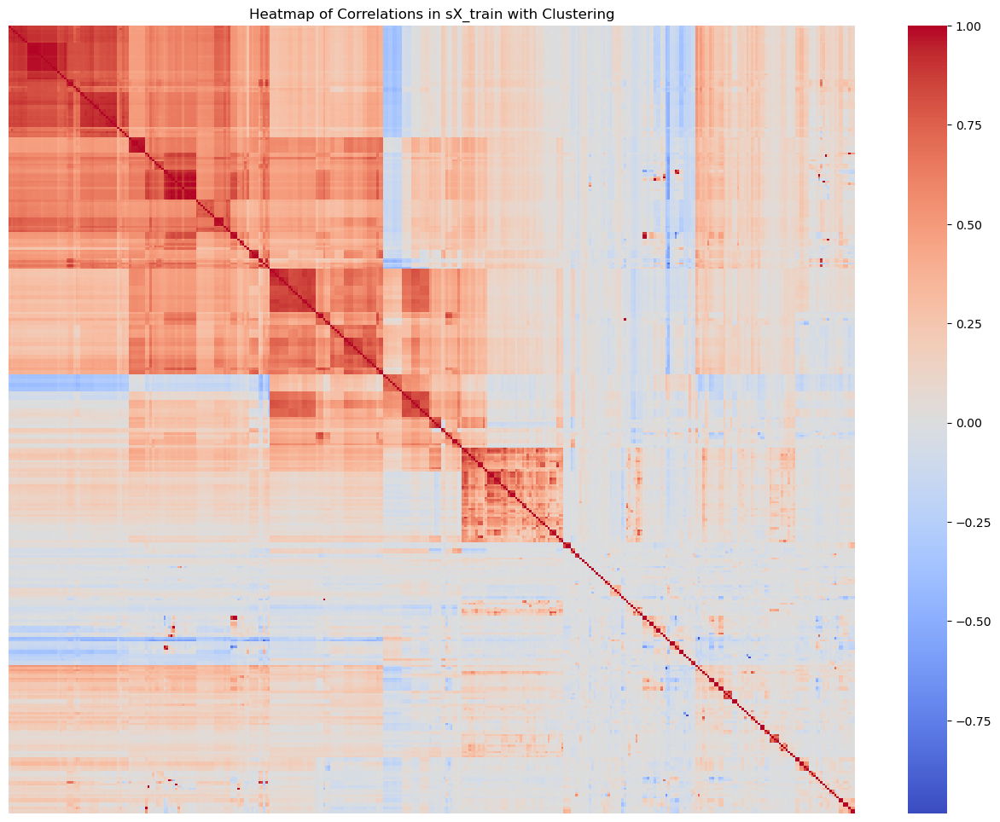

In [47]:
# Replace pd.NA with np.nan
pX_train = pX_train.replace({pd.NA: np.nan})
pX_test = pX_test.replace({pd.NA: np.nan})
correlation_matrix = pX_train.corr()
correlation_matrix = correlation_matrix.fillna(0)

linkage_matrix = sch.linkage(correlation_matrix, method='ward')
dendrogram = sch.dendrogram(linkage_matrix, no_plot=True)
ordered_columns = dendrogram['leaves']

ordered_corr_matrix = correlation_matrix.iloc[ordered_columns, ordered_columns]

plt.figure(figsize=(16, 12))
sns.heatmap(ordered_corr_matrix, annot=False, cmap='coolwarm', cbar=True)
plt.title('Heatmap of Correlations in sX_train with Clustering')
plt.xticks([])
plt.yticks([])
plt.show()

This is just to take a look at patterns.  We have some both positive and negative correlations!!  However the vast majority of features are not correllated.

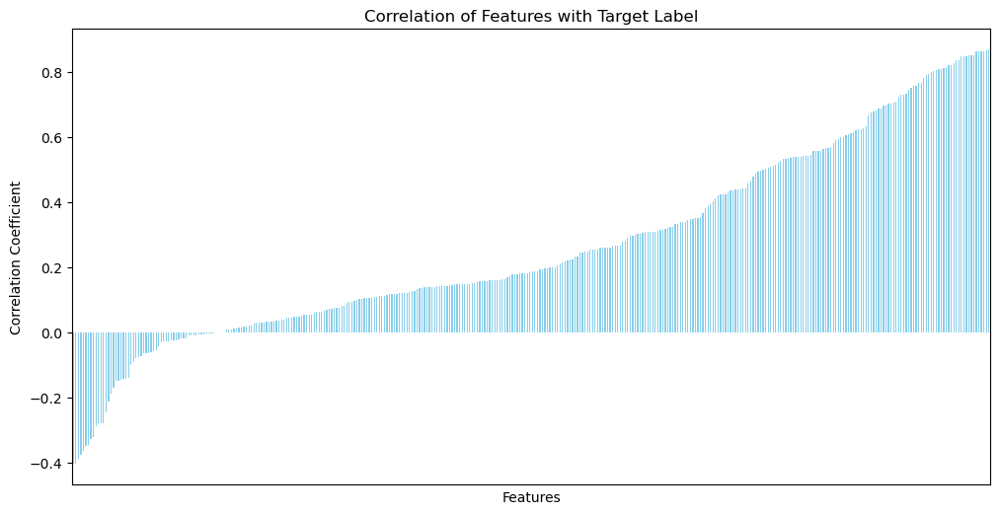

In [48]:
label_correlation = pd.DataFrame(pX_train, columns=pX_train.columns).corrwith(pd.Series(y_train))

# Plot the correlations of features with the target label
plt.figure(figsize=(12, 6))
label_correlation.sort_values().plot(kind='bar', color='skyblue')
plt.title('Correlation of Features with Target Label')
plt.ylabel('Correlation Coefficient')
plt.xlabel('Features')
plt.xticks([])  # Disable x-axis labels
plt.show()

In [49]:

def plot_correlations(X_train, y_train):
    df = pd.DataFrame(X_train, columns=X_train.columns)
    correlation_matrix = df.corr()
    label_correlation = df.corrwith(pd.Series(y_train))

    correlation_matrix = correlation_matrix.fillna(0)

    top_n = 60
    top_features = label_correlation.abs().sort_values(ascending=False).head(top_n).index

    top_corr_matrix = df[top_features].corr()
    
    # Filter out any columns that lead to NaN or infinite values in the correlation matrix
    valid_columns = top_corr_matrix.columns[~top_corr_matrix.isin([float('inf'), float('-inf')]).any()]
    top_corr_matrix = top_corr_matrix.loc[valid_columns, valid_columns]

    top_linkage_matrix = sch.linkage(top_corr_matrix, method='ward')

    # Generate the dendrogram for the top 60 features
    top_dendrogram = sch.dendrogram(top_linkage_matrix, no_plot=True)
    top_ordered_columns = top_dendrogram['leaves']

    # Reorder the top correlation matrix based on the clustering
    top_ordered_corr_matrix = top_corr_matrix.iloc[top_ordered_columns, top_ordered_columns]

    # Plot the heatmap for the top 60 feature correlations
    plt.figure(figsize=(20, 20))
    sns.heatmap(top_ordered_corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', annot_kws={"size": 6}, 
                xticklabels=top_ordered_corr_matrix.columns, yticklabels=top_ordered_corr_matrix.columns) 
    plt.title('Heatmap of Top 60 Feature Correlations in X_train with Clustering')
    plt.xticks(rotation=90, fontsize=8) 
    plt.yticks(fontsize=8)
    plt.show()

    sorted_label_correlation = label_correlation.sort_values(ascending=False).head(top_n)

    # Plot the correlations of the top 60 features with the target label
    plt.figure(figsize=(16, 8))  # Increase the figure size
    sorted_label_correlation.plot(kind='bar', color='skyblue')
    plt.title('Top 60 Feature Correlations with Target Label')
    plt.ylabel('Correlation Coefficient')
    plt.xlabel('Features')
    plt.xticks(rotation=90, fontsize=8) 
    plt.show()


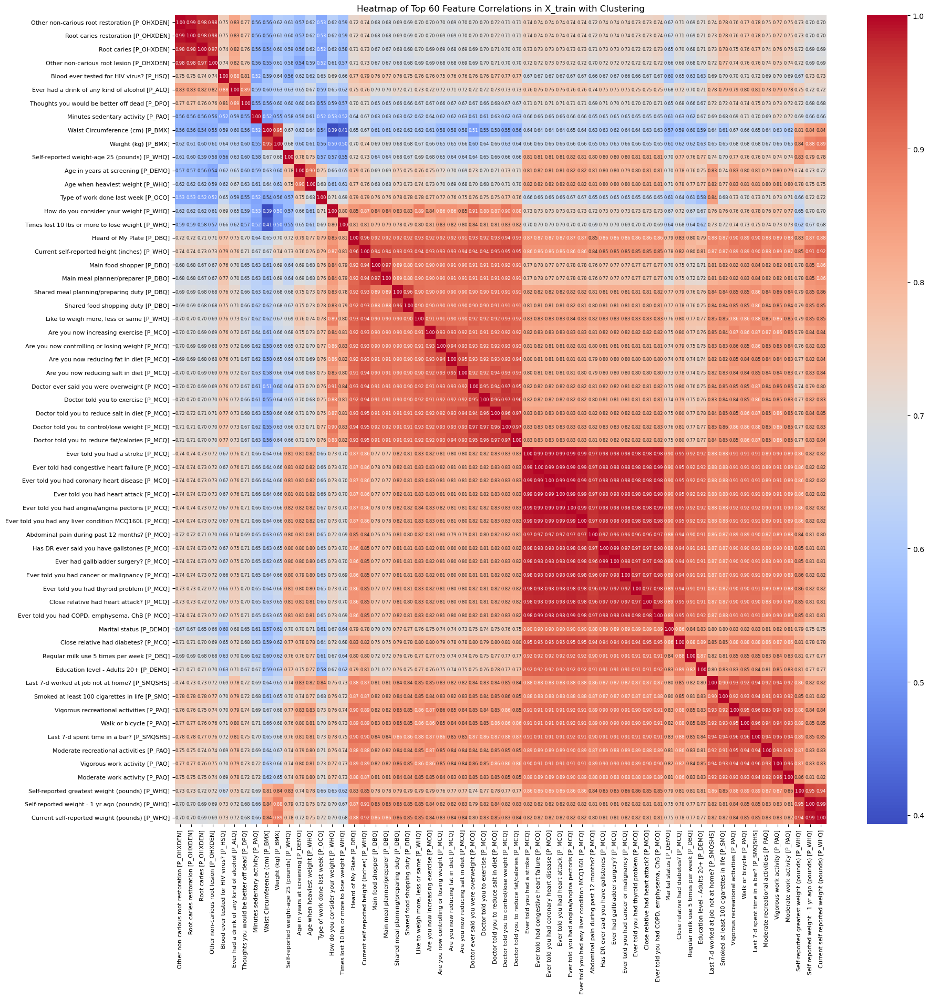

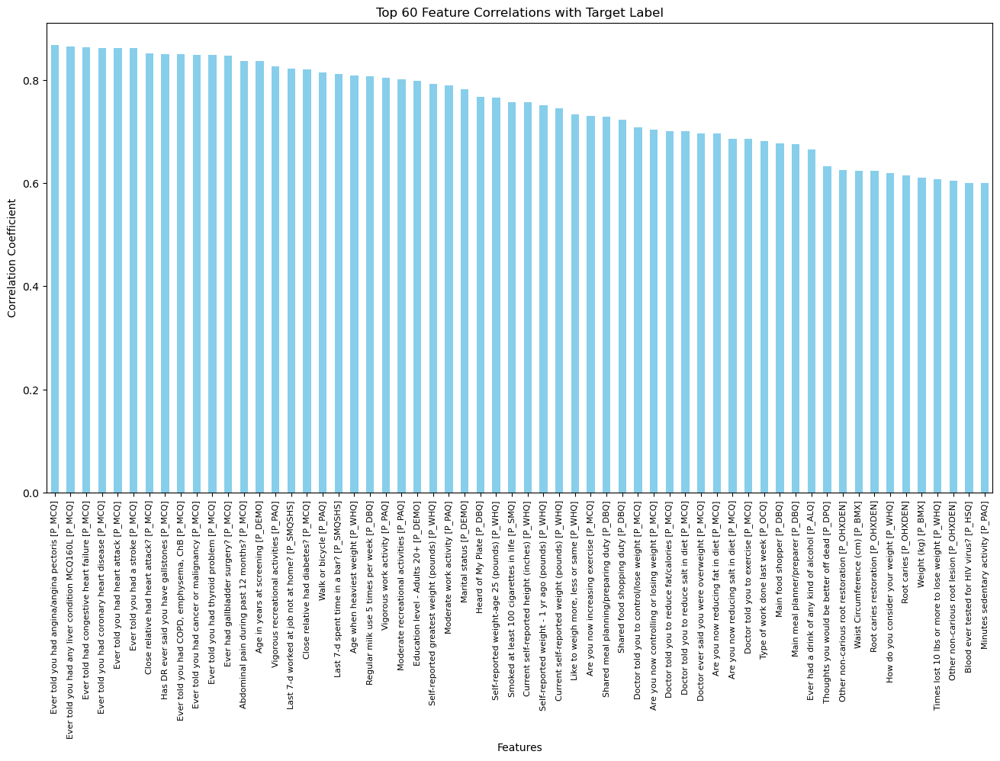

In [50]:
plot_correlations(pX_train, y_train)

Now lets see the results

## Age Correlations

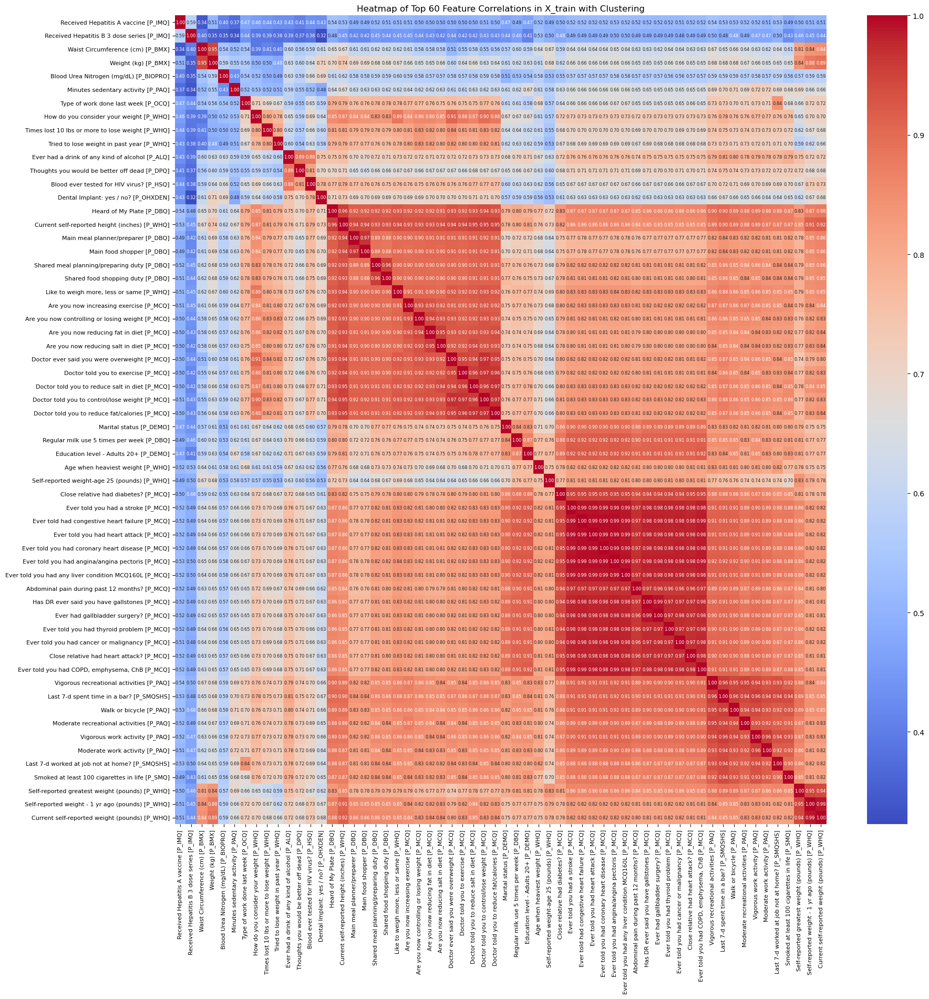

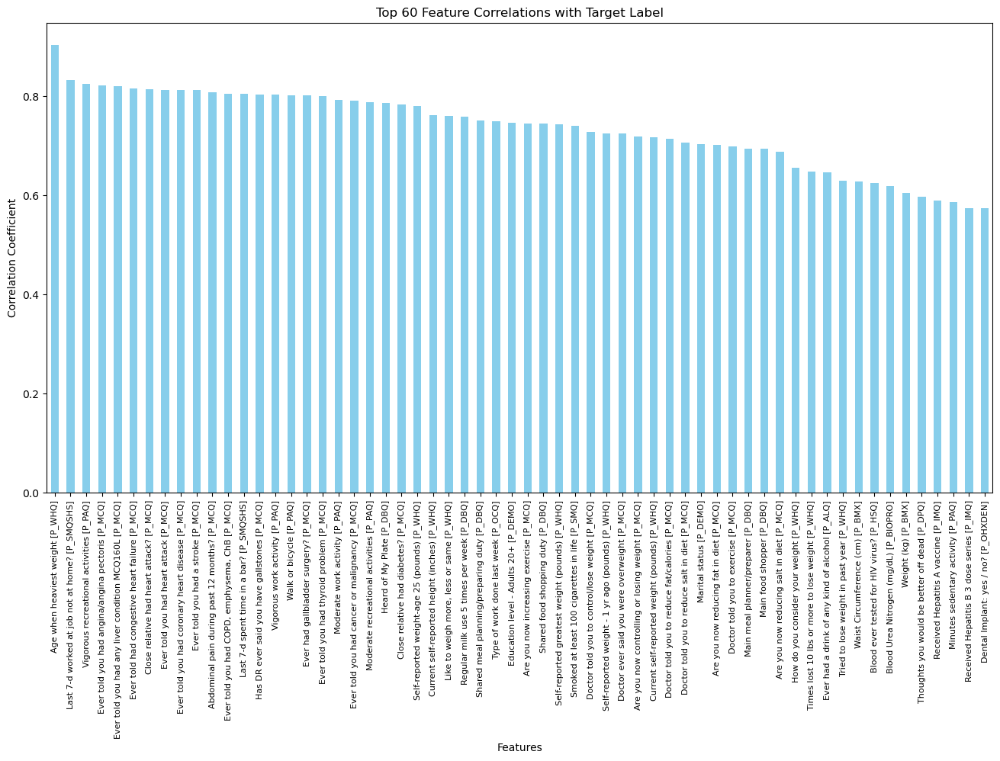

In [51]:
age_series = pX_train["Age in years at screening [P_DEMO]"]

sX_train_modified = pX_train.drop(columns=["Age in years at screening [P_DEMO]"])

plot_correlations(sX_train_modified, age_series)

So age prediction and arthritis prediction share things in common, but they are not the same strength or order.  The heatmaps look quite different too.  Age and age related things will correlate with arthritis, so we have a few options.

We can see how well it models with age related features in.

Then we can remove age related features for a future model.

## Age vs Arthritis Thresholds
Lets create a feature list of things that correlate with age and arthritis and make thresholds to decide what to possibly keep in the future.

In [52]:
# Define your threshold values
arthritis_threshold = 0.05
age_threshold = 0.77

# Assume arthritis_label is the first column in arthritis_columns
arthritis_label = y_train.name
age_label = "Age in years at screening [P_DEMO]"

# Calculate the correlation of all features with arthritis and age
cleaned_df = pX_train.copy()
cleaned_df[arthritis_label] = y_train
cleaned_df[age_label] = pX_train["Age in years at screening [P_DEMO]"]

correlation_matrix = cleaned_df.corr()
arthritis_correlation = correlation_matrix[arthritis_label]
age_correlation = correlation_matrix[age_label]

# Filter features
filtered_features = arthritis_correlation[(arthritis_correlation.abs() >= arthritis_threshold) & 
                                          (age_correlation.abs() < age_threshold)].index

# Exclude the arthritis label itself from the list if it exists
if arthritis_label in filtered_features:
    filtered_features = filtered_features.drop(arthritis_label)

# Convert to a list
arthritis_cols_filtered_age = filtered_features.tolist()

# Output the filtered feature list
display(len(arthritis_cols_filtered_age))
display(arthritis_cols_filtered_age)

284

['Gender [P_DEMO]',
 'Country of birth [P_DEMO]',
 'Education level - Adults 20+ [P_DEMO]',
 'Marital status [P_DEMO]',
 'Full sample interview weight [P_DEMO]',
 'Full sample MEC exam weight [P_DEMO]',
 'Ratio of family income to poverty [P_DEMO]',
 'Dietary day one sample weight [P_DR1IFF]',
 'Dietary day two sample weight [P_DR2IFF]',
 'Dietary recall status [P_DR1TOT]',
 'Number of foods/beverages reported [P_DR1TOT]',
 'Energy (kcal) [P_DR1TOT]',
 'Protein (gm) [P_DR1TOT]',
 'Dietary fiber (gm) [P_DR1TOT]',
 'Total fat (gm) [P_DR1TOT]',
 'Total saturated fatty acids (gm) [P_DR1TOT]',
 'Total monounsaturated fatty acids (gm) [P_DR1TOT]',
 'Total polyunsaturated fatty acids (gm) [P_DR1TOT]',
 'Cholesterol (mg) [P_DR1TOT]',
 'Vitamin E as alpha-tocopherol (mg) [P_DR1TOT]',
 'Vitamin A, RAE (mcg) [P_DR1TOT]',
 'Alpha-carotene (mcg) [P_DR1TOT]',
 'Beta-carotene (mcg) [P_DR1TOT]',
 'Beta-cryptoxanthin (mcg) [P_DR1TOT]',
 'Lutein + zeaxanthin (mcg) [P_DR1TOT]',
 'Thiamin (Vitamin B1) (mg

## Histograms To View Distributions
Lets take a look at some distributions


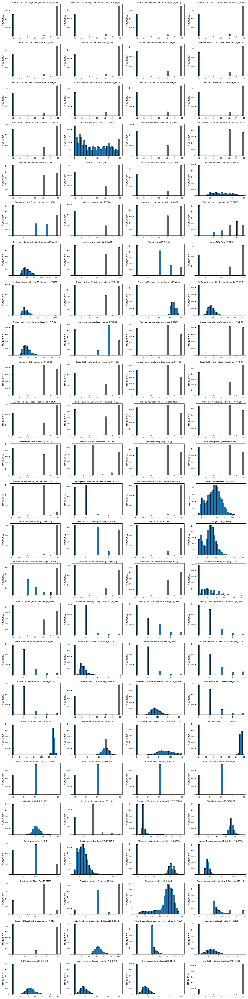

In [53]:
# Calculate the correlation of each feature with the target
label_correlation = pX_train.corrwith(y_train.squeeze())

# Select the top 100 most correlated features
top_100_features = label_correlation.abs().sort_values(ascending=False).head(100).index

# Plot a grid of histograms for the top 100 most correlated features
plt.figure(figsize=(15, 60))
for i, feature in enumerate(top_100_features, 1):
    plt.subplot(25, 4, i)
    plt.hist(pX_train[feature].dropna(), bins=30, edgecolor='black')
    plt.title(str(feature), fontsize=8)  # Ensure the title is a string
    plt.xlabel('')
    plt.ylabel('Frequency')
    plt.xticks(fontsize=6)
    plt.yticks(fontsize=6)

plt.tight_layout()
plt.show()

A lot of discrete data and a lot of mostly normal distributions with things, but often with a lot of missing or 0 included.

# Models

## Model Run Flags
Sometimes I need to restart the kernel or make changes earlier in the notebook.  Rerunning the models every time is tedious so this lets me flip switches and work on specific ones.

In [54]:
run_randomforest = False
run_xgboost = False
run_deeplearning = False
run_lightbgm = False
run_logistic=False


## Fix Indexing
I deleted a value earlier so fix indexing

In [55]:
# Align the indices of pX_train and y_train
common_indices = pX_train.index.intersection(y_train.index)
pX_train = pX_train.loc[common_indices]
y_train = y_train.loc[common_indices]

# Align the indices of pX_test and y_test
common_indices_test = pX_test.index.intersection(y_test.index)
pX_test = pX_test.loc[common_indices_test]
y_test = y_test.loc[common_indices_test]

In [56]:
# Filter out rows with -1 in target
valid_indices_train = y_train != -1
fX_train_no_missing = pX_train[valid_indices_train]
y_train_no_missing = y_train[valid_indices_train]

valid_indices_test = y_test != -1
fX_test_no_missing = pX_test[valid_indices_test]
y_test_no_missing = y_test[valid_indices_test]

## Setup Random Forest Vars
if remove_missing_labels is true it will use the data without the target -1 encoded as missing values

In [57]:
rX_train = pX_train
rX_test = pX_test
ry_train = y_train
ry_test = y_test

remove_missing_labels = False
if remove_missing_labels:
    rX_train = fX_train_no_missing
    rX_test = fX_test_no_missing
    ry_train = y_train_no_missing
    ry_test = y_test_no_missing

I tried using cX_train and cy_train and the test dfs that go with them and the model got a MUCH lower score.  So I won't be using them.

## Random Forest 
Lets do a random forest first!  Classification and decision trees work well together and it's also not compuationally heavy. 

Iteration on using class weights didn't help our scores so that is commented out.

In [58]:
model_path = "models/random_forest.pkl"

def save_model(model, path):
    with open(path, 'wb') as f:
        pickle.dump(model, f)

# Function to load the model
def load_model(path):
    with open(path, 'rb') as f:
        return pickle.load(f)

run_randomforest = False
if run_randomforest:
    # Define the full pipeline with the correct order of steps
    full_pipeline = ImbPipeline(steps=[
        ('imputer', SimpleImputer(strategy='mean')),  # Placeholder, will be varied in grid search
        ('smote', SMOTE()),  # Then apply SMOTE
        ('scaler', StandardScaler()),  # Standardize the data
        ('classifier', RandomForestClassifier()),  # Classifier
    ])

    # Set up GridSearchCV with different imputation strategies and the option to enable/disable RemoveNegatives
    param_grid = {
        'classifier__n_estimators': [100],
        'classifier__max_depth': [None],
        'classifier__min_samples_split': [2],
        'classifier__min_samples_leaf': [1],
        # class weights didn't help
        # 'classifier__class_weight': [None, 'balanced', 'balanced_subsample']
    }

    grid_search = GridSearchCV(full_pipeline, param_grid, cv=5)

    # Fit the GridSearchCV
    grid_search.fit(rX_train, ry_train)

    print("Best parameters found: ", grid_search.best_params_)
    print("Best cross-validation score: ", grid_search.best_score_)

    # Save the best model
    best_model = grid_search.best_estimator_
    save_model(best_model, model_path)
else:
    # Load the model from the pickle file
    best_model = load_model(model_path)

    classifier_params = best_model.named_steps['classifier'].get_params()
    print("Best parameters found: ", classifier_params)

Best parameters found:  {'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'sqrt', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'monotonic_cst': None, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}


In [59]:
# Predict on the test data
y_pred = best_model.predict(rX_test)

# Evaluate the model using classification_report
report = classification_report(ry_test, y_pred, output_dict=True)
accuracy = accuracy_score(ry_test, y_pred)

print(f"Accuracy: {accuracy}")
print("Classification Report:\n", pd.DataFrame(report).transpose())

# Get feature importances
feature_importances = best_model.named_steps['classifier'].feature_importances_
feature_importances_df = pd.DataFrame({
    'feature': rX_train.columns,
    'importance': feature_importances
}).sort_values(by='importance', ascending=False)
print("Feature Importances:\n", feature_importances_df)

Accuracy: 0.8643958868894601
Classification Report:
               precision    recall  f1-score      support
-1             1.000000  1.000000  1.000000  1248.000000
0              0.810676  0.879537  0.843704  1295.000000
1              0.660131  0.532513  0.589494   569.000000
accuracy       0.864396  0.864396  0.864396     0.864396
macro avg      0.823602  0.804017  0.811066  3112.000000
weighted avg   0.859075  0.864396  0.859903  3112.000000
Feature Importances:
                                             feature  importance
2                Age in years at screening [P_DEMO]    0.033960
322  Ever told you had COPD, emphysema, ChB [P_MCQ]    0.030083
298        Moderate recreational activities [P_PAQ]    0.028237
324   Abdominal pain during past 12 months? [P_MCQ]    0.026185
327  Ever told you had cancer or malignancy [P_MCQ]    0.026113
..                                              ...         ...
223              UIBC, Serum Comment Code [P_FETIB]    0.000045
261           

In [60]:
# Filter out features with zero importance
filtered_importances_df = feature_importances_df[feature_importances_df['importance'] > 0.001]

# Get the list of features with non-zero importance
filtered_features = filtered_importances_df['feature'].tolist()

display("Filtered feature importances:", filtered_features)
display("count: ", len(filtered_importances_df))
display("Feature Importances:", filtered_importances_df)

'Filtered feature importances:'

['Age in years at screening [P_DEMO]',
 'Ever told you had COPD, emphysema, ChB [P_MCQ]',
 'Moderate recreational activities [P_PAQ]',
 'Abdominal pain during past 12 months? [P_MCQ]',
 'Ever told you had cancer or malignancy [P_MCQ]',
 'Regular milk use 5 times per week [P_DBQ]',
 'Ever told you had a stroke [P_MCQ]',
 'Ever had gallbladder surgery? [P_MCQ]',
 'Ever told you had any liver condition MCQ160L [P_MCQ]',
 'Ever told you had thyroid problem [P_MCQ]',
 'Ever told you had heart attack [P_MCQ]',
 'Ever told you had angina/angina pectoris [P_MCQ]',
 'Vigorous recreational activities [P_PAQ]',
 'Doctor told you to control/lose weight [P_MCQ]',
 'Close relative had diabetes? [P_MCQ]',
 'Has DR ever said you have gallstones [P_MCQ]',
 'Type of work done last week [P_OCQ]',
 'Minutes sedentary activity [P_PAQ]',
 'Education level - Adults 20+ [P_DEMO]',
 'Doctor told you to reduce salt in diet [P_MCQ]',
 'Ever told you had coronary heart disease [P_MCQ]',
 'Doctor told you to exerc

'count: '

227

'Feature Importances:'

,feature,importance
2,Age in years at screening [P_DEMO],0.033960
322,"Ever told you had COPD, emphysema, ChB [P_MCQ]",0.030083
298,Moderate recreational activities [P_PAQ],0.028237
324,Abdominal pain during past 12 months? [P_MCQ],0.026185
327,Ever told you had cancer or malignancy [P_MCQ],0.026113
...,...,...
56,Zinc (mg) [P_DR1TOT],0.001013
50,Vitamin D (D2 + D3) (mcg) [P_DR1TOT],0.001011
256,Globulin (g/dL) [P_BIOPRO],0.001008
76,MFA 22:1 (Docosenoic) (gm) [P_DR1TOT],0.001006


### Trim Features

In [61]:
fX_train = pX_train[filtered_features]
fX_test = pX_test[filtered_features]

## XGBoost

In [62]:
xgboost_model_path = "models/xgboost_model.pkl"
if run_xgboost:
    # Filter out rows with -1 in target
    valid_indices_train = y_train != -1
    fX_train_no_missing = pX_train[valid_indices_train]
    y_train_no_missing = y_train[valid_indices_train]

    valid_indices_test = y_test != -1
    fX_test_no_missing = pX_test[valid_indices_test]
    y_test_no_missing = y_test[valid_indices_test]

    # Define the full pipeline with the correct order of steps
    full_pipeline = ImbPipeline(steps=[
        ('imputer', SimpleImputer(strategy='mean')),  # Placeholder, will be varied in grid search
        ('smote', SMOTE()),  # Then apply SMOTE
        ('scaler', StandardScaler()),  # Standardize the data
        ('classifier', xgb.XGBClassifier(tree_method='hist', device='cuda', use_label_encoder=False))  # GPU-accelerated XGBoost
    ])

    # Define the parameter grid for GridSearchCV
    param_grid = {
        'imputer__strategy': ['mean', 'median'],  # Varying the imputation strategy
        'smote__k_neighbors': [3, 5],  # Varying the number of neighbors in SMOTE
        'classifier__max_depth': [3, 5],  # Varying the max depth of the trees
        'classifier__learning_rate': [0.01, 0.1],  # Varying the learning rate
        'classifier__n_estimators': [100, 200]  # Varying the number of trees
    }

    # Initialize GridSearchCV with the pipeline and parameter grid
    grid_search_boost = GridSearchCV(full_pipeline, param_grid, cv=5, scoring='f1_weighted', n_jobs=2)  # Reduced to 2 jobs

    # Fit the GridSearchCV
    grid_search_boost.fit(fX_train_no_missing, y_train_no_missing)

    # Save the best model
    best_model = grid_search_boost.best_estimator_
    save_model(best_model, xgboost_model_path)
else:
    # Load the model from the pickle file
    best_model = load_model(xgboost_model_path)


In [63]:
# List of parameters that were optimized
optimized_params = ['max_depth', 'learning_rate', 'n_estimators']

# Extract and print the optimized parameters
best_params = {param: best_model.named_steps['classifier'].get_params()[param] for param in optimized_params}
print("Best parameters found: ", best_params)

Best parameters found:  {'max_depth': 3, 'learning_rate': 0.1, 'n_estimators': 100}


In [64]:
# Predict on the test set
y_pred = best_model.predict(fX_test_no_missing)

# Calculate accuracy
test_accuracy = accuracy_score(y_test_no_missing, y_pred)
print(f"Test Accuracy: {test_accuracy}")

# Calculate confusion matrix
conf_matrix = confusion_matrix(y_test_no_missing, y_pred)
print(f"Confusion Matrix:\n{conf_matrix}")

# Calculate classification report
class_report = classification_report(y_test_no_missing, y_pred)
print(f"Classification Report:\n{class_report}")

Test Accuracy: 0.7762875536480687
Confusion Matrix:
[[1132  163]
 [ 254  315]]
Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.87      0.84      1295
           1       0.66      0.55      0.60       569

    accuracy                           0.78      1864
   macro avg       0.74      0.71      0.72      1864
weighted avg       0.77      0.78      0.77      1864



/home/atrix/anaconda3/envs/rapids_24.06/lib/python3.11/site-packages/xgboost/core.py:160: UserWarning: [08:26:14] WARNING: /home/conda/feedstock_root/build_artifacts/xgboost-split_1717021965948/work/src/common/error_msg.cc:58: Falling back to prediction using DMatrix due to mismatched devices. This might lead to higher memory usage and slower performance. XGBoost is running on: cuda:0, while the input data is on: cpu.
Potential solutions:
- Use a data structure that matches the device ordinal in the booster.
- Set the device for booster before call to inplace_predict.

This warning will only be shown once.

  warnings.warn(smsg, UserWarning)


## Deep Learning
This takes 41mins to run and is a GPU memory hog.  It crashed multiple times.  And the accuracy score I got was .41.  I am keeping it here so it's documented but I will not be exploring this futher in this project and look to other models.

In [65]:
if run_deeplearning :
    # Set the mixed precision policy
    os.environ['TF_ENABLE_ONEDNN_OPTS'] = '0'
    policy = mixed_precision.Policy('mixed_float16')
    mixed_precision.set_global_policy(policy)

    # Define the Keras model function
    def create_model(optimizer='adam', dropout_rate=0.0, init_mode='uniform'):
        model = Sequential()
        model.add(Input(shape=(pX_train.shape[1],)))  # Use Input layer as the first layer
        model.add(Dense(32, kernel_initializer=init_mode, activation='relu'))
        model.add(Dropout(dropout_rate))
        model.add(Dense(16, kernel_initializer=init_mode, activation='relu'))
        model.add(Dropout(dropout_rate))
        model.add(Dense(8, kernel_initializer=init_mode, activation='relu'))
        model.add(Dense(1, kernel_initializer=init_mode, activation='sigmoid'))  # Assuming binary classification
        model.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])
        return model

    # Wrap the Keras model
    classifier = KerasClassifier(model=create_model, verbose=0)

    # Define the full pipeline with the correct order of steps
    full_pipeline = ImbPipeline(steps=[
        ('imputer', SimpleImputer(strategy='mean')),  # Placeholder, will be varied in grid search
        ('smote', SMOTE()),  # Apply SMOTE
        ('scaler', StandardScaler()),  # Standardize the data
        ('classifier', classifier)  # Keras classifier
    ])

    # Define the parameter grid for GridSearchCV
    param_grid = {
        'imputer__strategy': ['mean', 'median'],  # Varying the imputation strategy
        'smote__k_neighbors': [3, 5],  # Varying the number of neighbors in SMOTE
        'classifier__model__optimizer': ['adam', 'sgd'],  # Varying the optimizer
        'classifier__model__dropout_rate': [0.0, 0.2],  # Varying the dropout rate
        'classifier__model__init_mode': ['uniform', 'normal'],  # Varying the weight initialization mode
        'classifier__batch_size': [8, 16],  # Varying the batch size
        'classifier__epochs': [5, 10]  # Varying the number of epochs
    }

    # Initialize GridSearchCV with the pipeline and parameter grid
    grid_search_nn = GridSearchCV(full_pipeline, param_grid, cv=3, scoring='accuracy', n_jobs=1)

    # Fit the GridSearchCV
    try:
        grid_search_nn.fit(pX_train, y_train)
        # Display the best parameters and the best score
        print(f"Best parameters: {grid_search_nn.best_params_}")
        print(f"Best score (Accuracy): {grid_search_nn.best_score_}")
    except Exception as e:
        print(f"An error occurred: {e}")

### Saved output
<pre>
2024-07-30 15:22:22.537369: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-07-30 15:22:22.539831: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-07-30 15:22:22.541399: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-07-30 15:22:22.543966: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-07-30 15:22:22.545764: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-07-30 15:22:22.547507: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-07-30 15:22:22.549817: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-07-30 15:22:22.551568: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-07-30 15:22:22.553226: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-07-30 15:22:22.555002: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1928] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 828 MB memory:  -> device: 0, name: NVIDIA RTX A2000 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.6
WARNING: All log messages before absl::InitializeLog() is called are written to STDERR
I0000 00:00:1722374543.373306 1394668 service.cc:145] XLA service 0x7d3c280049a0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1722374543.373358 1394668 service.cc:153]   StreamExecutor device (0): NVIDIA RTX A2000 Laptop GPU, Compute Capability 8.6
2024-07-30 15:22:23.389265: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-07-30 15:22:23.522392: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
I0000 00:00:1722374544.418451 1394668 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
2024-07-30 15:22:27.897013: E tensorflow/core/util/util.cc:131] oneDNN supports DT_HALF only on platforms with AVX-512. Falling back to the default Eigen-based implementation if present.
/home/atrix/anaconda3/envs/rapids_24.06/lib/python3.11/site-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,
Best parameters: {'classifier__batch_size': 8, 'classifier__epochs': 5, 'classifier__model__dropout_rate': 0.0, 'classifier__model__init_mode': 'uniform', 'classifier__model__optimizer': 'adam', 'imputer__strategy': 'mean', 'smote__k_neighbors': 3}
Best score (Accuracy): 0.4081304732063951
</pre>

## LightBGM
the conda version of this doesn't support gpu so cpu it is :(

In [66]:
lightgbm_model_path = "models/lightgbm_model.pkl"
if run_lightbgm:
    # Filter out rows with -1 in target
    valid_indices_train = y_train != -1
    fX_train_no_missing = pX_train[valid_indices_train]
    y_train_no_missing = y_train[valid_indices_train]

    valid_indices_test = y_test != -1
    fX_test_no_missing = pX_test[valid_indices_test]
    y_test_no_missing = y_test[valid_indices_test]

    # Define the full pipeline with the correct order of steps
    full_pipeline_lgb = ImbPipeline(steps=[
        ('imputer', SimpleImputer(strategy='mean')),
        ('smote', SMOTE()),
        ('scaler', StandardScaler()),
        ('classifier', lgb.LGBMClassifier(boosting_type='gbdt'))
    ])

    # To save time for future runs
    param_grid_lgb = {
        'imputer__strategy': ['mean'],
        'smote__k_neighbors': [3],
        'classifier__max_depth': [3],
        'classifier__learning_rate': [0.01],
        'classifier__n_estimators': [200],
        'classifier__scale_pos_weight': [10]
    }

    # Initialize RandomizedSearchCV with the pipeline and parameter grid
    random_search_lgb = RandomizedSearchCV(full_pipeline_lgb, param_grid_lgb, cv=3, scoring='f1', n_iter=20, n_jobs=-1, random_state=42)

    # Fit the RandomizedSearchCV
    random_search_lgb.fit(fX_train_no_missing, y_train_no_missing)

    # Save the best model
    best_model = random_search_lgb.best_estimator_
    save_model(best_model, lightgbm_model_path)
else:
    # Load the model from the pickle file
    best_model = load_model(lightgbm_model_path)

In [67]:
# List of parameters that were optimized
optimized_params = ['max_depth', 'learning_rate', 'n_estimators', 'scale_pos_weight']

# Extract and print the optimized parameters
best_params = {param: best_model.named_steps['classifier'].get_params()[param] for param in optimized_params}
print("Best parameters found: ", best_params)


Best parameters found:  {'max_depth': 3, 'learning_rate': 0.01, 'n_estimators': 200, 'scale_pos_weight': 10}


In [68]:
# Predict on the test set
y_pred_lgb = best_model.predict(fX_test_no_missing)

# Calculate confusion matrix
lgb_confusion_matrix = confusion_matrix(y_test_no_missing, y_pred_lgb)
print(f"Confusion Matrix:\n{lgb_confusion_matrix}")

# Calculate classification report
lgb_classification_report = classification_report(y_test_no_missing, y_pred_lgb)
print(f"Classification Report:\n{lgb_classification_report}")

Confusion Matrix:
[[377 918]
 [ 16 553]]
Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.29      0.45      1295
           1       0.38      0.97      0.54       569

    accuracy                           0.50      1864
   macro avg       0.67      0.63      0.49      1864
weighted avg       0.78      0.50      0.48      1864



### Saved output
<pre>
Best parameters: {'smote__k_neighbors': 3, 'imputer__strategy': 'median', 'classifier__scale_pos_weight': 10, 'classifier__n_estimators': 200, 'classifier__max_depth': 3, 'classifier__learning_rate': 0.01}
Best score (Recall): 0.9759268804272349
LightGBM Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.29      0.45      1295
           1       0.38      0.97      0.54       569

    accuracy                           0.50      1864
   macro avg       0.67      0.63      0.50      1864
weighted avg       0.78      0.50      0.48      1864

Confusion Matrix:
 [[378 917]
 [ 15 554]]
</pre>

## Logistic Regression
Using logistic 

### Additional missing handling

In [69]:
valid_indices_train = y_train != -1
fX_train_no_missing = pX_train[valid_indices_train]
y_train_no_missing = y_train[valid_indices_train]

valid_indices_test = y_test != -1
fX_test_no_missing = pX_test[valid_indices_test]
y_test_no_missing = y_test[valid_indices_test]


### Skew

In [70]:
def handle_skewness(X, skewness_threshold=0.75, small_constant=1e-6):
    def safe_skew(series):
        if series.nunique() > 1:
            return skew(series.dropna())
        return 0

    # Filter for float columns only
    float_columns = X.select_dtypes(include=[np.float64, np.float32]).columns
    skewed_features = X[float_columns].apply(safe_skew)
    features_to_transform = skewed_features[abs(skewed_features) > skewness_threshold].index

    for feature in features_to_transform:
        if any(X[feature] <= 0):
            X[feature] = np.log1p(X[feature] - X[feature].min() + small_constant)
        else:
            X[feature] = np.log1p(X[feature] + small_constant)
    
    return X, features_to_transform

# Example usage:
lX_train, transformed_features = handle_skewness(fX_train_no_missing)
lX_test, _ = handle_skewness(fX_test_no_missing)
ly_test = y_test_no_missing
ly_train = y_train_no_missing

/tmp/ipykernel_1979484/2377875978.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X[feature] = np.log1p(X[feature] + small_constant)
/tmp/ipykernel_1979484/2377875978.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X[feature] = np.log1p(X[feature] - X[feature].min() + small_constant)


### Multi Collinearity
This results in removing too many features I want to predict on, I'll handle it another way

VIF was tried too and it took a VERY long time to run and frequently crashed

In [71]:
if False:
    def handle_multicollinearity(X, threshold=0.9):
        # Calculate the correlation matrix
        corr_matrix = X.corr().abs()
        
        # Identify the upper triangle of the correlation matrix
        upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
        
        # Find features with correlation greater than the threshold
        to_drop = []
        kept_columns = {}
        for column in upper.columns:
            if any(upper[column] > threshold):
                # Identify the pair(s) of features with high collinearity
                high_corr_features = upper.index[upper[column] > threshold].tolist()
                for feature in high_corr_features:
                    to_drop.append(column)
                    kept_columns[feature] = column
                    collinearity_degree = upper.loc[feature, column]
                    print(f"Dropping '{column}' due to high correlation (degree: {collinearity_degree}) with '{feature}'")

        # Drop the identified features
        X = X.drop(columns=to_drop)
        
        return X, to_drop, kept_columns

    # Handle multicollinearity in the data
    fX_train_no_missing_processed_no_multicollinearity, dropped_features, kept_columns = handle_multicollinearity(fX_train_no_missing_processed)

    # Print the dropped features and their corresponding kept columns
    print("\nDropped features due to multicollinearity and the columns kept instead:")
    for dropped, kept in kept_columns.items():
        print(f"Dropped: {dropped}, Kept: {kept}")

#### Saved Output Example (truncated due to length)
<pre>
Dropping 'Full sample MEC exam weight [P_DEMO]' due to high correlation (degree: 0.9979420841097335) with 'Interview/Examination status [P_DEMO]'
Dropping 'Salt used at table yesterday? [P_DR1TOT]' due to high correlation (degree: 0.9570616583082444) with 'Salt used in preparation? [P_DR1TOT]'
Dropping 'On special diet? [P_DR1TOT]' due to high correlation (degree: 0.9616139620860861) with 'Salt used in preparation? [P_DR1TOT]'
Dropping 'On special diet? [P_DR1TOT]' due to high correlation (degree: 0.9757146767550101) with 'Salt used at table yesterday? [P_DR1TOT]'
Dropping 'Cholesterol (mg) [P_DR1TOT]' due to high correlation (degree: 0.9298006916171146) with 'Salt used in preparation? [P_DR1TOT]'
Dropping 'Cholesterol (mg) [P_DR1TOT]' due to high correlation (degree: 0.9420323531305373) with 'Salt used at table yesterday? [P_DR1TOT]'
Dropping 'Cholesterol (mg) [P_DR1TOT]' due to high correlation (degree: 0.9445974387332831) with 'On special diet? [P_DR1TOT]'
Dropping 'Retinol (mcg) [P_DR1TOT]' due to high correlation (degree: 0.9174565731304295) with 'Salt used in preparation? [P_DR1TOT]'
Dropping 'Retinol (mcg) [P_DR1TOT]' due to high correlation (degree: 0.9296818606823704) with 'Salt used at table yesterday? [P_DR1TOT]'
Dropping 'Retinol (mcg) [P_DR1TOT]' due to high correlation (degree: 0.9313315564135148) with 'On special diet? [P_DR1TOT]'
Dropping 'Retinol (mcg) [P_DR1TOT]' due to high correlation (degree: 0.976460977342857) with 'Cholesterol (mg) [P_DR1TOT]'
Dropping 'Vitamin A, RAE (mcg) [P_DR1TOT]' due to high correlation (degree: 0.9348889108467747) with 'Salt used in preparation? [P_DR1TOT]'
Dropping 'Vitamin A, RAE (mcg) [P_DR1TOT]' due to high correlation (degree: 0.9477243684489782) with 'Salt used at table yesterday? [P_DR1TOT]'
Dropping 'Vitamin A, RAE (mcg) [P_DR1TOT]' due to high correlation (degree: 0.9486553459515564) with 'On special diet? [P_DR1TOT]'
Dropping 'Vitamin A, RAE (mcg) [P_DR1TOT]' due to high correlation (degree: 0.9823628856794907) with 'Cholesterol (mg) [P_DR1TOT]'
Dropping 'Vitamin A, RAE (mcg) [P_DR1TOT]' due to high correlation (degree: 0.9863381630773636) with 'Retinol (mcg) [P_DR1TOT]'
Dropping 'Lutein + zeaxanthin (mcg) [P_DR1TOT]' due to high correlation (degree: 0.9319817769632089) with 'Salt used in preparation? [P_DR1TOT]'

</pre>

### Logistic

In [72]:
def check_for_nans_and_infs(X):
    if np.any(np.isnan(X)) or np.any(np.isinf(X)):
        raise ValueError("Data contains NaNs or infinite values. Please check your data preprocessing steps.")

if run_logistic:
    # Define the full pipeline with the correct order of steps
    full_pipeline_logistic = ImbPipeline(steps=[
        ('imputer', SimpleImputer(strategy='mean')),
        ('smote', SMOTE()),
        ('scaler', StandardScaler()),
        ('classifier', LogisticRegression(solver='liblinear'))
    ])

    # Older param grid for reference
    param_grid_logistic = {
        'imputer__strategy': ['mean', 'median'],
        'imputer__add_indicator': [True, False],
        'smote__k_neighbors': [3, 5, 7],
        'smote__sampling_strategy': ['auto', 0.5, 0.75],
        'smote__random_state': [0, 42],
        'classifier__C': [0.01, 0.1, 1, 10, 100],
        'classifier__penalty': ['elasticnet'],
        'classifier__penalty': ['l1', 'l2', 'elasticnet'],
        'classifier__solver': ['liblinear','saga'],
        'classifier__l1_ratio': [0.1, 0.5, 0.9],
        'classifier__max_iter': [100, 200, 300],
        'classifier__class_weight': [None, 'balanced']
    }
    #extensive param grid
    param_grid_logistic = [
        # Configuration with SMOTE enabled
        {
            'imputer__strategy': ['mean', 'median', 'most_frequent', 'constant'],
            'imputer__add_indicator': [True],
            'smote': [SMOTE()],
            'smote__k_neighbors': [5],
            'smote__sampling_strategy': ['auto'],
            'smote__random_state': [42],
            'classifier__C': [0.1, 1, 10],
            'classifier__penalty': ['l1', 'l2'],
            'classifier__solver': ['liblinear'],
            'classifier__max_iter': [200],
            'classifier__class_weight': [None, 'balanced']
        },
        {
            'imputer__strategy': ['mean', 'median', 'most_frequent', 'constant'],
            'imputer__add_indicator': [True],
            'smote': [SMOTE()],
            'smote__k_neighbors': [5],
            'smote__sampling_strategy': ['auto'],
            'smote__random_state': [42],
            'classifier__C': [0.1, 1, 10],
            'classifier__penalty': ['elasticnet'],
            'classifier__solver': ['saga'],
            'classifier__l1_ratio': [0.1, 0.5],
            'classifier__max_iter': [200],
            'classifier__class_weight': [None, 'balanced']
        },
        # Configuration with SMOTE disabled
        {
            'imputer__strategy': ['mean', 'median', 'most_frequent', 'constant'],
            'imputer__add_indicator': [True],
            'smote': [None],  # SMOTE disabled
            'classifier__C': [0.1, 1, 10],
            'classifier__penalty': ['l1', 'l2'],
            'classifier__solver': ['liblinear'],
            'classifier__max_iter': [200],
            'classifier__class_weight': [None, 'balanced']
        },
        {
            'imputer__strategy': ['mean', 'median', 'most_frequent', 'constant'],
            'imputer__add_indicator': [True],
            'smote': [None],  # SMOTE disabled
            'classifier__C': [0.1, 1, 10],
            'classifier__penalty': ['elasticnet'],
            'classifier__solver': ['saga'],
            'classifier__l1_ratio': [0.1, 0.5],
            'classifier__max_iter': [200],
            'classifier__class_weight': [None, 'balanced']
        }
    ]
    #best param grid so we can rerun this fast for testing
    param_grid_logistic = {
        'classifier__C': [0.1],
        'classifier__class_weight': ['balanced'],
        'classifier__max_iter': [200],
        'classifier__penalty': ['l1'],
        'classifier__solver': ['liblinear'],
        'imputer__add_indicator': [True],
        'imputer__strategy': ['most_frequent'],
        'smote': [None]
    }
    # This grid was used after the prior one to do another extensive search that took 104 minutes
    param_grid_logistic = {
        'classifier__C': [0.01, 0.1, 1, 10, 100],  # range of values for C
        'classifier__class_weight': ['balanced', None],  # trying with and without class weight balancing
        'classifier__max_iter': [100, 200, 500],  # different maximum iterations
        'classifier__penalty': ['l1', 'l2'],  # different penalty terms
        'classifier__solver': ['liblinear', 'saga'],  # trying different solvers
        'imputer__add_indicator': [True, False],  # with and without missing indicator
        'imputer__strategy': ['most_frequent', 'mean', 'median'],  # different imputation strategies
        'smote': [None, 'auto']  # with and without SMOTE (you might need to adjust based on how you handle SMOTE in your pipeline)
    }
    # This is the results of the best params from all iterations.  
    # it only managed to get the F1 Score up to just a bit over .65 though but that's better than it was doing.
    param_grid_logistic = {
        'classifier__C': [0.1],
        'classifier__class_weight': ['balanced'],
        'classifier__max_iter': [1000],
        'classifier__penalty': ['l1'],
        'classifier__solver': ['saga'],
        'imputer__add_indicator': [True],
        'imputer__strategy': ['most_frequent'],
        'smote': [None]
    }

    # Initialize GridSearchCV with the pipeline and parameter grid
    grid_search_logistic = GridSearchCV(full_pipeline_logistic, param_grid_logistic, cv=3, scoring='f1', n_jobs=-1)

    # Fit the GridSearchCV
    grid_search_logistic.fit(lX_train, ly_train)

    # Display the best parameters and the best score
    print(f"Best parameters: {grid_search_logistic.best_params_}")
    print(f"Best score (F1): {grid_search_logistic.best_score_}")

    # Predict on the test set with the best logistic regression model
    y_pred_logistic = grid_search_logistic.best_estimator_.predict(lX_test)

    # Generate the classification report and confusion matrix
    logistic_classification_report = classification_report(ly_test, y_pred_logistic)
    logistic_confusion_matrix = confusion_matrix(y_test_no_missing, y_pred_logistic)

    print("Logistic Regression Classification Report:\n", logistic_classification_report)
    print("Confusion Matrix:\n", logistic_confusion_matrix)

    # Save the best model
    best_model = grid_search_logistic.best_estimator_
    save_model(best_model, 'models/logistic_model.pkl')
else:
    # Load the model from the pickle file
    best_model = load_model('models/logistic_model.pkl')
    
    # Predict on the test set with the loaded model
    y_pred_logistic = best_model.predict(lX_test)

    # Generate the classification report and confusion matrix
    logistic_classification_report = classification_report(ly_test, y_pred_logistic)
    logistic_confusion_matrix = confusion_matrix(ly_test, y_pred_logistic)

    print("Logistic Regression Classification Report:\n", logistic_classification_report)
    print("Confusion Matrix:\n", logistic_confusion_matrix)

Logistic Regression Classification Report:
               precision    recall  f1-score   support

           0       0.85      0.74      0.79      1295
           1       0.55      0.71      0.62       569

    accuracy                           0.73      1864
   macro avg       0.70      0.73      0.71      1864
weighted avg       0.76      0.73      0.74      1864

Confusion Matrix:
 [[959 336]
 [163 406]]


## Statsmodels Logistic Statistical Modeling

In [73]:
# Check for NaNs and Infs in the data
def check_for_nans_and_infs(X):
    if np.any(np.isnan(X)) or np.any(np.isinf(X)):
        raise ValueError("Data contains NaNs or infinite values. Please check your data preprocessing steps.")

# Remove or impute NaNs and infinite values
def clean_data(X):
    X[np.isinf(X)] = np.nan
    X = np.where(np.isnan(X), np.nanmean(X, axis=0), X)
    return X

# Remove constant features
def remove_constant_features(X):
    non_constant_mask = np.std(X, axis=0) != 0
    return X[:, non_constant_mask], non_constant_mask

# Remove highly correlated features
def remove_highly_correlated_features(X, threshold=0.95):
    corr_matrix = np.corrcoef(X, rowvar=False)
    upper_tri = np.triu(np.ones(corr_matrix.shape), k=1).astype(bool)
    to_remove = [i for i in range(corr_matrix.shape[1]) if any(np.abs(corr_matrix[i, j]) > threshold for j in range(i))]
    return np.delete(X, to_remove, axis=1), np.delete(np.arange(corr_matrix.shape[1]), to_remove), to_remove

# Clean and prepare the data
X2 = np.append(np.ones((lX_train.shape[0], 1)), lX_train, axis=1)
X2 = clean_data(X2)
check_for_nans_and_infs(X2)

# Get feature names including the intercept
feature_names = np.array(['Intercept'] + list(lX_train.columns))

# Remove constant features
X2, non_constant_mask = remove_constant_features(X2)
feature_names = feature_names[non_constant_mask]

# Remove highly correlated features
X2, remaining_indices, to_remove = remove_highly_correlated_features(X2)
feature_names = feature_names[remaining_indices]

# Standardize the features
scaler = StandardScaler()
X2[:, 1:] = scaler.fit_transform(X2[:, 1:])

# Extract coefficients and intercept from the best logistic regression model
logreg = best_model.named_steps['classifier']
coef_ = logreg.coef_[0]
intercept_ = logreg.intercept_

# Use statsmodels for detailed statistical analysis
X2_sm = sm.add_constant(X2[:, 1:])  # Add intercept term for statsmodels
model = sm.Logit(ly_train, X2_sm)
result = model.fit(disp=False)

# Extract p-values
p_values = result.pvalues

# Identify significant features
significant_features = feature_names[p_values < 0.05]

# List of features that predict the 1 class (risk factors for arthritis)
risk_factors = significant_features[1:]  # Exclude the intercept

print("Risk factors for arthritis (p < 0.05):", risk_factors.tolist())

Risk factors for arthritis (p < 0.05): ['Gender [P_DEMO]', 'Age in years at screening [P_DEMO]', 'Country of birth [P_DEMO]', 'Education level - Adults 20+ [P_DEMO]', 'Protein (gm) [P_DR1TOT]', 'Copper (mg) [P_DR1TOT]', 'Moisture (gm) [P_DR1TOT]', 'Total # of Dietary Supplements Taken [P_DSQTOT]', 'Total # of Antacids Taken [P_DSQTOT]', 'Tooth Count: #10 [P_OHXDEN]', 'Tooth Count: #12 [P_OHXDEN]', 'Tooth Count: #28 [P_OHXDEN]', 'Coronal Caries: Tooth Count #24 [P_OHXDEN]', 'White blood cell count (1000 cells/uL) [P_CBC]', 'Monocyte number (1000 cells/uL) [P_CBC]', 'Mean cell hemoglobin concentration (g/dL) [P_CBC]', 'Red cell distribution width (%) [P_CBC]', 'Iron frozen, Serum (umol/L) [P_FETIB]', 'Blood lead comment code [P_PBCD]', 'Creatinine, refrigerated serum (mg/dL) [P_BIOPRO]', 'Potassium (mmol/L) [P_BIOPRO]', 'Blood ever tested for HIV virus? [P_HSQ]', 'Moderate recreational activities [P_PAQ]', 'Trouble sleeping or sleeping too much [P_DPQ]', 'Poor appetite or overeating [P_D

In [74]:
all_feature_names = np.array(['Intercept'] + list(lX_train.columns))
# Adjust to_remove indices to match the original feature names after removing constant features
remaining_after_constant = np.where(non_constant_mask)[0]
adjusted_to_remove = remaining_after_constant[to_remove]

# Identify the removed highly correlated features
highly_correlated_features_removed = all_feature_names[adjusted_to_remove + 1]  # +1 to account for the intercept

# Print the removed highly correlated features
print("Features removed due to high collinearity:", highly_correlated_features_removed.tolist())


Features removed due to high collinearity: ['Masked variance pseudo-PSU [P_DEMO]', 'Number of foods/beverages reported [P_DR1TOT]', 'Total polyunsaturated fatty acids (gm) [P_DR1TOT]', 'Total choline (mg) [P_DR1TOT]', 'Potassium (mg) [P_DR1TOT]', 'SFA 8:0 (Octanoic) (gm) [P_DR1TOT]', 'SFA 12:0 (Dodecanoic) (gm) [P_DR1TOT]', 'SFA 18:0 (Octadecanoic) (gm) [P_DR1TOT]', 'MFA 16:1 (Hexadecenoic) (gm) [P_DR1TOT]', 'MFA 20:1 (Eicosenoic) (gm) [P_DR1TOT]', 'PFA 18:3 (Octadecatrienoic) (gm) [P_DR1TOT]', 'Total plain water drank yesterday (gm) [P_DR1TOT]', 'Coded cuff size - oscillometric [P_BPXO]', 'Systolic - 2nd oscillometric reading [P_BPXO]', 'Diastolic - 2nd oscillometric reading [P_BPXO]', 'Systolic - 3rd oscillometric reading [P_BPXO]', 'Diastolic - 3rd oscillometric reading [P_BPXO]', 'Body Measures Component Status Code [P_BMX]', 'Dental Implant: yes / no? [P_OHXDEN]', 'Tooth Count: #10 [P_OHXDEN]', 'Tooth Count: #25 [P_OHXDEN]', 'Tooth Count: #26 [P_OHXDEN]', 'Tooth Count: #27 [P_OHXD

In [75]:
nX_train = lX_train[highly_correlated_features_removed]
nX_test = lX_test[highly_correlated_features_removed]

# Clean and prepare the data
X3 = np.append(np.ones((nX_train.shape[0], 1)), nX_train, axis=1)
X3 = clean_data(X3)
check_for_nans_and_infs(X3)

# Get feature names including the intercept
feature_names2 = np.array(['Intercept'] + list(nX_train.columns))

# Remove constant features
X3, non_constant_mask = remove_constant_features(X3)
feature_names2 = feature_names2[non_constant_mask]

# Remove highly correlated features
X3, remaining_indices, to_remove = remove_highly_correlated_features(X3)
feature_names2 = feature_names2[remaining_indices]

# Standardize the features
scaler = StandardScaler()
X3[:, 1:] = scaler.fit_transform(X3[:, 1:])

# Extract coefficients and intercept from the best logistic regression model
logreg = best_model.named_steps['classifier']
coef_ = logreg.coef_[0]
intercept_ = logreg.intercept_

# Use statsmodels for detailed statistical analysis
X3_sm = sm.add_constant(X3[:, 1:])  # Add intercept term for statsmodels
model = sm.Logit(ly_train, X3_sm)
result = model.fit(disp=False)

# Extract p-values
p_values = result.pvalues

# Identify significant features
significant_features = feature_names2[p_values < 0.05]

# List of features that predict the 1 class (risk factors for arthritis)
risk_factors2 = significant_features[1:]  # Exclude the intercept

print("Risk factors for arthritis (p < 0.05):", risk_factors2.tolist())

Risk factors for arthritis (p < 0.05): ['Number of foods/beverages reported [P_DR1TOT]', 'Total polyunsaturated fatty acids (gm) [P_DR1TOT]', 'Potassium (mg) [P_DR1TOT]', 'SFA 12:0 (Dodecanoic) (gm) [P_DR1TOT]', 'MFA 16:1 (Hexadecenoic) (gm) [P_DR1TOT]', 'Coded cuff size - oscillometric [P_BPXO]', 'Dental Implant: yes / no? [P_OHXDEN]', 'Tooth Count: #10 [P_OHXDEN]', 'Tooth Count: #28 [P_OHXDEN]', 'Mean cell volume (fL) [P_CBC]', 'Red cell distribution width (%) [P_CBC]', 'HS C-Reactive Protein (mg/L) [P_HSCRP]', 'Blood cadmium comment code [P_PBCD]', 'Blood manganese (ug/L) [P_PBCD]', 'Alanine Aminotransferase (ALT) (U/L) [P_BIOPRO]', 'Albumin, refrigerated serum (g/dL) [P_BIOPRO]', 'Blood Urea Nitrogen (mg/dL) [P_BIOPRO]', 'Globulin (g/dL) [P_BIOPRO]', 'Iron, refrigerated serum (ug/dL) [P_BIOPRO]', 'Iron, refrigerated serum (umol/L) [P_BIOPRO]', 'Lactate Dehydrogenase (LDH) (IU/L) [P_BIOPRO]', 'Potassium (mmol/L) [P_BIOPRO]', 'Total Calcium (mg/dL) [P_BIOPRO]', 'Blood ever tested for

In [76]:
# Assuming risk_factors2 and risk_factors are already defined as numpy arrays

# Convert numpy arrays to lists
risk_factors_list1 = risk_factors.tolist()
risk_factors_list2 = risk_factors2.tolist()

# Combine both lists and convert to a set to remove duplicates
final_set = set(risk_factors_list1 + risk_factors_list2)

print("Final set of risk factors for arthritis (p < 0.05):", final_set)


Final set of risk factors for arthritis (p < 0.05): {'Family monthly poverty level category [P_INQ]', 'HS C-Reactive Protein (mg/L) [P_HSCRP]', 'Number of foods/beverages reported [P_DR1TOT]', 'Total Calcium (mg/dL) [P_BIOPRO]', 'Tooth Count: #28 [P_OHXDEN]', 'Red cell distribution width (%) [P_CBC]', 'Monocyte number (1000 cells/uL) [P_CBC]', 'Received Hepatitis A vaccine [P_IMQ]', 'Alanine Aminotransferase (ALT) (U/L) [P_BIOPRO]', 'Close relative had asthma? [P_MCQ]', 'Age in years at screening [P_DEMO]', 'Doctor told you to exercise [P_MCQ]', 'Abdominal pain during past 12 months? [P_MCQ]', 'Ever been told you have asthma [P_MCQ]', 'Poor appetite or overeating [P_DPQ]', 'Copper (mg) [P_DR1TOT]', 'Are you now reducing salt in diet [P_MCQ]', 'Blood cadmium comment code [P_PBCD]', 'Blood lead comment code [P_PBCD]', 'Gender [P_DEMO]', 'Coded cuff size - oscillometric [P_BPXO]', 'White blood cell count (1000 cells/uL) [P_CBC]', 'Mean cell hemoglobin concentration (g/dL) [P_CBC]', 'Moder

In [77]:
print(result.summary())

                                       Logit Regression Results                                       
Dep. Variable:     Doctor ever said you had arthritis [P_MCQ]   No. Observations:                 7367
Model:                                                  Logit   Df Residuals:                     7316
Method:                                                   MLE   Df Model:                           50
Date:                                        Thu, 01 Aug 2024   Pseudo R-squ.:                  0.1132
Time:                                                08:26:15   Log-Likelihood:                -4015.1
converged:                                               True   LL-Null:                       -4527.8
Covariance Type:                                    nonrobust   LLR p-value:                4.228e-182
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.9

# Final Visualizations On Features p < .05

In [78]:
data = vX[list(final_set)]
data['label'] = vy
display(data)
display(data['label'])

/tmp/ipykernel_1979484/2470020235.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['label'] = vy


,Family monthly poverty level category [P_INQ],HS C-Reactive Protein (mg/L) [P_HSCRP],Number of foods/beverages reported [P_DR1TOT],Total Calcium (mg/dL) [P_BIOPRO],Tooth Count: #28 [P_OHXDEN],Red cell distribution width (%) [P_CBC],Monocyte number (1000 cells/uL) [P_CBC],Received Hepatitis A vaccine [P_IMQ],Alanine Aminotransferase (ALT) (U/L) [P_BIOPRO],Close relative had asthma? [P_MCQ],...,Moving or speaking slowly or too fast [P_DPQ],Globulin (g/dL) [P_BIOPRO],Close relative had heart attack? [P_MCQ],"Iron frozen, Serum (umol/L) [P_FETIB]","Creatinine, refrigerated serum (mg/dL) [P_BIOPRO]",Close relative had diabetes? [P_MCQ],Country of birth [P_DEMO],Total # of Antacids Taken [P_DSQTOT],Lactate Dehydrogenase (LDH) (IU/L) [P_BIOPRO],label
SEQN,,,,,,,,,,,,,,,,,,,,,
113483,1,NaN,-1,NaN,-1,NaN,NaN,3,-1,2,...,-1,NaN,2,NaN,NaN,1,1,0,-1,1
114852,3,3.5,15,9.7,2,14.3,1.1,1,38,2,...,-1,3.3,2,14.1,1.09,1,1,1,118,0
112810,1,NaN,-1,NaN,-1,NaN,NaN,<NA>,-1,2,...,-1,NaN,2,NaN,NaN,2,1,0,-1,0
114244,1,2.97,18,9.1,2,13.2,0.5,3,17,2,...,0,3.1,2,9.5,0.84,1,1,0,146,0
123699,3,NaN,24,NaN,1,12.4,0.5,3,-1,-1,...,-1,NaN,-1,NaN,NaN,-1,1,0,-1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119107,1,NaN,-1,NaN,-1,NaN,NaN,-1,-1,-1,...,-1,NaN,-1,NaN,NaN,-1,1,0,-1,-1
116735,1,0.52,9,9.1,2,13.1,0.6,3,13,2,...,-1,3.1,-1,15.6,0.48,-1,1,0,183,-1
109724,1,0.72,17,NaN,1,13.5,0.9,<NA>,-1,-1,...,-1,NaN,-1,NaN,NaN,-1,1,0,-1,-1


SEQN
113483    1
114852    0
112810    0
114244    0
123699   -1
         ..
119107   -1
116735   -1
109724   -1
121376   -1
113454    1
Name: label, Length: 15559, dtype: int64

### Target Label Distribution

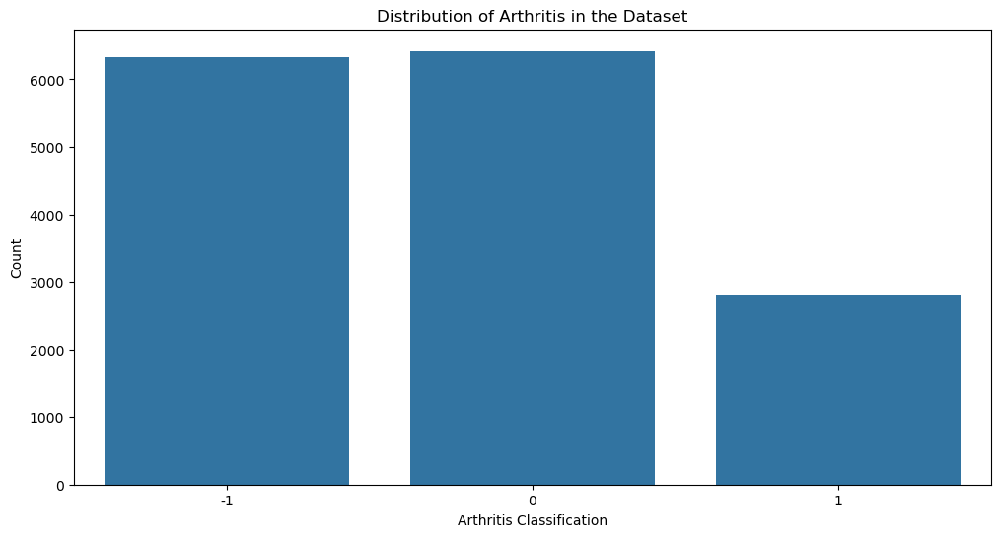

In [86]:
# Bar Chart of Arthritis Distribution
plt.figure(figsize=(12, 6))
arthritis_counts = data['label'].value_counts()
sns.barplot(x=arthritis_counts.index, y=arthritis_counts.values)
plt.title('Distribution of Arthritis in the Dataset')
plt.xlabel('Arthritis Classification')
plt.ylabel('Count')
plt.savefig('images/target-distribution.png')
plt.show()

### Features Correlation Matrix

ValueError: The number of observations cannot be determined on an empty distance matrix.

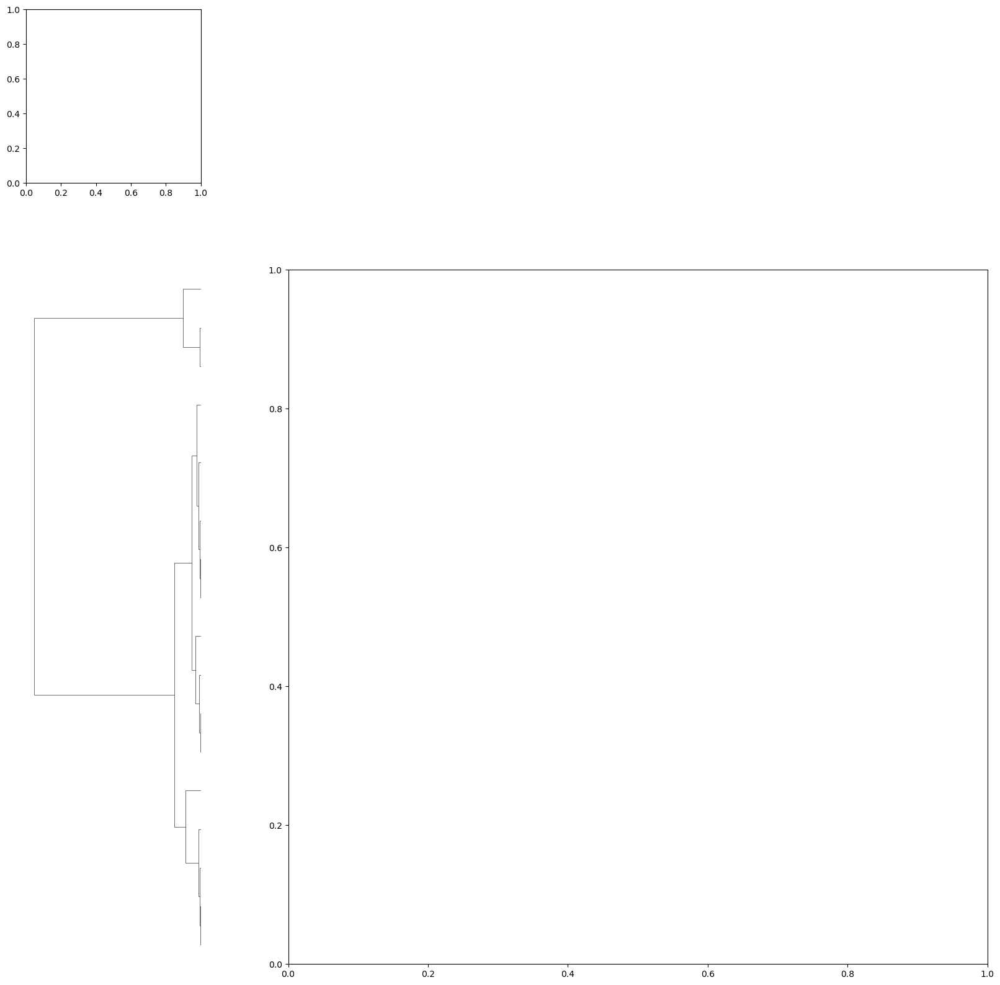

In [85]:
# Replace NaNs with zeros
correlation_matrix = correlation_matrix.fillna(0)

# Replace infinite values with zeros
correlation_matrix = correlation_matrix.replace([np.inf, -np.inf], 0)

# Check if correlation_matrix is empty
if not correlation_matrix.empty:
    # Create the clustermap
    clustermap = sns.clustermap(correlation_matrix, annot=False, cmap='coolwarm', figsize=(20, 20), cbar_pos=(1.05, 0.5, 0.05, 0.2))

    # Remove the dendrograms
    clustermap.ax_row_dendrogram.set_visible(False)
    clustermap.ax_col_dendrogram.set_visible(False)

    plt.title('Correlation Between Risk Factors', pad=20)
    plt.savefig('images/features-correlation-matrix.png')
    plt.show()
else:
    print("The correlation matrix is empty after filtering. No plot to display.")


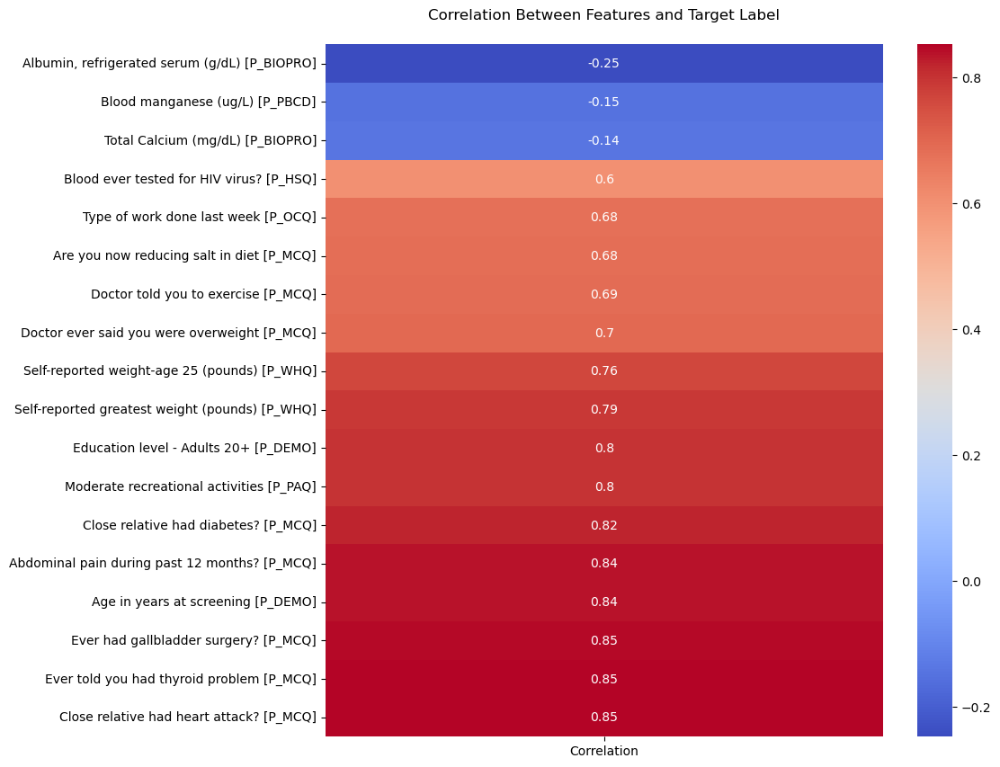

In [87]:
correlations = data.corrwith(data['label'])
correlation_matrix = pd.DataFrame(correlations, columns=['Correlation'])
correlation_matrix = correlation_matrix.fillna(0).replace([np.inf, -np.inf], 0)
correlation_matrix = correlation_matrix.drop('label')
correlation_matrix = correlation_matrix[(correlation_matrix['Correlation'] <= -0.1) | (correlation_matrix['Correlation'] >= 0.6)]
correlation_matrix = correlation_matrix.sort_values(by='Correlation')

plt.figure(figsize=(10, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', cbar=True)
plt.title('Correlation Between Features and Target Label', pad=20)
plt.savefig('images/correlation-matrix.png')
plt.show()

### Discrete Environmental Factors Bar Charts

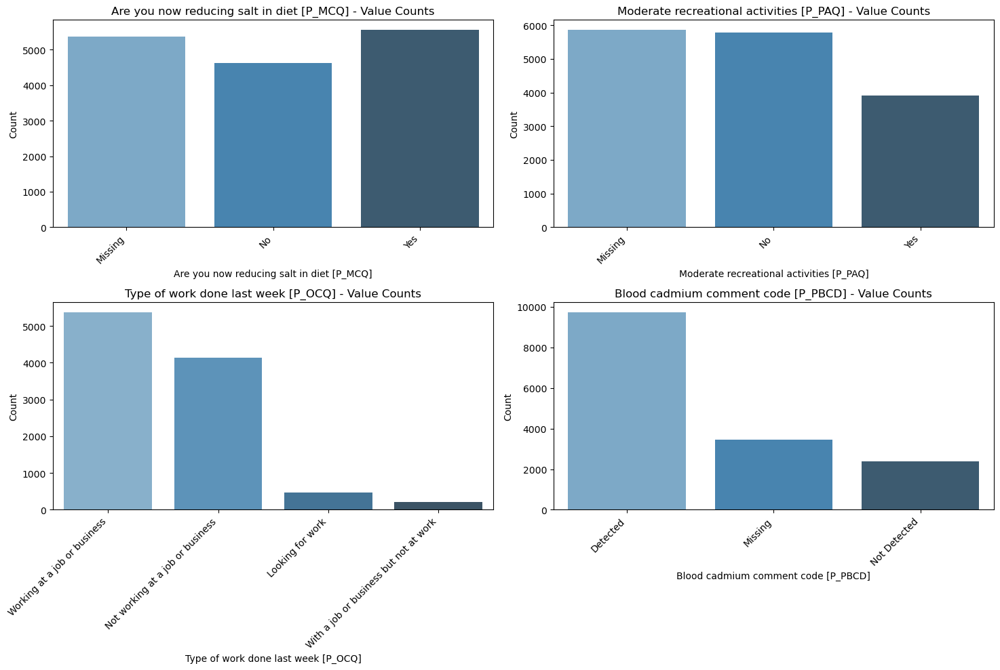

In [88]:
# Define mappings for each column
mappings = {
    "Are you now reducing salt in diet [P_MCQ]": {-1: "Missing", 1: "Yes", 2: "No"},
    "Moderate recreational activities [P_PAQ]": {-1: "Missing", 1: "Yes", 2: "No"},
    "Type of work done last week [P_OCQ]": {
        1: "Working at a job or business",
        2: "With a job or business but not at work",
        3: "Looking for work",
        4: "Not working at a job or business"
    },
    #"Blood lead comment code [P_PBCD]": {-1: "Missing", 1: "Yes", 0: "No"},
    "Blood cadmium comment code [P_PBCD]": {-1: "Missing", 1: "Not Detected", 0: "Detected"}
}

# Define sort order for general columns
general_sort_order = ["Missing", "No", "Yes"]

# Number of columns for the subplot grid
n_cols = 2
n_rows = (len(mappings) + n_cols - 1) // n_cols

# Creating the subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))

# Flattening axes array for easy iteration
axes = axes.flatten()

# Iterate over selected columns and create bar plots
for idx, column in enumerate(mappings.keys()):
    # Create value counts for the mapped values
    mapped_values = data[column].map(mappings[column])
    value_counts = mapped_values.value_counts().reset_index()
    value_counts.columns = [column, 'Count']
    
    # Apply general sort order if applicable
    if set(mappings[column].values()).issubset(general_sort_order):
        value_counts = value_counts.set_index(column).reindex(general_sort_order).reset_index()
    
    # Create the bar plot
    sns.barplot(x=column, y='Count', data=value_counts, ax=axes[idx], hue=column, dodge=False, palette='Blues_d')
    axes[idx].set_title(f'{column} - Value Counts')
    axes[idx].set_xlabel(column)
    axes[idx].set_ylabel('Count')
    
    # Remove legend if it exists
    if axes[idx].get_legend() is not None:
        axes[idx].get_legend().remove()
    
    # Set the x-ticks correctly and rotate the labels
    axes[idx].set_xticks(range(len(value_counts)))
    axes[idx].set_xticklabels(value_counts[column], rotation=45, ha='right')

# Remove any unused subplots
for ax in axes[len(mappings):]:
    fig.delaxes(ax)

plt.tight_layout()
plt.savefig('images/discrete-data.png')
plt.show()

### Box Plots of Continous Features 

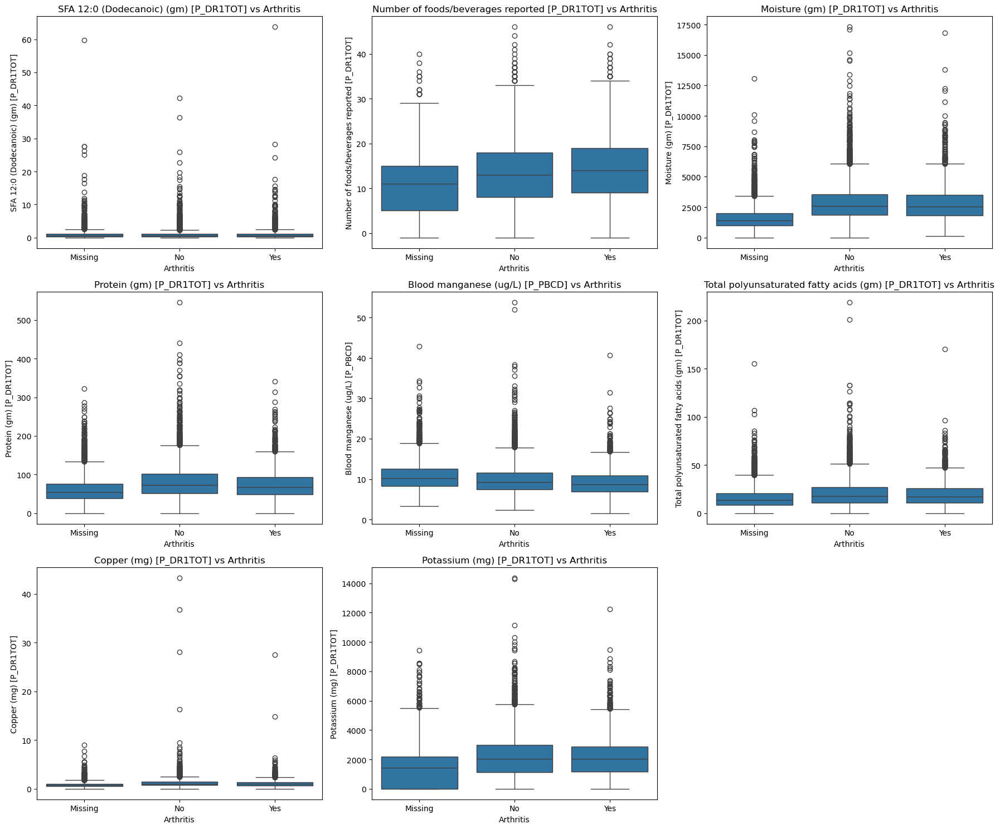

In [89]:
# Define the continuous columns
linechart_columns = [
    "SFA 12:0 (Dodecanoic) (gm) [P_DR1TOT]",
    "Number of foods/beverages reported [P_DR1TOT]",
    "Moisture (gm) [P_DR1TOT]",
    "Protein (gm) [P_DR1TOT]",
    "Blood manganese (ug/L) [P_PBCD]",
    "Total polyunsaturated fatty acids (gm) [P_DR1TOT]",
    "Copper (mg) [P_DR1TOT]",
    "Potassium (mg) [P_DR1TOT]"
]

# Arthritis column
arthritis_column = "label"

# Define sort order for arthritis labels
arthritis_sort_order = ["Missing", "No", "Yes"]

# Number of columns for the subplot grid
n_cols = 3
n_rows = (len(linechart_columns) + n_cols - 1) // n_cols

# Creating the subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 5 * n_rows))

# Flattening axes array for easy iteration
axes = axes.flatten()

# Create a copy of the relevant columns from the data
data_copy = data[linechart_columns + [arthritis_column]].copy()

# Mapping arthritis column values in the copy without altering original data
data_copy[arthritis_column] = data_copy[arthritis_column].map({-1: "Missing", 0: "No", 1: "Yes"})

# Iterate over selected columns and create box plots
for idx, column in enumerate(linechart_columns):
    # Create the box plot
    sns.boxplot(x=arthritis_column, y=column, data=data_copy, ax=axes[idx], order=arthritis_sort_order)
    axes[idx].set_title(f'{column} vs Arthritis')
    axes[idx].set_xlabel('Arthritis')
    axes[idx].set_ylabel(column)

# Remove any unused subplots
for ax in axes[len(linechart_columns):]:
    fig.delaxes(ax)

plt.tight_layout()
plt.savefig('images/continuous-data.png')
plt.show()

## Zoomed in Box Plots

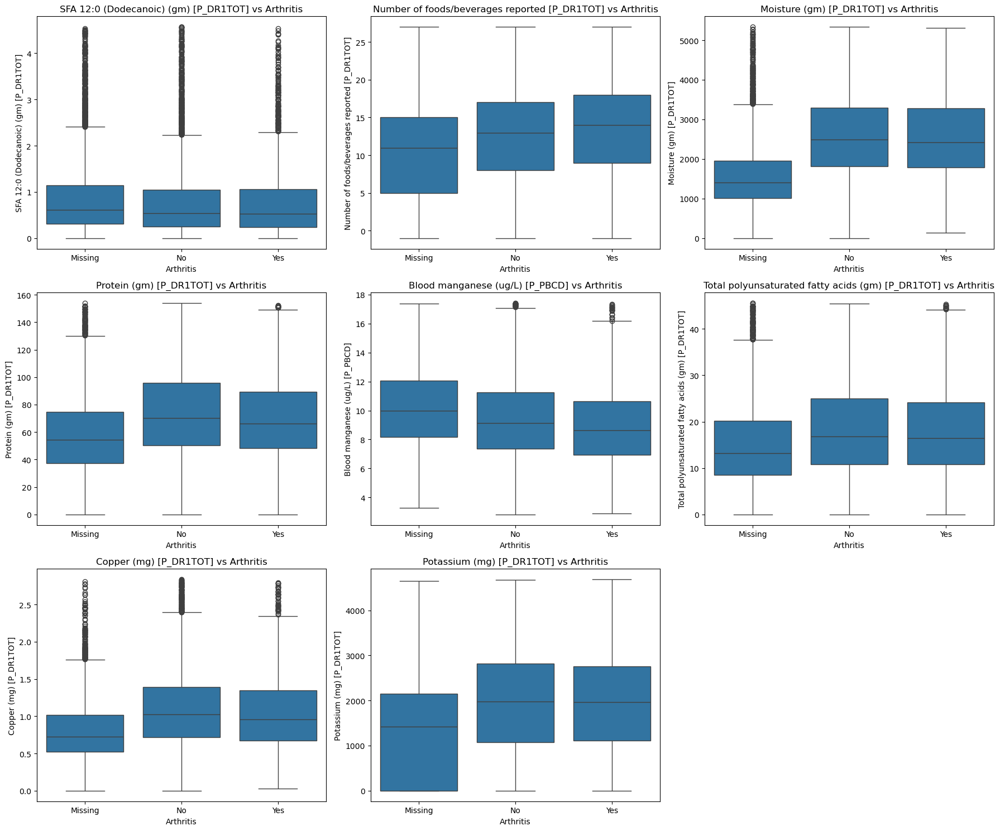

In [90]:
# Arthritis column
arthritis_column = "label"

# Define sort order for arthritis labels
arthritis_sort_order = ["Missing", "No", "Yes"]

# Number of columns for the subplot grid
n_cols = 3
n_rows = (len(linechart_columns) + n_cols - 1) // n_cols

# Creating the subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 5 * n_rows))

# Flattening axes array for easy iteration
axes = axes.flatten()

# Create a copy of the data to work with
data_copy = data.copy()

# Mapping arthritis column values in the copy without altering original data
mapped_arthritis = data_copy[arthritis_column].map({-1: "Missing", 0: "No", 1: "Yes"})

# Function to remove outliers beyond 2 std devs
def remove_outliers(df, column):
    mean = df[column].mean()
    std_dev = df[column].std()
    return df[(df[column] >= (mean - 2 * std_dev)) & (df[column] <= (mean + 2 * std_dev))]

# Iterate over selected columns and create box plots with outliers removed
for idx, column in enumerate(linechart_columns):
    # Remove outliers from the data for plotting
    filtered_data = remove_outliers(data_copy, column).copy()
    filtered_data[arthritis_column] = mapped_arthritis
    
    # Ensure all categories are present in the filtered data without modifying the original data
    for category in arthritis_sort_order:
        if category not in filtered_data[arthritis_column].unique():
            filtered_data = pd.concat([filtered_data, pd.DataFrame({arthritis_column: [category], column: [None]})], ignore_index=True)
    
    # Create the box plot
    sns.boxplot(x=arthritis_column, y=column, data=filtered_data, ax=axes[idx], order=arthritis_sort_order)
    axes[idx].set_title(f'{column} vs Arthritis')
    axes[idx].set_xlabel('Arthritis')
    axes[idx].set_ylabel(column)

# Remove any unused subplots
for ax in axes[len(linechart_columns):]:
    fig.delaxes(ax)

plt.tight_layout()
plt.savefig('images/continuous-data-zoomed-in.png')
plt.show()



# Comprehensive Report on Risk Factors for Arthritis with Risk Indicators

The following analysis categorizes the identified risk factors for arthritis based on their statistical significance (p < 0.05). The factors are divided into several categories: environmental factors, known risk factors, early warning signs, ways to diagnose, and other relevant factors. For each factor, the conditions that increase the risk of arthritis are indicated.

## Disclaimer
P-values are a tried and true method for finding risk factors, but a relationship does not guarantee it is a risk factor. This is done with novice domain knowledge, and risk factors must be assessed by medical professionals and other experts past this.

## 1. Environmental Factors

### Behavioral and Lifestyle Factors
- **Are you now reducing salt in diet [P_MCQ]:** (Not reducing salt increases risk) High salt intake can influence inflammation and immune response, potentially contributing to arthritis.
- **Moderate recreational activities [P_PAQ]:** (Less activity increases risk) Lack of physical activity can contribute to obesity and joint stress, increasing arthritis risk.
- **SFA 12:0 (Dodecanoic) (gm) [P_DR1TOT]:** (Higher intake increases risk) Higher intake of saturated fatty acids can contribute to inflammation.
- **Number of foods/beverages reported [P_DR1TOT]:** (Lower diversity or higher quantity increases risk) Limited dietary diversity can affect inflammation and overall health. Additionally, consuming a higher quantity of certain foods might also contribute to inflammation.
- **Moisture (gm) [P_DR1TOT]:** (Lower moisture content increases risk) Lower moisture content in diet can affect hydration status, impacting joint health.
- **Protein (gm) [P_DR1TOT]:** (High intake can be beneficial) Adequate protein intake is essential for muscle and joint health, potentially reducing arthritis risk.
- **Total polyunsaturated fatty acids (gm) [P_DR1TOT]:** (Higher intake can be beneficial) Polyunsaturated fatty acids have anti-inflammatory properties.
- **Copper (mg) [P_DR1TOT]:** (Imbalance increases risk) Copper plays a role in maintaining healthy connective tissues.
- **Potassium (mg) [P_DR1TOT]:** (Adequate intake can be beneficial) Proper potassium levels are important for muscle and nerve function.

### Occupational and Environmental Exposures
- **Type of work done last week [P_OCQ]:** (Physically demanding jobs increase risk) Certain types of work can stress joints and increase arthritis risk.
- **Blood manganese (ug/L) [P_PBCD]:** (Abnormal levels increase risk) Abnormal levels of manganese can affect joint health.
- **Blood lead comment code [P_PBCD]:** (High exposure increases risk) Exposure to lead and other heavy metals can be associated with inflammatory responses.
- **Blood cadmium comment code [P_PBCD]:** (High exposure increases risk) Cadmium exposure is linked to inflammation.

## 2. Well Known Risk Factors

- **HS C-Reactive Protein (mg/L) [P_HSCRP]:** (High levels increase risk) Elevated levels of C-reactive protein are associated with inflammation, a key factor in the development and progression of arthritis.
- **Doctor ever said you were overweight [P_MCQ]:** (Yes increases risk) Obesity is a significant risk factor for arthritis.
- **Ever told you had thyroid problem [P_MCQ]:** (Yes increases risk) Thyroid dysfunction is associated with autoimmune conditions.

## 3. Possible Early Warning Signs

- **Iron, refrigerated serum (ug/dL) [P_BIOPRO]:** (Low levels increase risk) Disrupted iron metabolism can be a sign of inflammation.
- **Iron, refrigerated serum (umol/L) [P_BIOPRO]:** (Low levels increase risk) Disrupted iron metabolism can be a sign of inflammation.
- **Lactate Dehydrogenase (LDH) (IU/L) [P_BIOPRO]:** (High levels increase risk) Elevated LDH levels can indicate tissue damage.
- **Red cell distribution width (%) [P_CBC]:** (High levels increase risk) High variability in red blood cell size can indicate inflammation.
- **Monocyte number (1000 cells/uL) [P_CBC]:** (High levels increase risk) Elevated monocytes are a sign of inflammation.
- **Mean cell hemoglobin concentration (g/dL) [P_CBC]:** (Low levels increase risk) Changes can indicate anemia related to chronic disease.
- **Mean cell volume (fL) [P_CBC]:** (Low levels increase risk) Altered levels can suggest anemia.
- **Albumin, refrigerated serum (g/dL) [P_BIOPRO]:** (Low levels increase risk) Lower levels suggest chronic inflammation.
- **Blood Urea Nitrogen (mg/dL) [P_BIOPRO]:** (High levels increase risk) Indicates kidney function.
- **Potassium (mmol/L) [P_BIOPRO]:** (High or low levels increase risk) Imbalance can affect muscle and nerve function.
- **Globulin (g/dL) [P_BIOPRO]:** (High levels increase risk) Higher levels can be a marker of chronic inflammation.
- **Total Calcium (mg/dL) [P_BIOPRO]:** (High or low levels increase risk) Calcium imbalance can affect bone health.
- **Creatinine, refrigerated serum (mg/dL) [P_BIOPRO]:** (High levels increase risk) Indicates kidney function.
- **Iron frozen, Serum (umol/L) [P_FETIB]:** (Low levels increase risk) Reflects iron storage and metabolism.
- **Trouble sleeping or sleeping too much [P_DPQ]:** (Yes increases risk) Sleep disturbances are common in arthritis patients.
- **Moving or speaking slowly or too fast [P_DPQ]:** (Yes increases risk) Psychomotor changes can be associated with chronic pain and depression in arthritis.
- **Poor appetite or overeating [P_DPQ]:** (Yes increases risk) Dietary habits can influence arthritis risk.
- **Abdominal pain during past 12 months? [P_MCQ]:** (Yes increases risk) Chronic pain can be an early sign of arthritis.
- **Self-reported greatest weight (pounds) [P_WHQ]:** (High weight increases risk) Weight history can indicate risk of obesity-related arthritis.
- **Self-reported weight-age 25 (pounds) [P_WHQ]:** (High weight increases risk) Historical weight can provide insights into long-term risk factors.

## 4. Possible Diagnosis Markers

- **HS C-Reactive Protein (mg/L) [P_HSCRP]:** (High levels) Inflammation marker used in diagnosis.
- **Iron, refrigerated serum (umol/L) [P_BIOPRO]:** (Low levels) Inflammation and iron metabolism marker.
- **Lactate Dehydrogenase (LDH) (IU/L) [P_BIOPRO]:** (High levels) Tissue damage marker.
- **Albumin, refrigerated serum (g/dL) [P_BIOPRO]:** (Low levels) Chronic inflammation marker.
- **Blood Urea Nitrogen (mg/dL) [P_BIOPRO]:** (High levels) Kidney function marker.
- **Potassium (mmol/L) [P_BIOPRO]:** (High or low levels) Muscle and nerve function marker.
- **Globulin (g/dL) [P_BIOPRO]:** (High levels) Chronic inflammation marker.
- **Total Calcium (mg/dL) [P_BIOPRO]:** (High or low levels) Bone health marker.
- **Creatinine, refrigerated serum (mg/dL) [P_BIOPRO]:** (High levels) Kidney function marker.
- **Iron frozen, Serum (umol/L) [P_FETIB]:** (Low levels) Iron storage and metabolism marker.
- **Red cell distribution width (%) [P_CBC]:** (High levels) Inflammation marker.
- **Monocyte number (1000 cells/uL) [P_CBC]:** (High levels) Inflammation marker.
- **Mean cell hemoglobin concentration (g/dL) [P_CBC]:** (Low levels) Anemia marker.
- **Mean cell volume (fL) [P_CBC]:** (Low levels) Anemia marker.

## 5. Other Relevant Factors

### Demographic Factors
- **Age in years at screening [P_DEMO]:** (Older age increases risk) Age is a well-known risk factor for arthritis.
- **Gender [P_DEMO]:** (Women are at higher risk) Gender can influence arthritis risk, with women being more prone to certain types.
- **Country of birth [P_DEMO]:** (Varies) Geographical and genetic factors may play a role in arthritis prevalence.
- **Education level - Adults 20+ [P_DEMO]:** (Lower education increases risk) Lower education levels are often associated with higher arthritis risk due to socioeconomic factors.
- **Family monthly poverty level category [P_INQ]:** (Lower income increases risk) Lower socioeconomic status is associated with higher arthritis risk due to limited access to healthcare and healthy lifestyle options.

### Medical History and Screening
- **Blood ever tested for HIV virus? [P_HSQ]:** (Positive result increases risk) Indicates the history of medical screening and potential immunocompromised status.
- **Total # of Antacids Taken [P_DSQTOT]:** (Higher usage increases risk) High usage of antacids can reflect gastrointestinal issues linked to arthritis.
- **Total # of Dietary Supplements Taken [P_DSQTOT]:** (Higher usage) Supplement use can indicate attempts to manage chronic conditions.
- **Received Hepatitis A vaccine [P_IMQ]:** (Vaccination status) While not a direct risk factor, vaccination status can reflect overall health management.

### Oral Health Indicators
- **Tooth Count: #10, #12, #24, #28 [P_OHXDEN]:** (Fewer teeth increases risk) Reduced tooth count can indicate poor oral health, which is linked to systemic inflammation.
- **Coronal Caries: Tooth Count #24 [P_OHXDEN]:** (More caries increases risk) Dental caries are indicators of oral health, affecting overall health.
- **Dental Implant: yes / no? [P_OHXDEN]:** (Yes increases risk) Presence of dental implants indicates prior oral health issues.

### Family Medical History
- **Close relative had heart attack? [P_MCQ]:** (Yes increases risk) Family history of cardiovascular disease can be linked to inflammatory conditions.
- **Close relative had asthma? [P_MCQ]:** (Yes increases risk) Family history of asthma suggests a predisposition to autoimmune conditions.
- **Close relative had diabetes? [P_MCQ]:** (Yes increases risk) Family history of diabetes is linked to metabolic syndrome and inflammation.

### Self-Reported Health Conditions
- **Ever been told you have asthma [P_MCQ]:** (Yes increases risk) Asthma and other autoimmune conditions are associated with higher arthritis risk.
- **Ever had gallbladder surgery? [P_MCQ]:** (Yes increases risk) History of gallbladder issues can indicate metabolic problems.
